In [1]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score 
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Breast Cancer Prediction  

In [2]:
df=pd.read_csv('breast-cancer.csv')

In [3]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [4]:
df.shape

(569, 32)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [6]:

df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,569.0,3.037183e+07,1.250206e+08,8670.000000,869218.000000,906024.000000,8.813129e+06,9.113205e+08
radius_mean,569.0,1.412729e+01,3.524049e+00,6.981000,11.700000,13.370000,1.578000e+01,2.811000e+01
texture_mean,569.0,1.928965e+01,4.301036e+00,9.710000,16.170000,18.840000,2.180000e+01,3.928000e+01
perimeter_mean,569.0,9.196903e+01,2.429898e+01,43.790000,75.170000,86.240000,1.041000e+02,1.885000e+02
area_mean,569.0,6.548891e+02,3.519141e+02,143.500000,420.300000,551.100000,7.827000e+02,2.501000e+03
smoothness_mean,569.0,9.636028e-02,1.406413e-02,0.052630,0.086370,0.095870,1.053000e-01,1.634000e-01
compactness_mean,569.0,1.043410e-01,5.281276e-02,0.019380,0.064920,0.092630,1.304000e-01,3.454000e-01
concavity_mean,569.0,8.879932e-02,7.971981e-02,0.000000,0.029560,0.061540,1.307000e-01,4.268000e-01
concave points_mean,569.0,4.891915e-02,3.880284e-02,0.000000,0.020310,0.033500,7.400000e-02,2.012000e-01
symmetry_mean,569.0,1.811619e-01,2.741428e-02,0.106000,0.161900,0.179200,1.957000e-01,3.040000e-01


In [7]:
df.isnull().sum()/len(df)

id                         0.0
diagnosis                  0.0
radius_mean                0.0
texture_mean               0.0
perimeter_mean             0.0
area_mean                  0.0
smoothness_mean            0.0
compactness_mean           0.0
concavity_mean             0.0
concave points_mean        0.0
symmetry_mean              0.0
fractal_dimension_mean     0.0
radius_se                  0.0
texture_se                 0.0
perimeter_se               0.0
area_se                    0.0
smoothness_se              0.0
compactness_se             0.0
concavity_se               0.0
concave points_se          0.0
symmetry_se                0.0
fractal_dimension_se       0.0
radius_worst               0.0
texture_worst              0.0
perimeter_worst            0.0
area_worst                 0.0
smoothness_worst           0.0
compactness_worst          0.0
concavity_worst            0.0
concave points_worst       0.0
symmetry_worst             0.0
fractal_dimension_worst    0.0
dtype: f

In [8]:
duplicate=df.duplicated()
df[duplicate]

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst


In [9]:
df.drop(['id'],axis=1,inplace=True)

In [10]:
df['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

In [11]:
df['diagnosis']=df['diagnosis'].replace({'M':1 , 'B':0})

In [12]:
df['diagnosis'].value_counts()

0    357
1    212
Name: diagnosis, dtype: int64

In [13]:
cat_cols=df.select_dtypes(include=['object']).columns
num_cols = df.select_dtypes(include=np.number).columns.tolist()
print("Categorical Variables:")
print(cat_cols)
print("Numerical Variables:")
print(num_cols)

Categorical Variables:
Index([], dtype='object')
Numerical Variables:
['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se', 'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se', 'fractal_dimension_se', 'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst', 'smoothness_worst', 'compactness_worst', 'concavity_worst', 'concave points_worst', 'symmetry_worst', 'fractal_dimension_worst']


diagnosis
Skew : 0.53
Variance : 0.23


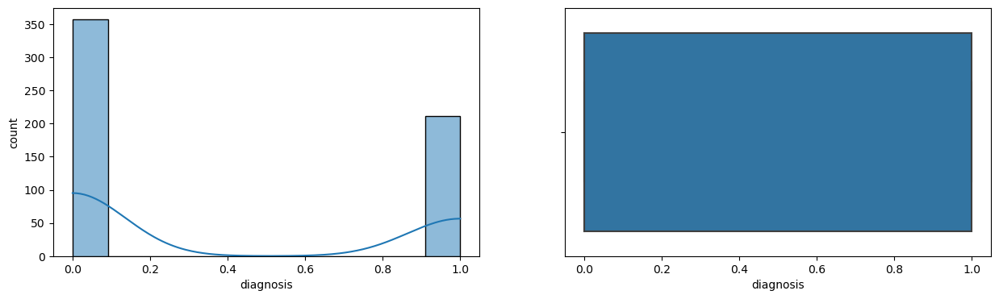

radius_mean
Skew : 0.94
Variance : 12.42


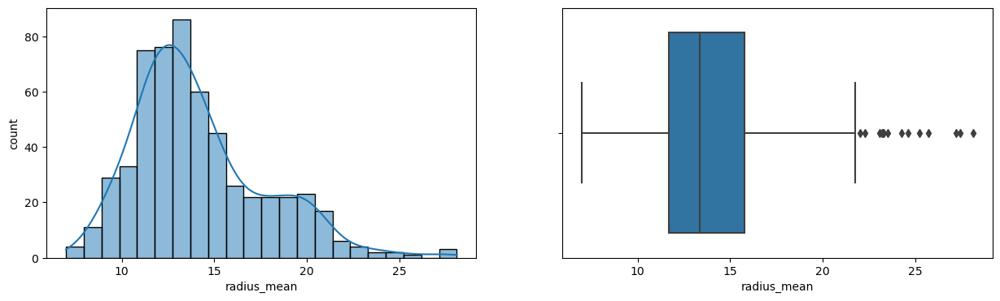

texture_mean
Skew : 0.65
Variance : 18.5


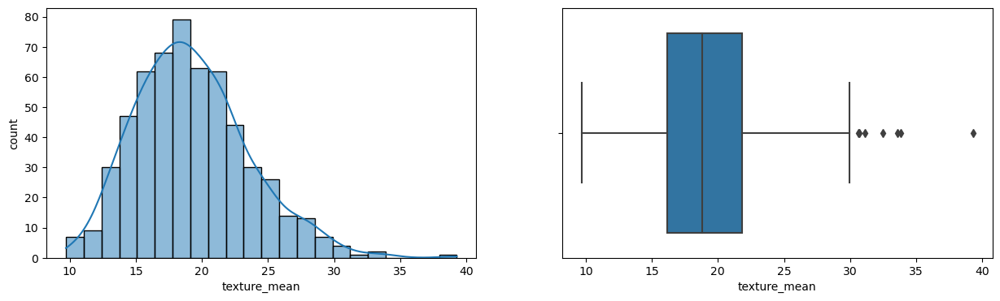

perimeter_mean
Skew : 0.99
Variance : 590.44


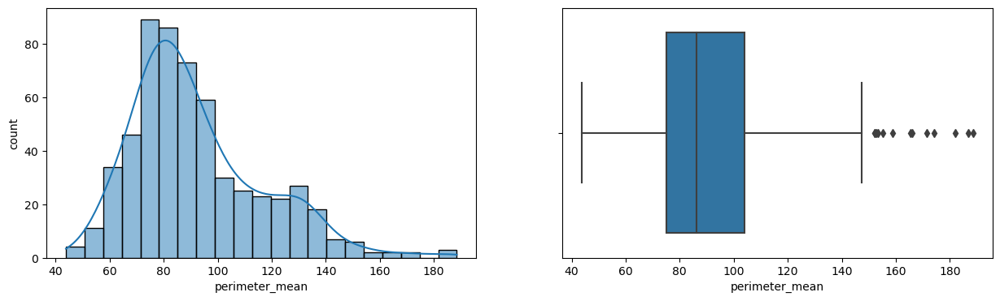

area_mean
Skew : 1.65
Variance : 123843.55


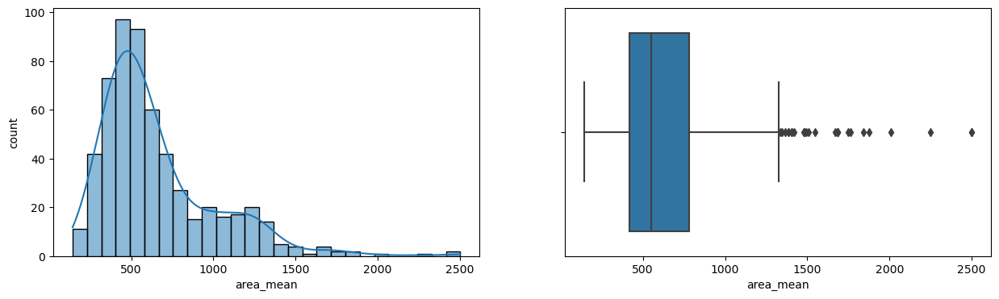

smoothness_mean
Skew : 0.46
Variance : 0.0


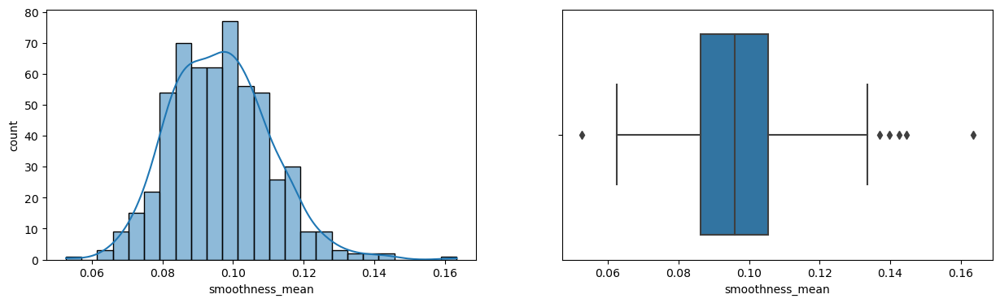

compactness_mean
Skew : 1.19
Variance : 0.0


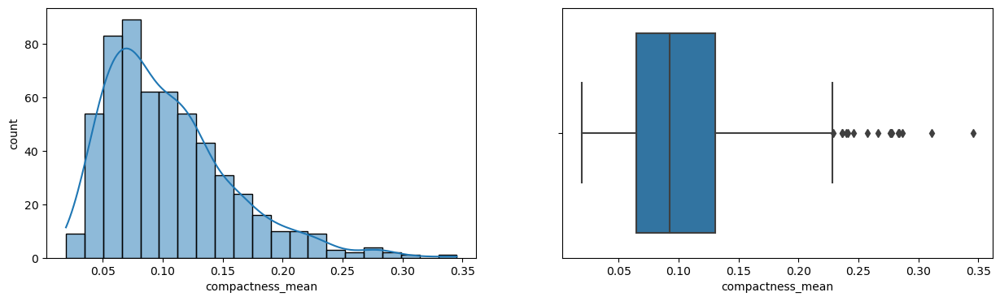

concavity_mean
Skew : 1.4
Variance : 0.01


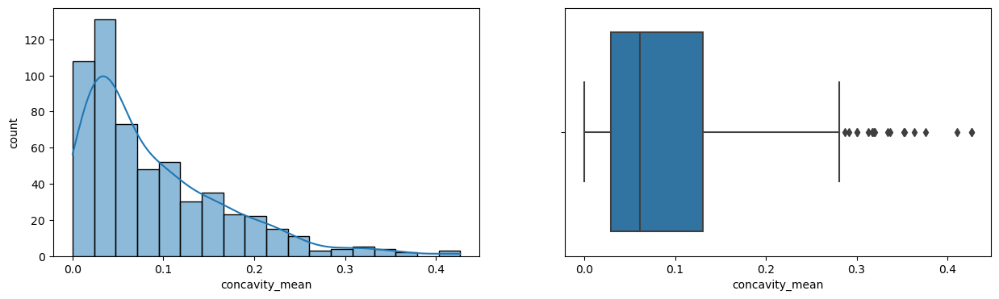

concave points_mean
Skew : 1.17
Variance : 0.0


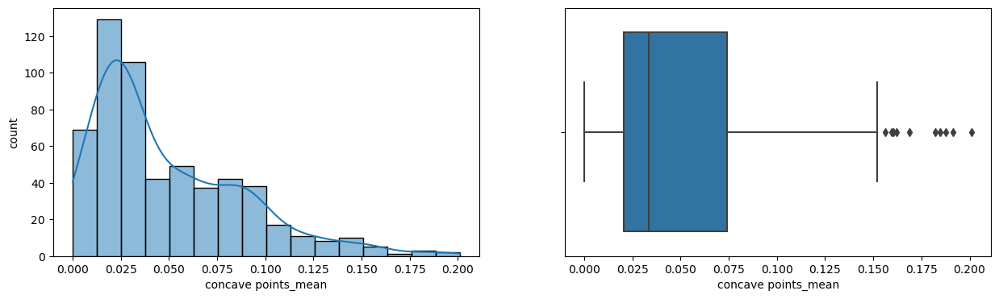

symmetry_mean
Skew : 0.73
Variance : 0.0


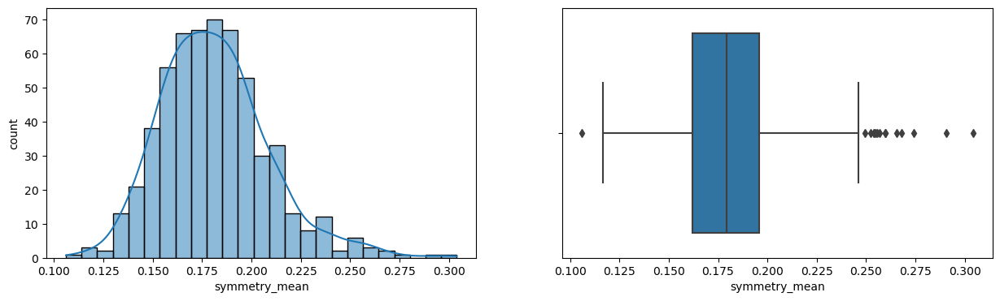

fractal_dimension_mean
Skew : 1.3
Variance : 0.0


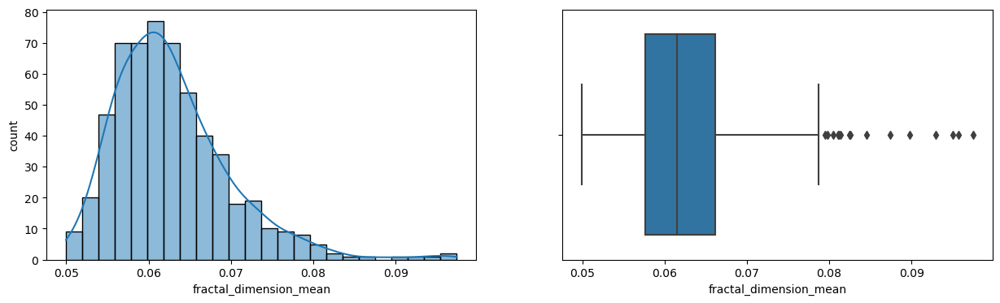

radius_se
Skew : 3.09
Variance : 0.08


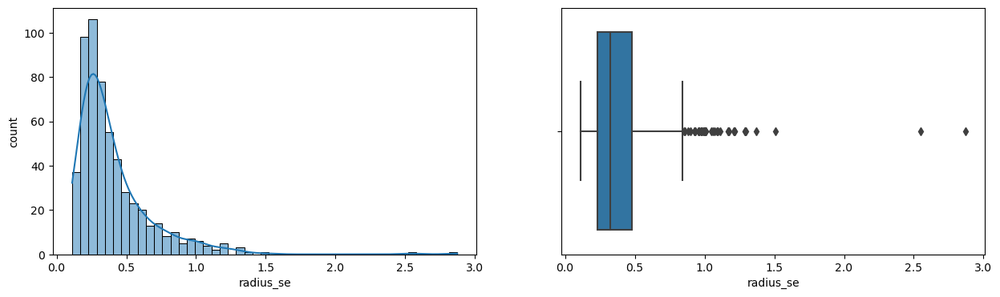

texture_se
Skew : 1.65
Variance : 0.3


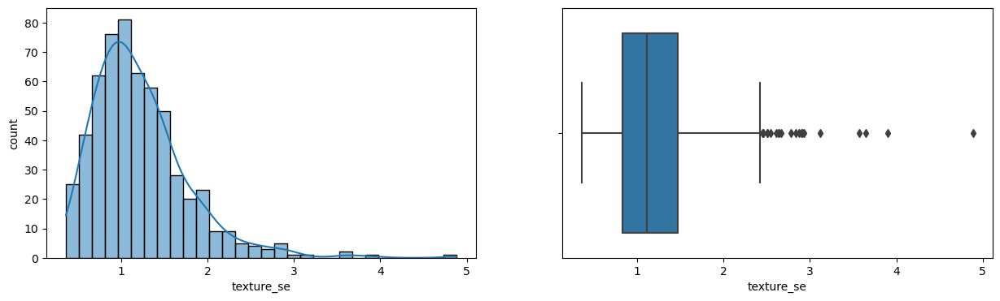

perimeter_se
Skew : 3.44
Variance : 4.09


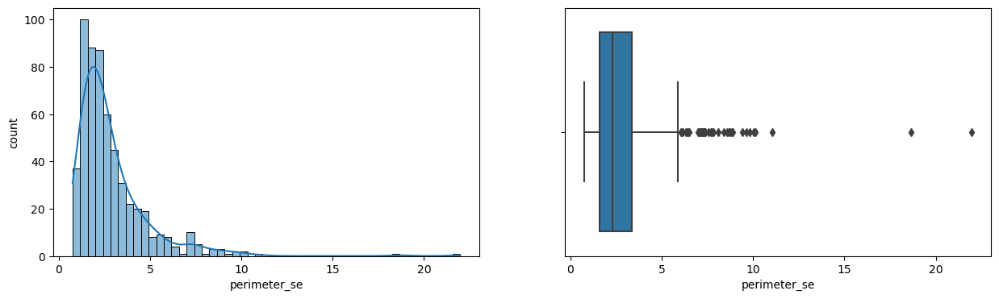

area_se
Skew : 5.45
Variance : 2069.43


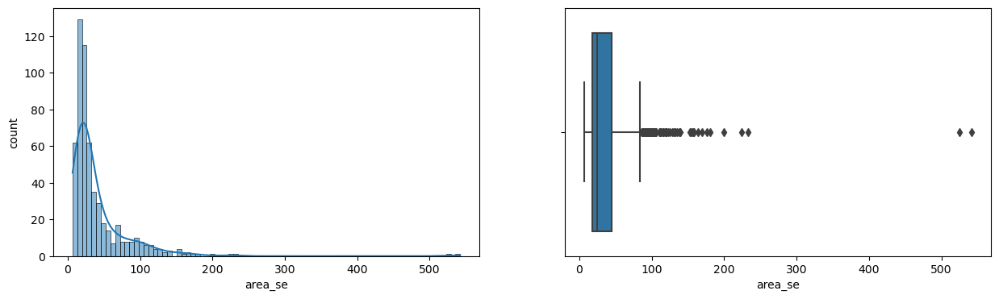

smoothness_se
Skew : 2.31
Variance : 0.0


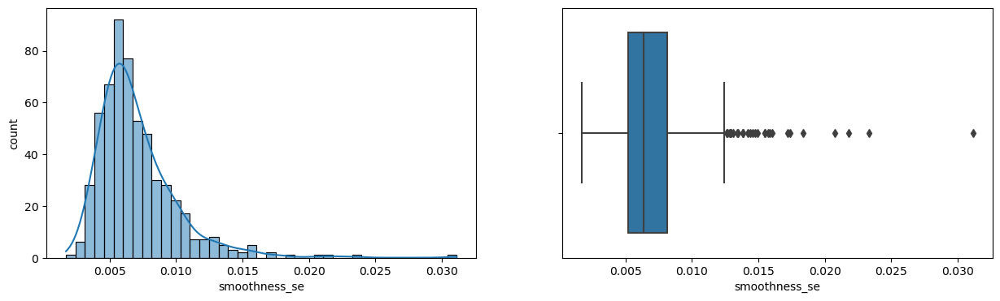

compactness_se
Skew : 1.9
Variance : 0.0


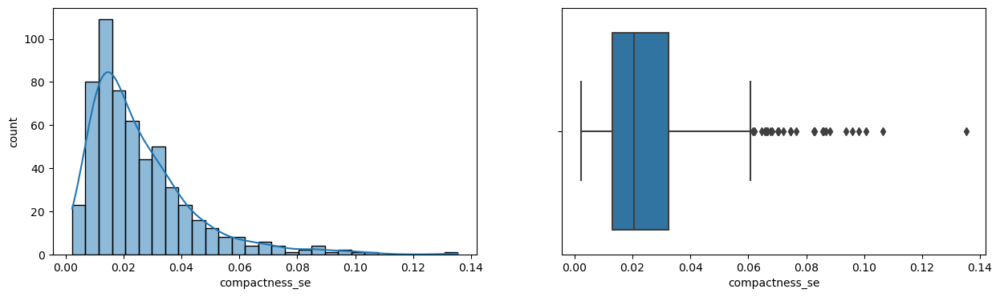

concavity_se
Skew : 5.11
Variance : 0.0


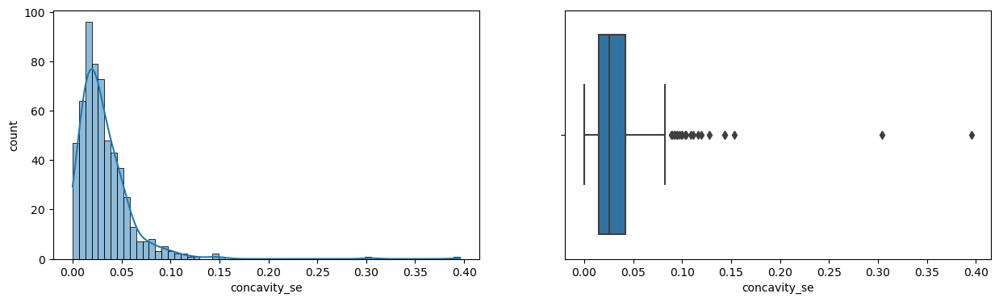

concave points_se
Skew : 1.44
Variance : 0.0


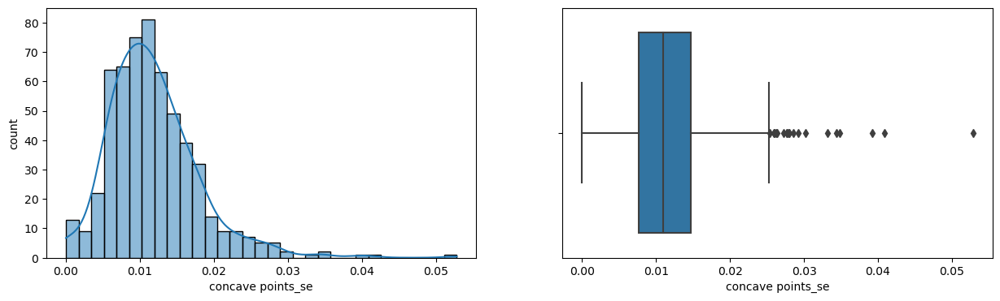

symmetry_se
Skew : 2.2
Variance : 0.0


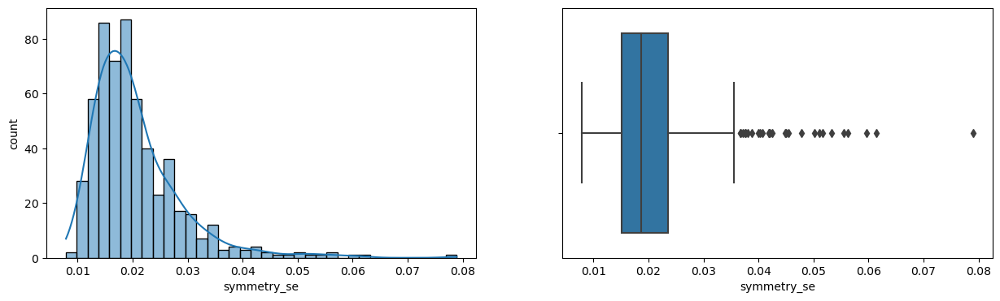

fractal_dimension_se
Skew : 3.92
Variance : 0.0


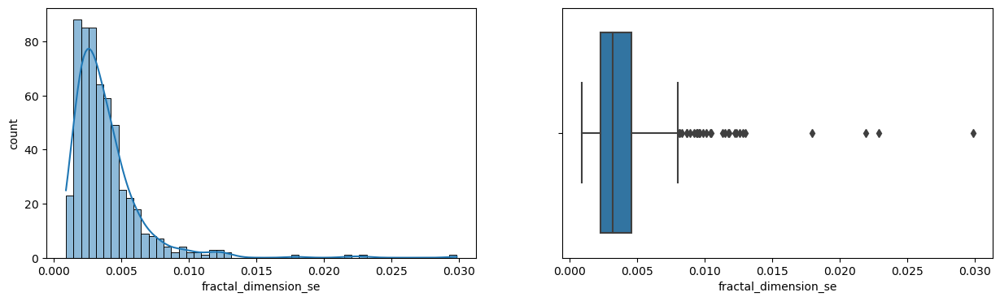

radius_worst
Skew : 1.1
Variance : 23.36


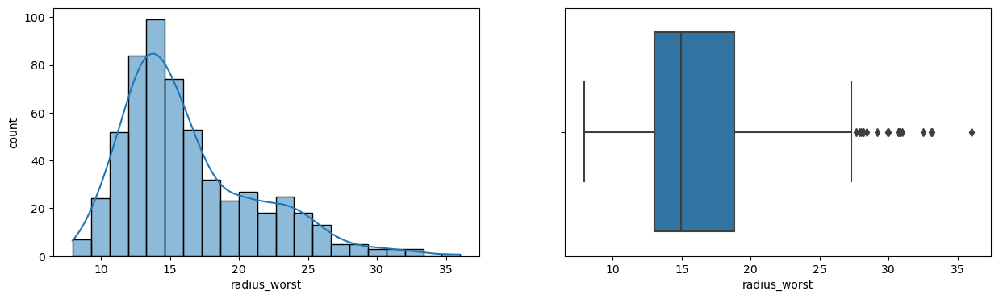

texture_worst
Skew : 0.5
Variance : 37.78


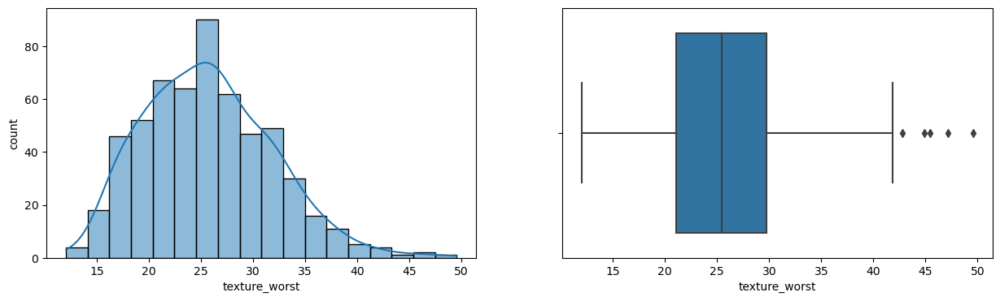

perimeter_worst
Skew : 1.13
Variance : 1129.13


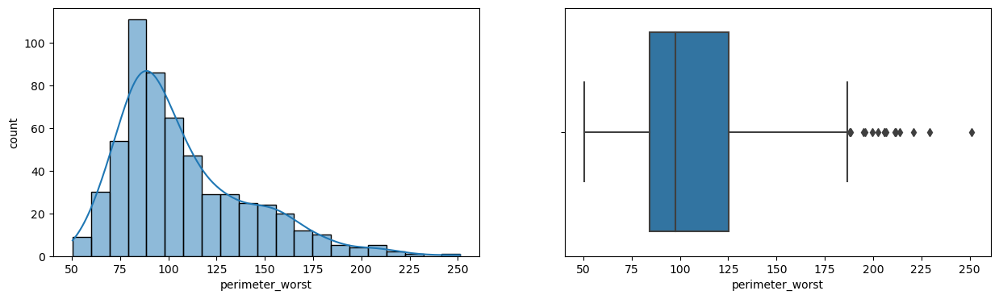

area_worst
Skew : 1.86
Variance : 324167.39


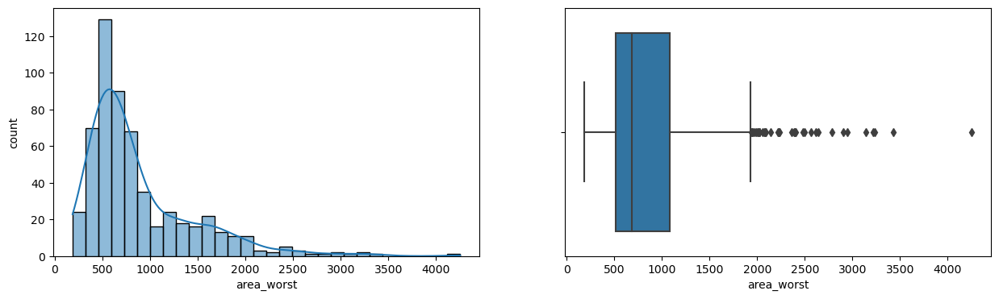

smoothness_worst
Skew : 0.42
Variance : 0.0


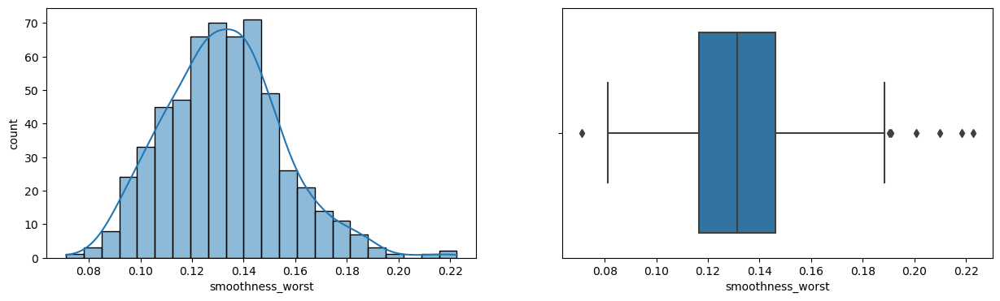

compactness_worst
Skew : 1.47
Variance : 0.02


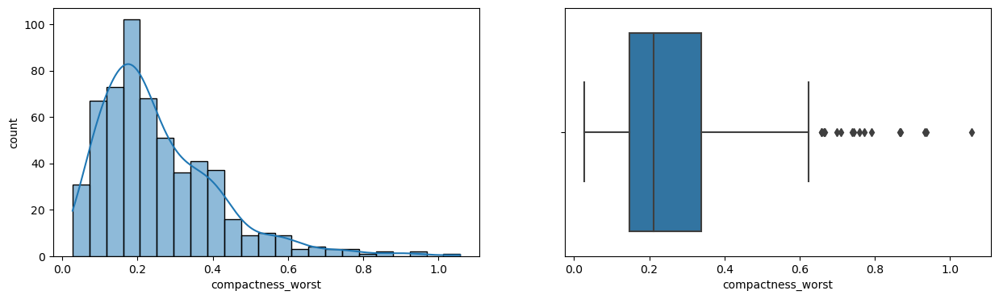

concavity_worst
Skew : 1.15
Variance : 0.04


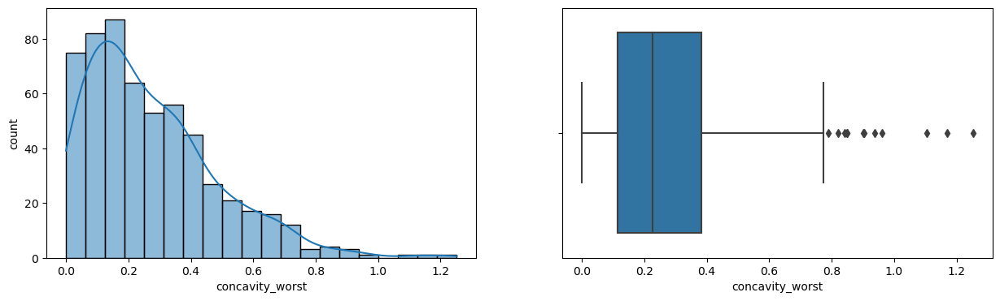

concave points_worst
Skew : 0.49
Variance : 0.0


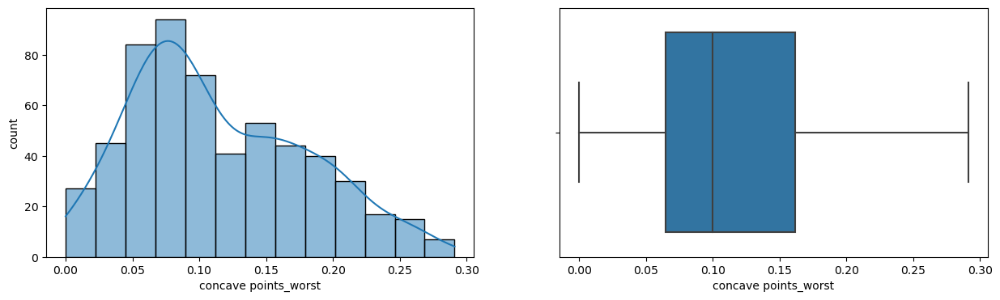

symmetry_worst
Skew : 1.43
Variance : 0.0


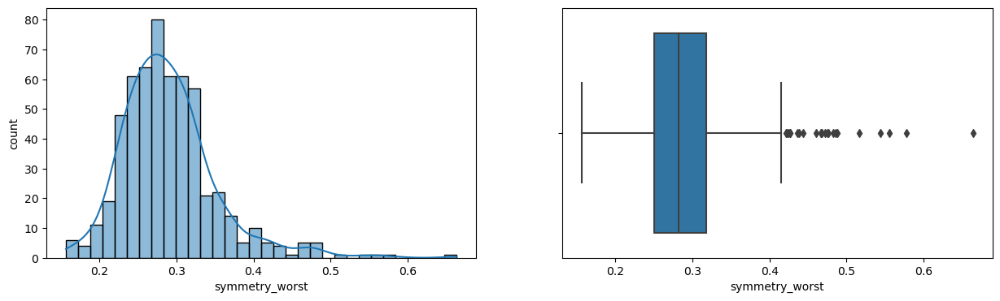

fractal_dimension_worst
Skew : 1.66
Variance : 0.0


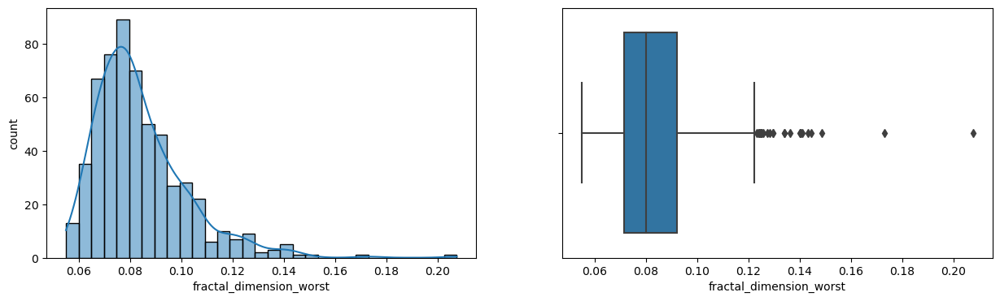

In [15]:
for col in num_cols:
    print(col)
    print('Skew :', round(df[col].skew(), 2))
    print('Variance :', round(df[col].var(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    sns.histplot(x=df[col],kde= True) 
#   df[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df[col])
    plt.show()


In [66]:
num_cols.remove('diagnosis')

In [67]:
# Removing outliers below 10th and above 90th percentile
for col in num_cols : 
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3-q1
    range_low  = q1-1.5*iqr
    range_high = q3+1.5*iqr
    # Assigning the filtered dataset into data
    data = df.loc[(df[col] > range_low) & (df[col] < range_high)]


In [68]:
data

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
6,1,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,0.1794,...,22.880,27.66,153.20,1606.0,0.14420,0.25760,0.3784,0.1932,0.3063,0.08368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
563,1,20.92,25.09,143.00,1347.0,0.10990,0.22360,0.31740,0.14740,0.2149,...,24.290,29.41,179.10,1819.0,0.14070,0.41860,0.6599,0.2542,0.2929,0.09873
564,1,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,1,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,1,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820


In [103]:
# Create positive correlation matrix
corr_df = data.corr().abs()
# Create and apply mask
mask = np.triu(np.ones_like(corr_df, dtype=bool))
tri_df = corr_df.mask(mask)

In [104]:
tri_df

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
diagnosis,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
radius_mean,0.749816,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
texture_mean,0.404242,0.313007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
perimeter_mean,0.758962,0.998022,0.316684,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
area_mean,0.729719,0.987320,0.313039,0.986759,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
smoothness_mean,0.342613,0.204503,0.028619,0.237460,0.210470,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
compactness_mean,0.591747,0.560930,0.219252,0.607952,0.552970,0.631961,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
concavity_mean,0.705683,0.725640,0.290206,0.761293,0.734312,0.509104,0.892747,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
concave points_mean,0.776258,0.841397,0.279025,0.866800,0.841973,0.549808,0.844669,0.934503,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
symmetry_mean,0.310970,0.171910,0.050310,0.203173,0.174726,0.531422,0.566547,0.463842,0.446058,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [203]:
# Find columns that meet threshold
to_drop = [c for c in tri_df.columns if any(tri_df[c] >= 0.8)]
print(to_drop)

['radius_mean', 'texture_mean', 'perimeter_mean', 'area_mean', 'compactness_mean', 'concavity_mean', 'concave points_mean', 'radius_se', 'perimeter_se', 'area_se', 'compactness_se', 'radius_worst', 'perimeter_worst', 'compactness_worst', 'concavity_worst']


In [204]:
# Drop those columns
reduced_df = data.drop(to_drop, axis=1)

In [205]:
reduced_df

,diagnosis,smoothness_mean,symmetry_mean,fractal_dimension_mean,texture_se,smoothness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,texture_worst,area_worst,smoothness_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,0.11840,0.2419,0.07871,0.9053,0.006399,0.05373,0.01587,0.03003,0.006193,17.33,2019.0,0.16220,0.2654,0.4601,0.11890
1,1,0.08474,0.1812,0.05667,0.7339,0.005225,0.01860,0.01340,0.01389,0.003532,23.41,1956.0,0.12380,0.1860,0.2750,0.08902
2,1,0.10960,0.2069,0.05999,0.7869,0.006150,0.03832,0.02058,0.02250,0.004571,25.53,1709.0,0.14440,0.2430,0.3613,0.08758
4,1,0.10030,0.1809,0.05883,0.7813,0.011490,0.05688,0.01885,0.01756,0.005115,16.67,1575.0,0.13740,0.1625,0.2364,0.07678
6,1,0.09463,0.1794,0.05742,0.7732,0.004314,0.02254,0.01039,0.01369,0.002179,27.66,1606.0,0.14420,0.1932,0.3063,0.08368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
563,1,0.10990,0.2149,0.06879,1.0260,0.006399,0.07845,0.02624,0.02057,0.006213,29.41,1819.0,0.14070,0.2542,0.2929,0.09873
564,1,0.11100,0.1726,0.05623,1.2560,0.010300,0.05198,0.02454,0.01114,0.004239,26.40,2027.0,0.14100,0.2216,0.2060,0.07115
565,1,0.09780,0.1752,0.05533,2.4630,0.005769,0.03950,0.01678,0.01898,0.002498,38.25,1731.0,0.11660,0.1628,0.2572,0.06637
566,1,0.08455,0.1590,0.05648,1.0750,0.005903,0.04730,0.01557,0.01318,0.003892,34.12,1124.0,0.11390,0.1418,0.2218,0.07820


Correlation between diagnosis and smoothness_mean: 0.3426126521965661


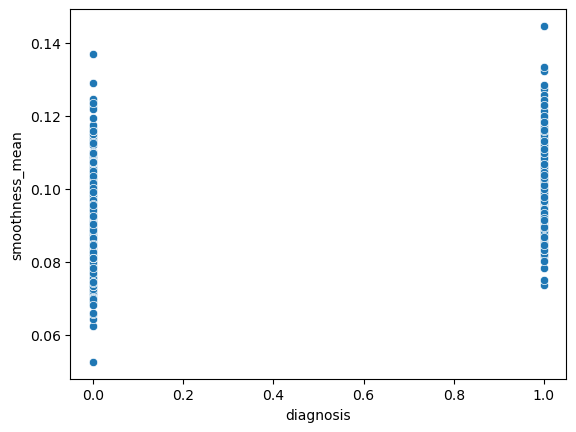

Correlation between diagnosis and symmetry_mean: 0.31096988939442444


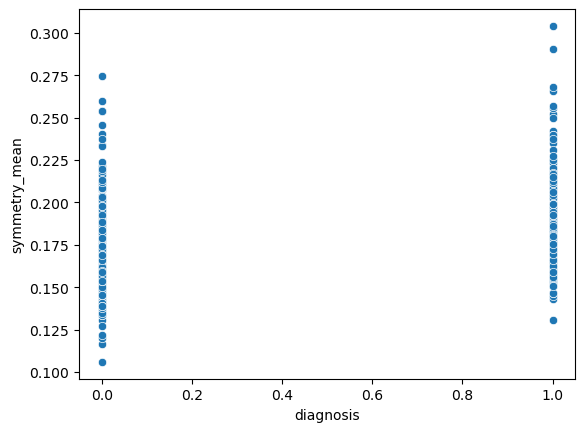

Correlation between diagnosis and fractal_dimension_mean: -0.07040761228746355


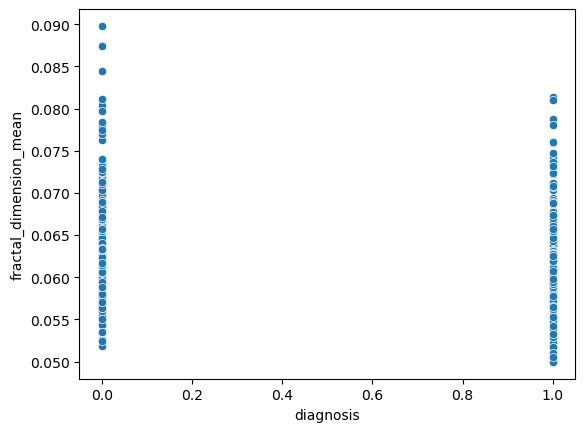

Correlation between diagnosis and texture_se: 0.004751445120095509


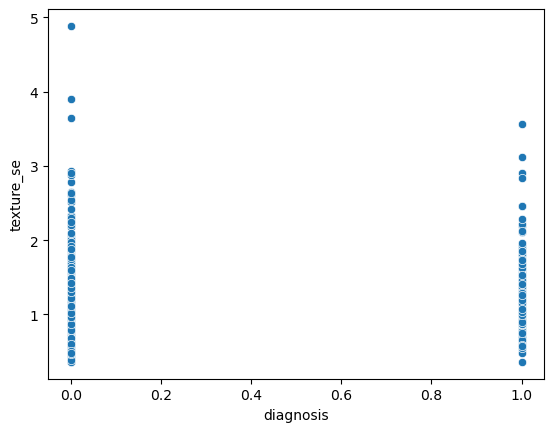

Correlation between diagnosis and smoothness_se: -0.05290324908171399


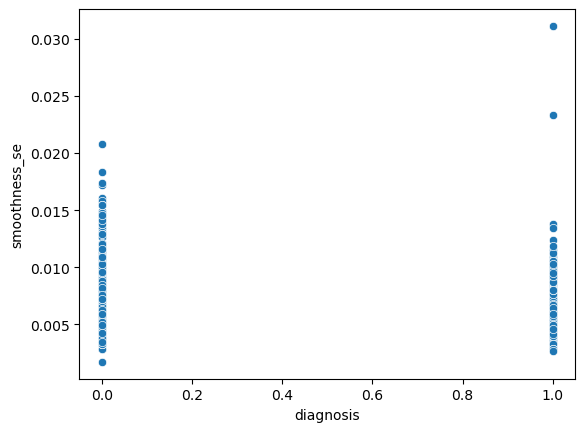

Correlation between diagnosis and concavity_se: 0.30339596915004535


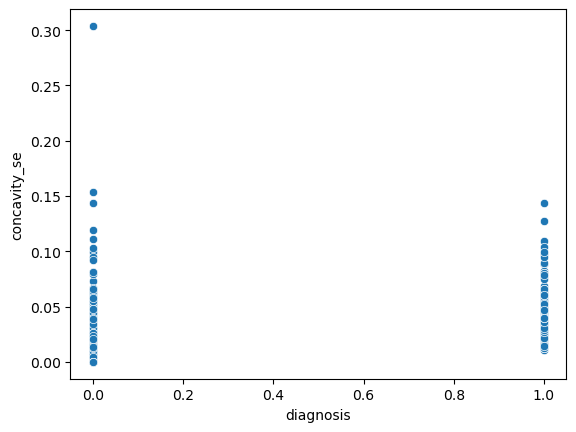

Correlation between diagnosis and concave points_se: 0.43702596270811694


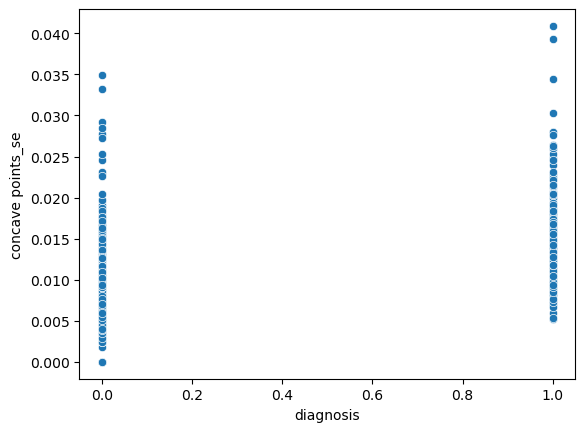

Correlation between diagnosis and symmetry_se: -0.012442001466995365


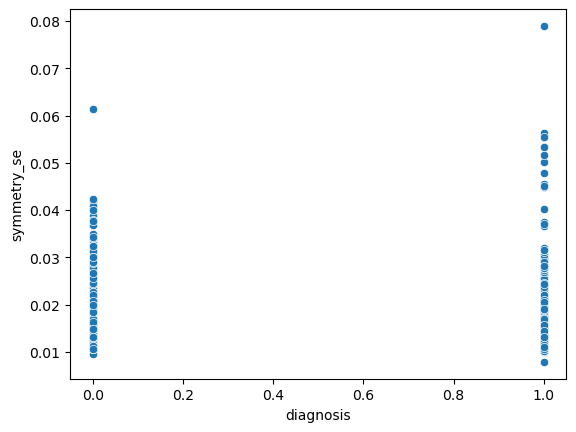

Correlation between diagnosis and fractal_dimension_se: 0.0765467984741993


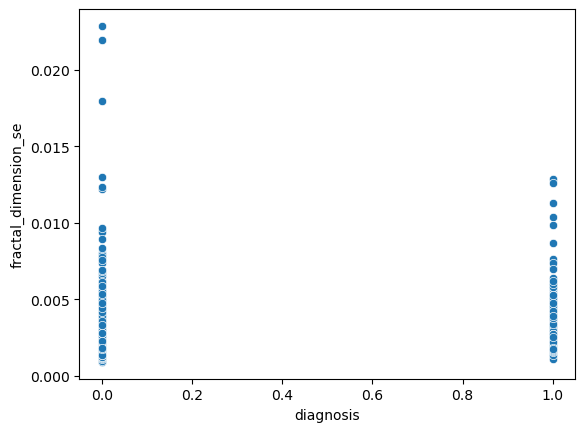

Correlation between diagnosis and texture_worst: 0.4386244916320673


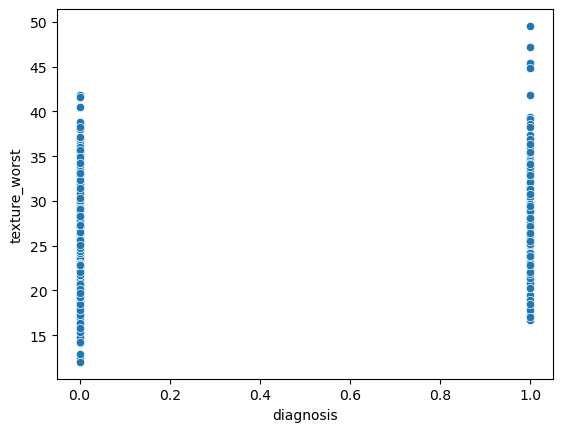

Correlation between diagnosis and area_worst: 0.7490176131048059


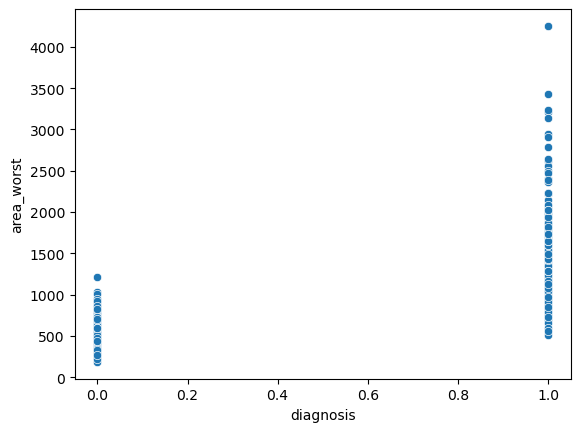

Correlation between diagnosis and smoothness_worst: 0.4013802986741982


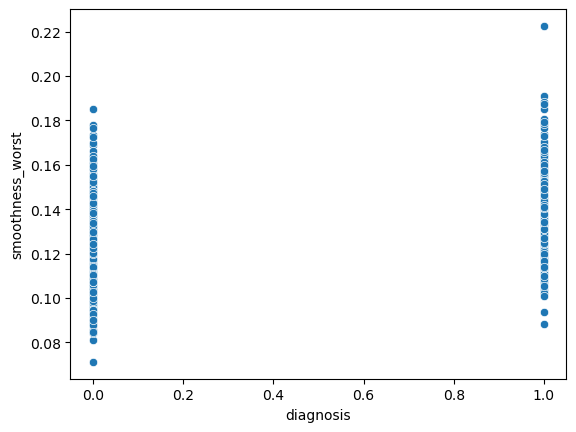

Correlation between diagnosis and concave points_worst: 0.7884458991634556


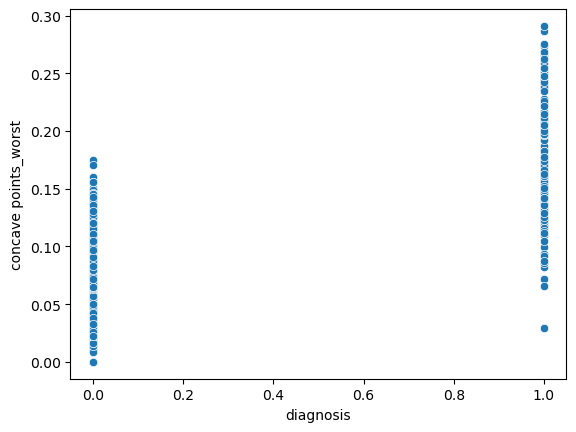

Correlation between diagnosis and symmetry_worst: 0.385208419234419


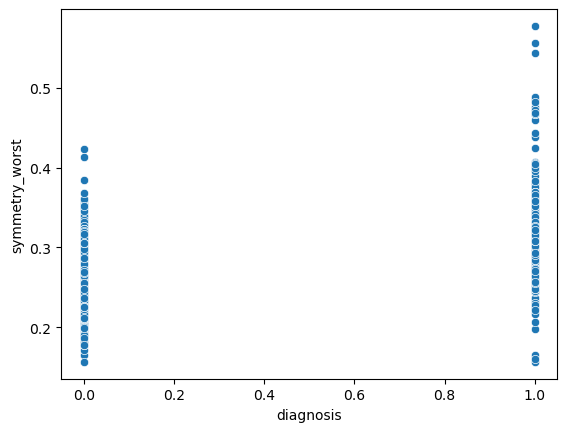

Correlation between diagnosis and fractal_dimension_worst: 0.29419262849780986


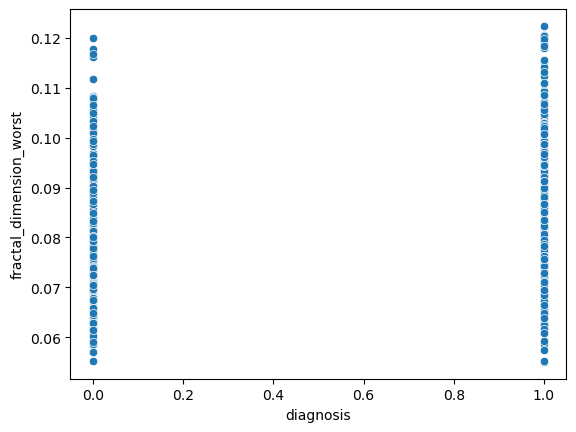

Correlation between smoothness_mean and diagnosis: 0.34261265219656617


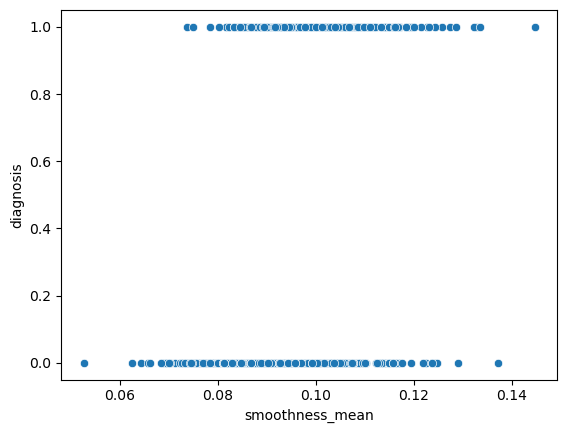

Correlation between smoothness_mean and symmetry_mean: 0.5314220953302389


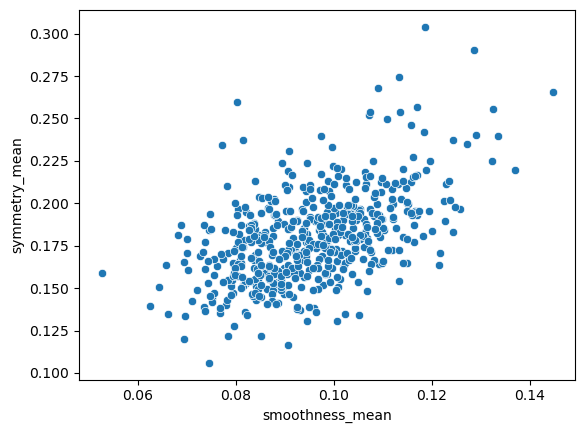

Correlation between smoothness_mean and fractal_dimension_mean: 0.5342874425290688


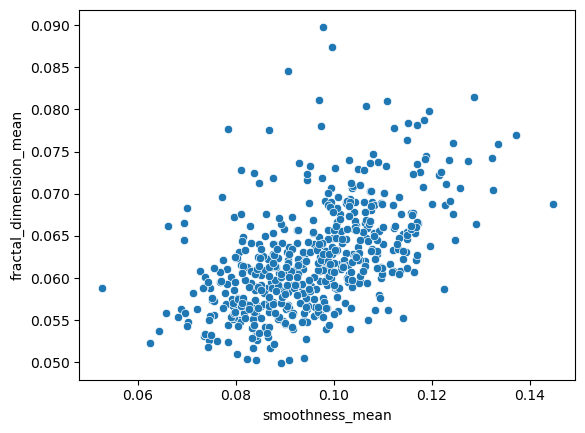

Correlation between smoothness_mean and texture_se: 0.079373216261574


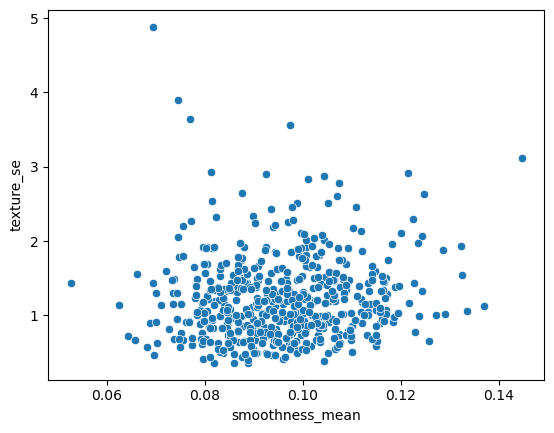

Correlation between smoothness_mean and smoothness_se: 0.3373430010091388


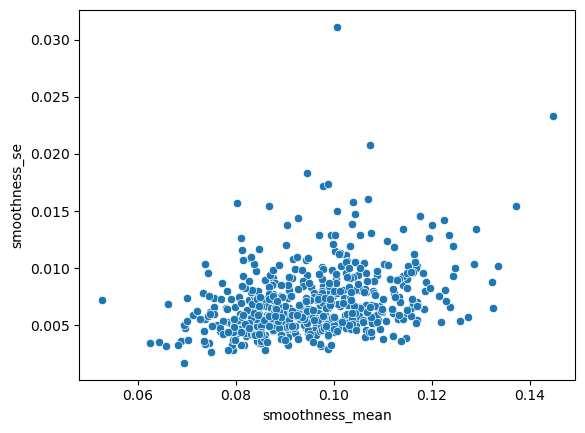

Correlation between smoothness_mean and concavity_se: 0.25317299772960145


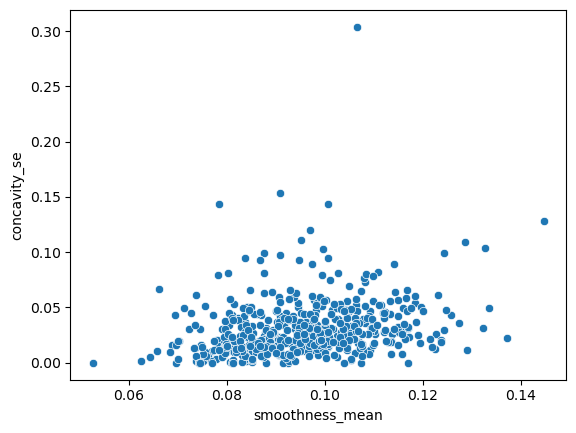

Correlation between smoothness_mean and concave points_se: 0.3792460035219303


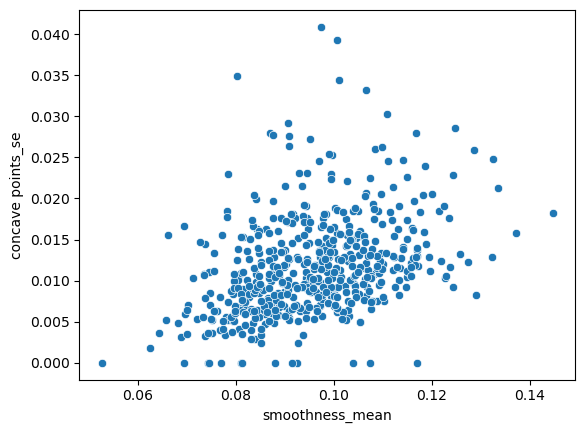

Correlation between smoothness_mean and symmetry_se: 0.18646590732705998


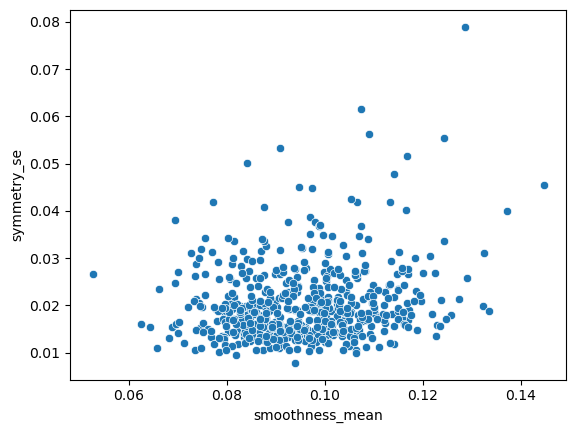

Correlation between smoothness_mean and fractal_dimension_se: 0.2399484554548347


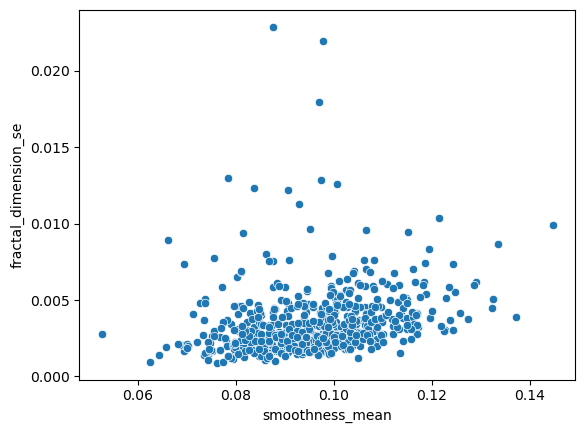

Correlation between smoothness_mean and texture_worst: 0.020461939890156135


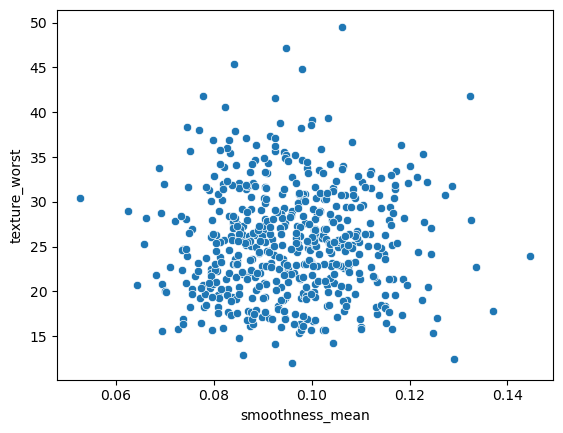

Correlation between smoothness_mean and area_worst: 0.23157931941545246


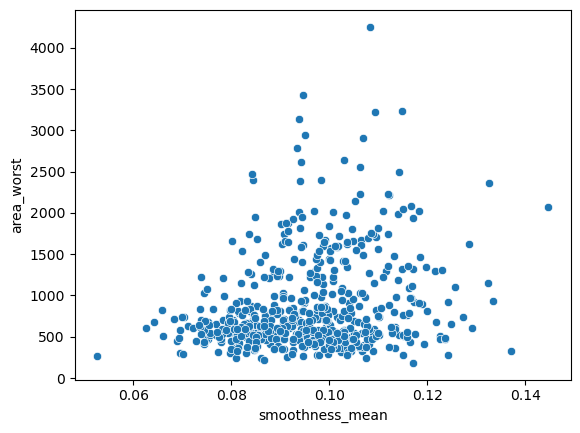

Correlation between smoothness_mean and smoothness_worst: 0.7920483383044106


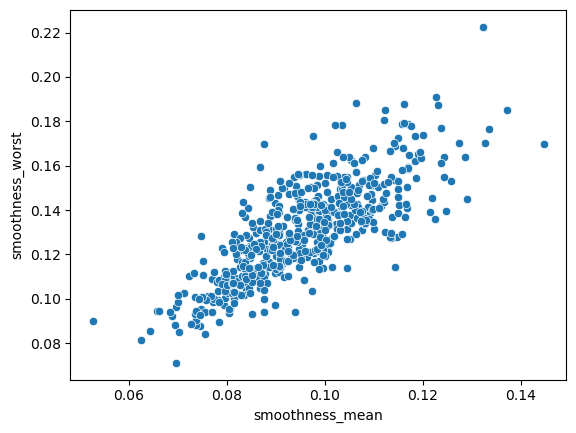

Correlation between smoothness_mean and concave points_worst: 0.48751881323492724


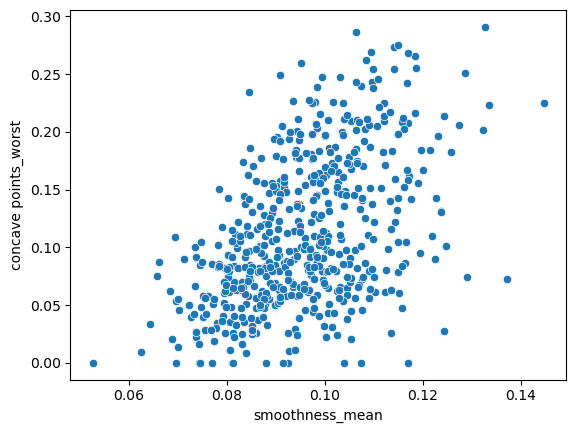

Correlation between smoothness_mean and symmetry_worst: 0.3498383466313928


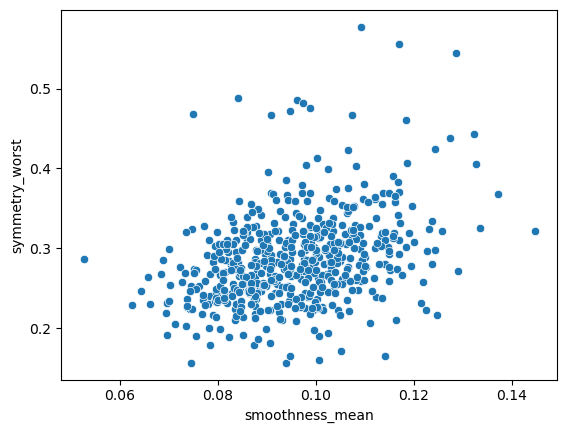

Correlation between smoothness_mean and fractal_dimension_worst: 0.45773481117714887


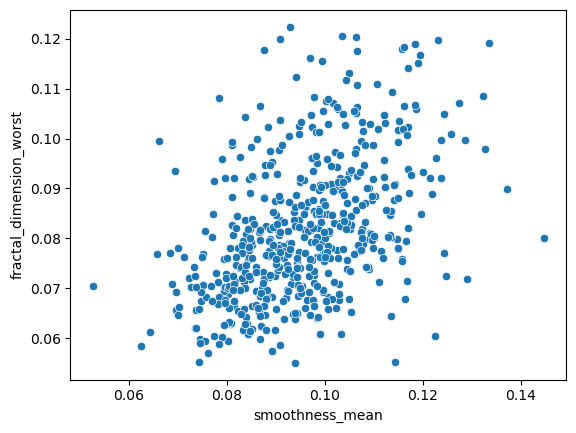

Correlation between symmetry_mean and diagnosis: 0.31096988939442444


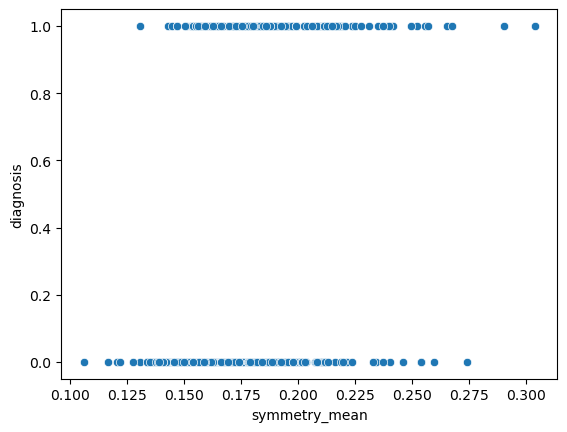

Correlation between symmetry_mean and smoothness_mean: 0.5314220953302389


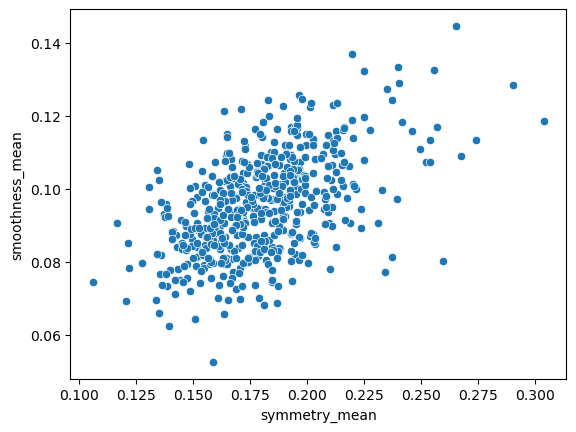

Correlation between symmetry_mean and fractal_dimension_mean: 0.41658616260847187


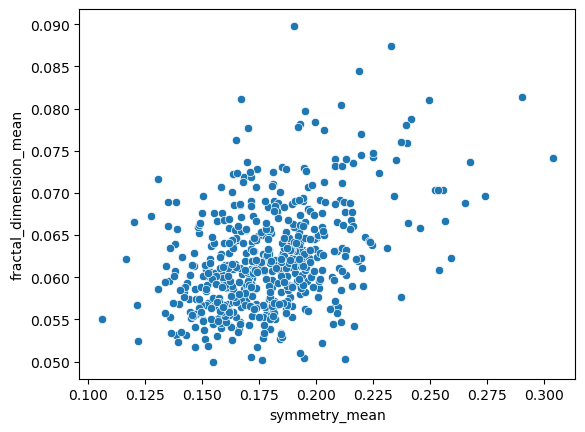

Correlation between symmetry_mean and texture_se: 0.12001361287697478


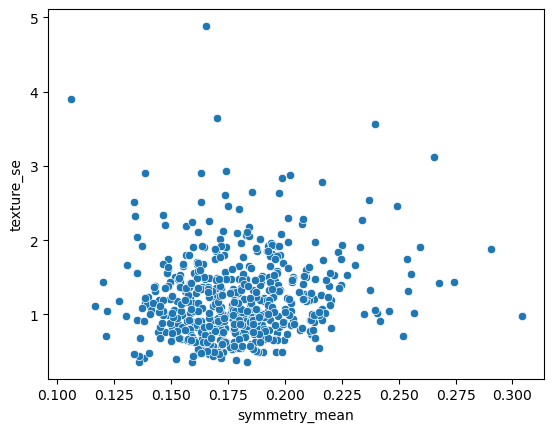

Correlation between symmetry_mean and smoothness_se: 0.18638886735828658


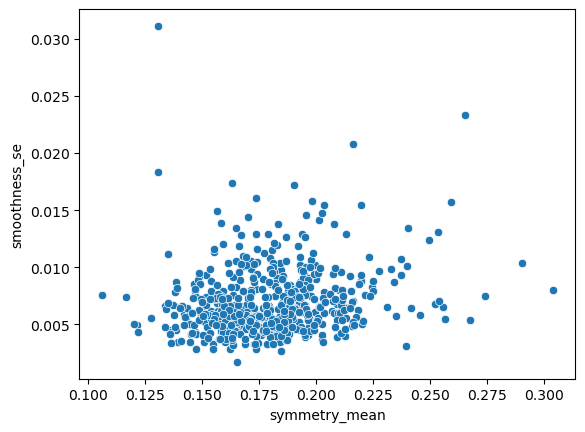

Correlation between symmetry_mean and concavity_se: 0.30868174410503324


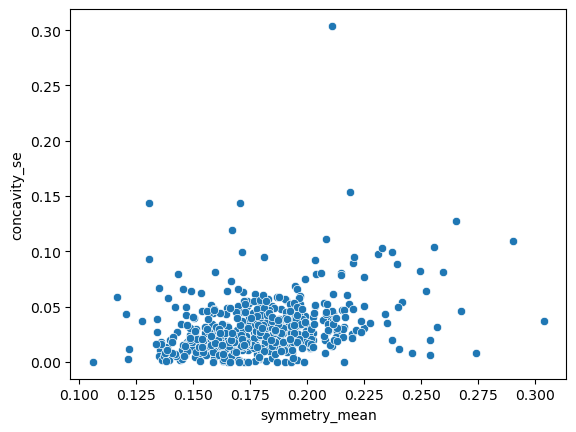

Correlation between symmetry_mean and concave points_se: 0.37325118035774146


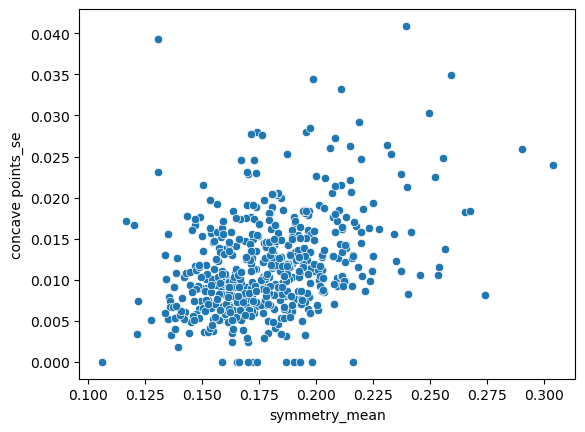

Correlation between symmetry_mean and symmetry_se: 0.4435674164609665


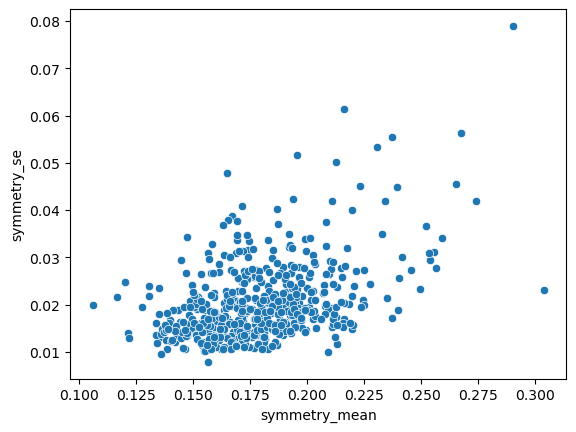

Correlation between symmetry_mean and fractal_dimension_se: 0.26726287447491226


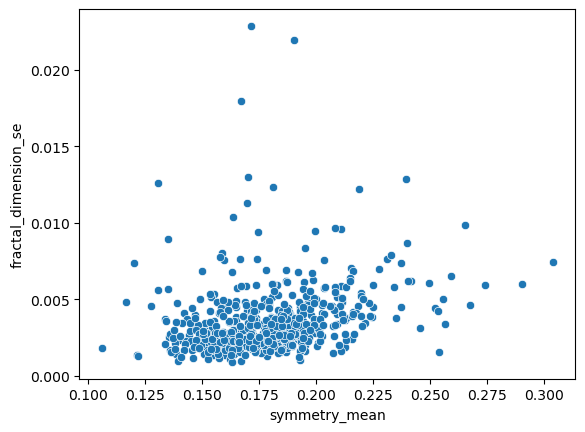

Correlation between symmetry_mean and texture_worst: 0.055550788118789184


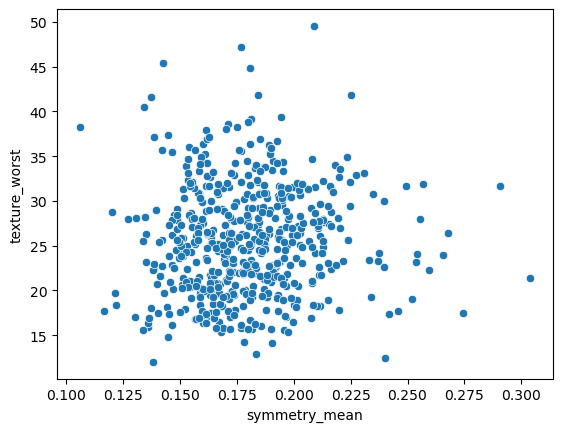

Correlation between symmetry_mean and area_worst: 0.19362867992360144


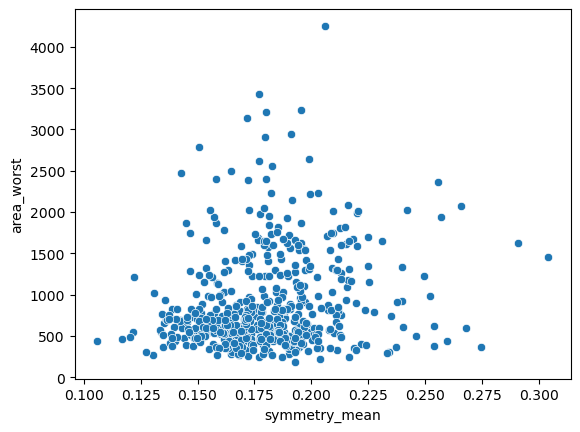

Correlation between symmetry_mean and smoothness_worst: 0.38341260634842506


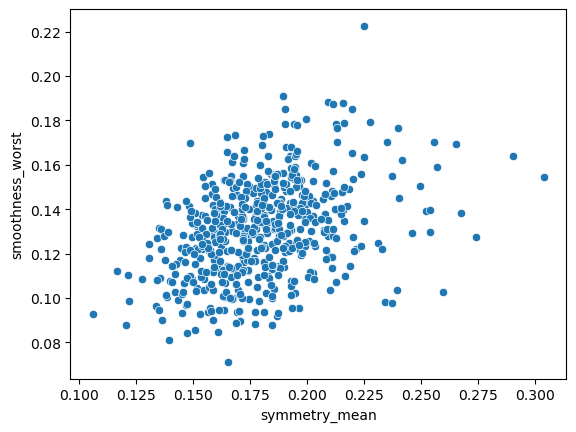

Correlation between symmetry_mean and concave points_worst: 0.3987344627613876


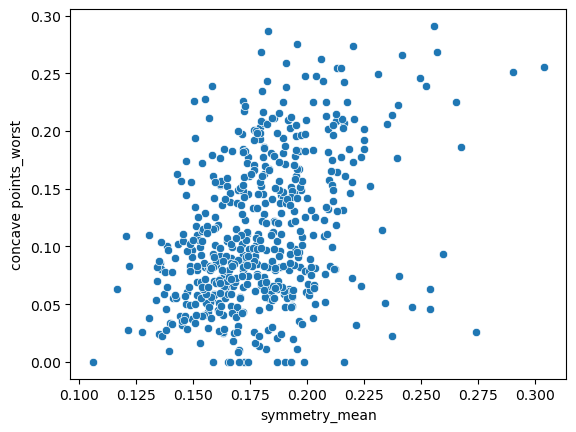

Correlation between symmetry_mean and symmetry_worst: 0.6843877770443114


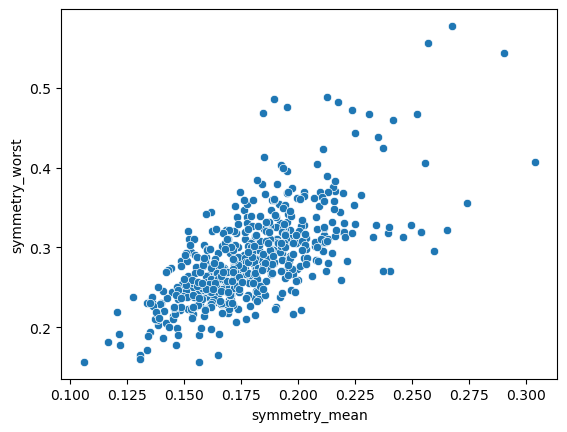

Correlation between symmetry_mean and fractal_dimension_worst: 0.3763825650675207


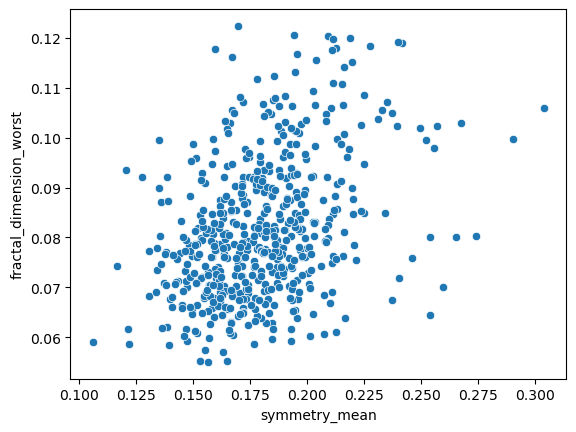

Correlation between fractal_dimension_mean and diagnosis: -0.07040761228746355


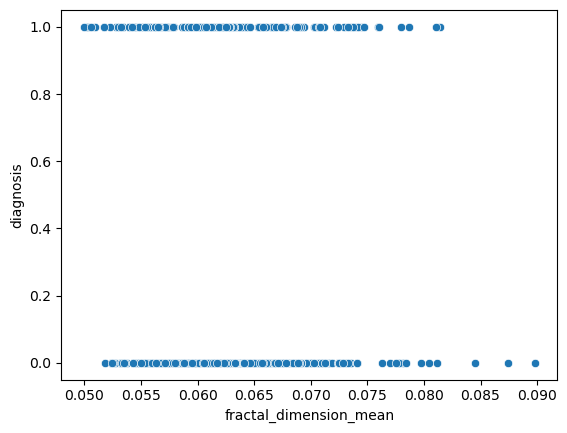

Correlation between fractal_dimension_mean and smoothness_mean: 0.5342874425290688


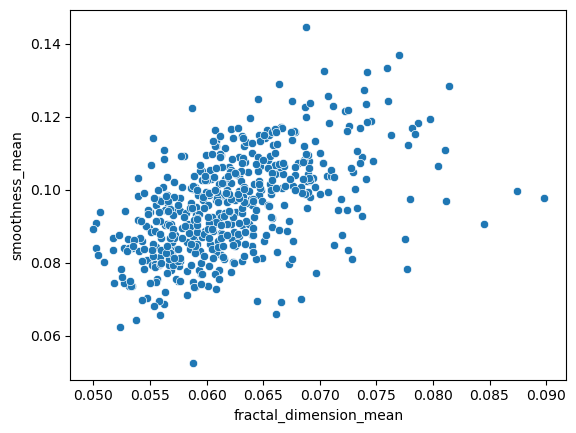

Correlation between fractal_dimension_mean and symmetry_mean: 0.4165861626084718


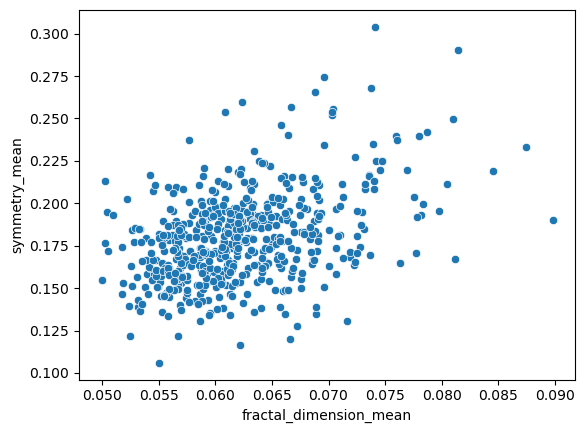

Correlation between fractal_dimension_mean and texture_se: 0.1638069243744973


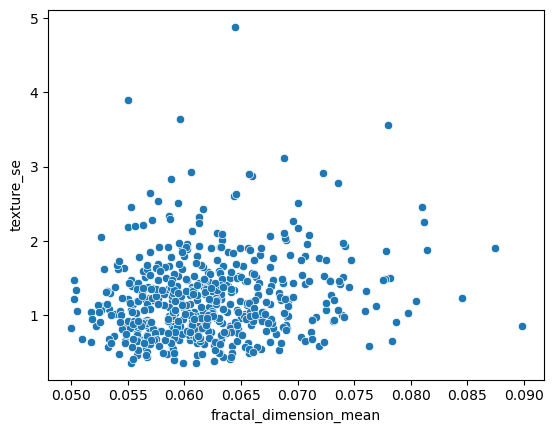

Correlation between fractal_dimension_mean and smoothness_se: 0.4019929036870086


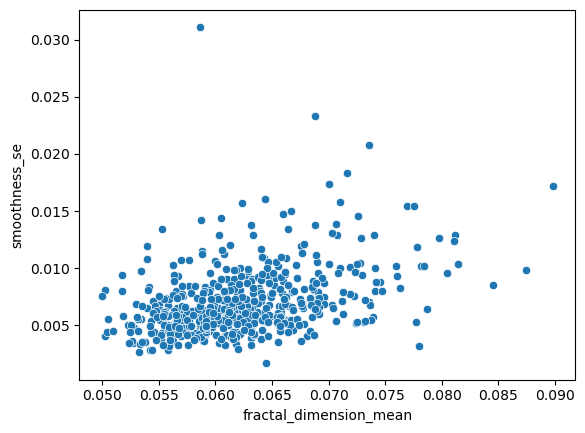

Correlation between fractal_dimension_mean and concavity_se: 0.3987861205368861


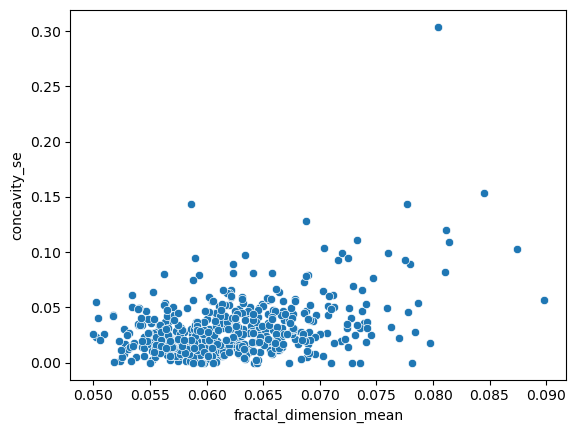

Correlation between fractal_dimension_mean and concave points_se: 0.3005249298029787


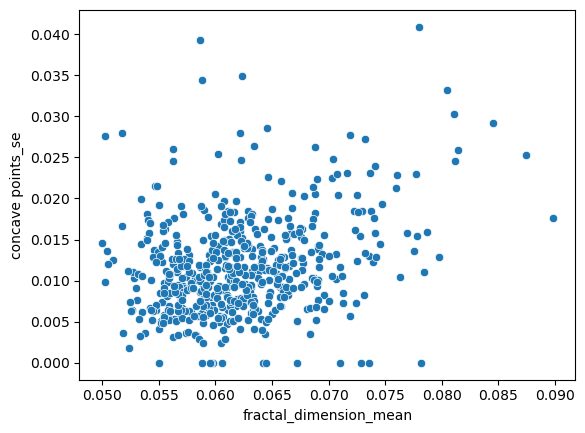

Correlation between fractal_dimension_mean and symmetry_se: 0.3339200263088544


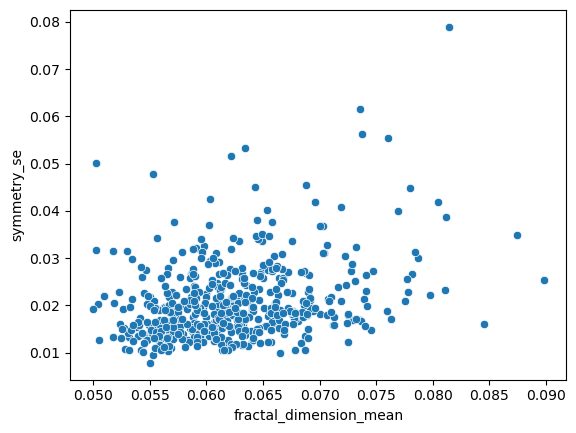

Correlation between fractal_dimension_mean and fractal_dimension_se: 0.6505292956000427


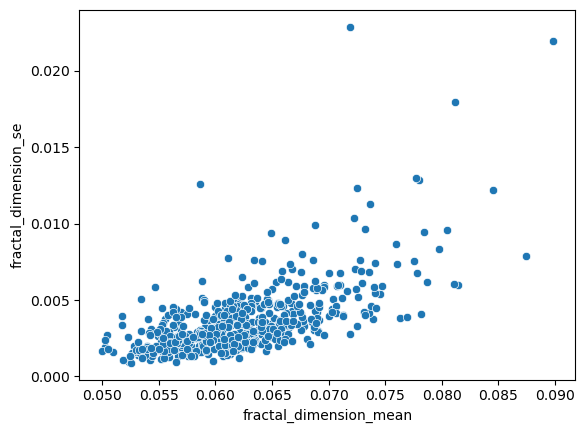

Correlation between fractal_dimension_mean and texture_worst: -0.09432909666764883


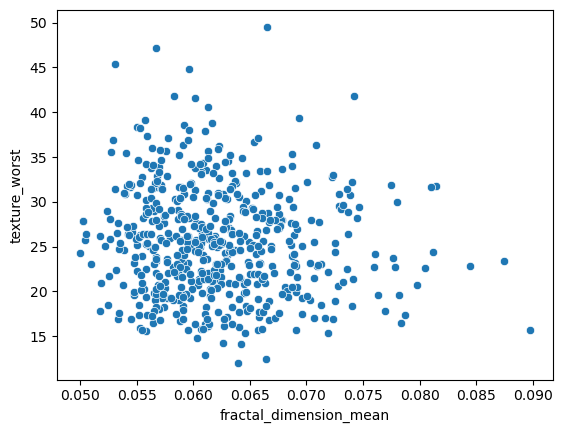

Correlation between fractal_dimension_mean and area_worst: -0.23929922590055533


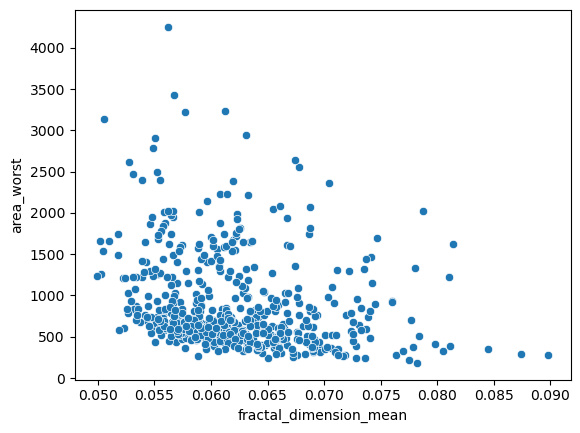

Correlation between fractal_dimension_mean and smoothness_worst: 0.4281673456771395


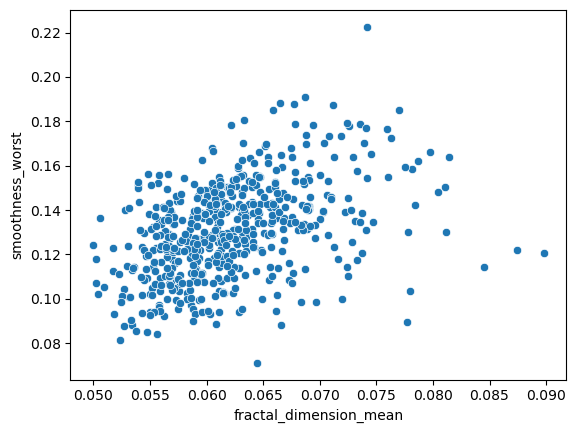

Correlation between fractal_dimension_mean and concave points_worst: 0.10412055374151263


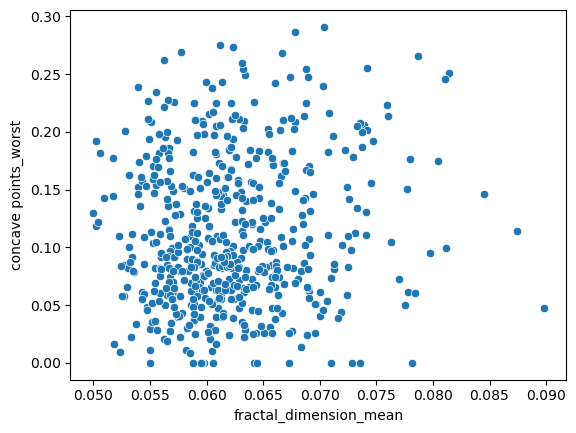

Correlation between fractal_dimension_mean and symmetry_worst: 0.2398490687198558


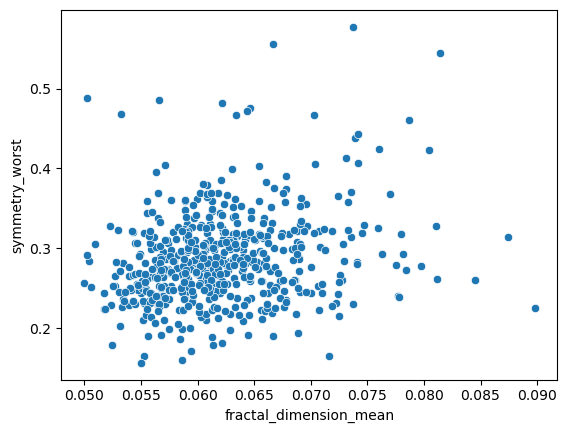

Correlation between fractal_dimension_mean and fractal_dimension_worst: 0.7423566932956451


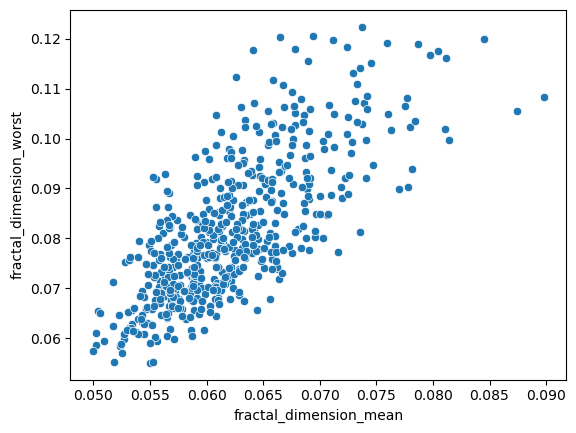

Correlation between texture_se and diagnosis: 0.004751445120095508


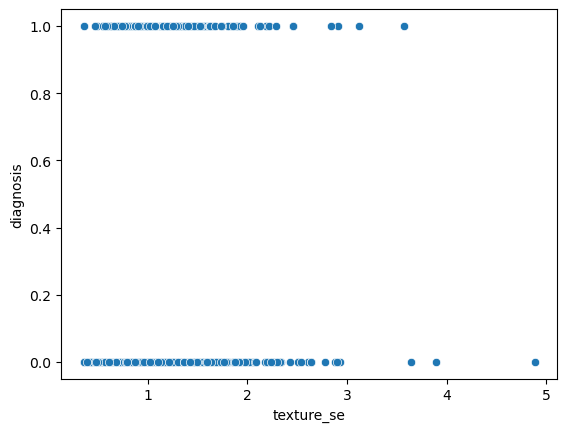

Correlation between texture_se and smoothness_mean: 0.079373216261574


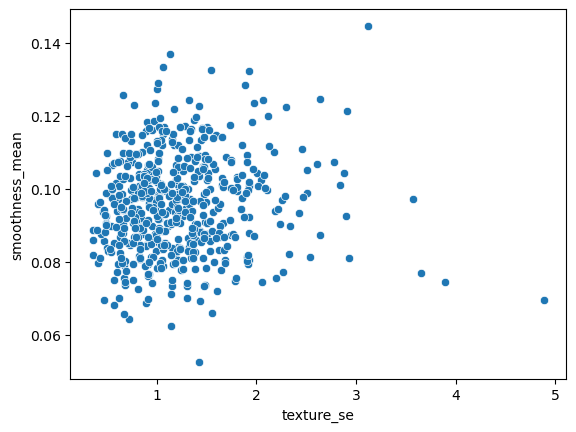

Correlation between texture_se and symmetry_mean: 0.12001361287697476


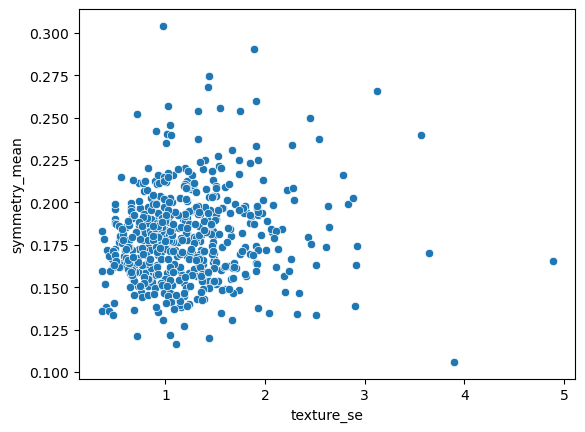

Correlation between texture_se and fractal_dimension_mean: 0.1638069243744973


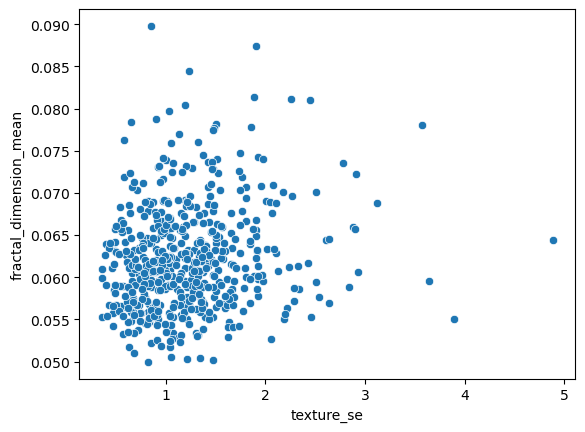

Correlation between texture_se and smoothness_se: 0.3984808188477942


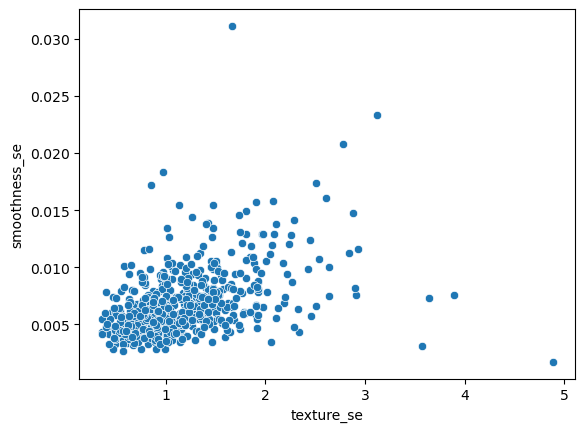

Correlation between texture_se and concavity_se: 0.15577724620342626


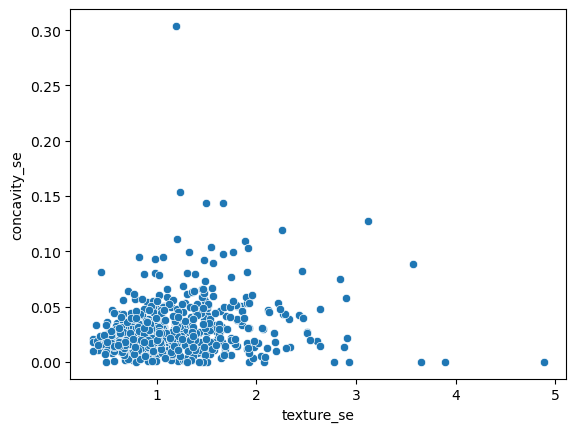

Correlation between texture_se and concave points_se: 0.2135827459800451


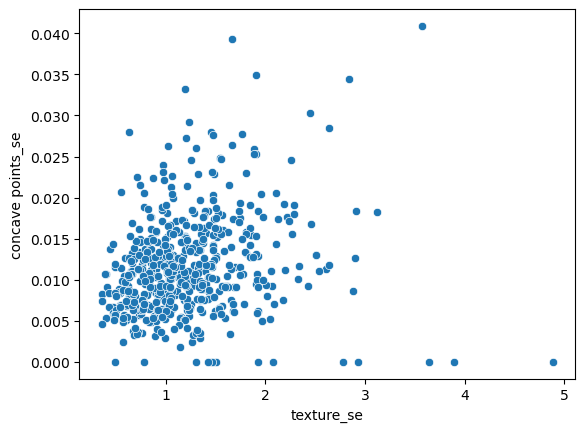

Correlation between texture_se and symmetry_se: 0.4099898119958031


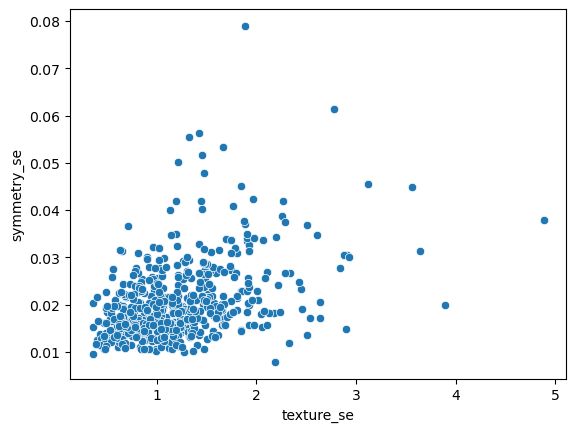

Correlation between texture_se and fractal_dimension_se: 0.26423379876217595


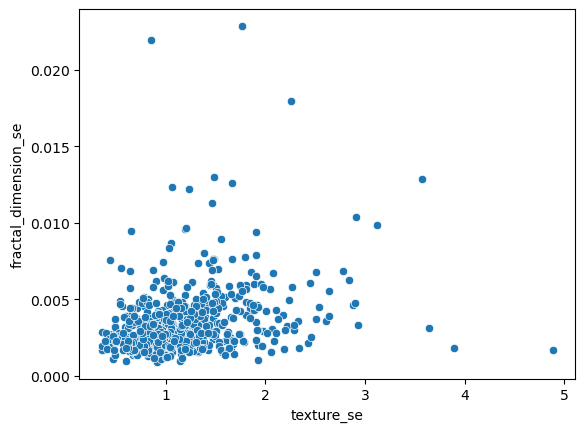

Correlation between texture_se and texture_worst: 0.42860914430186087


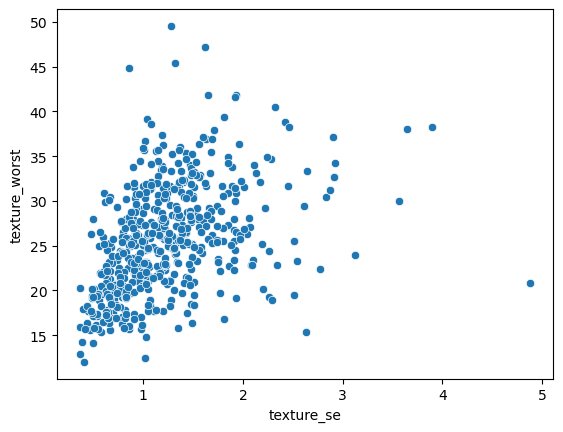

Correlation between texture_se and area_worst: -0.07213967660774068


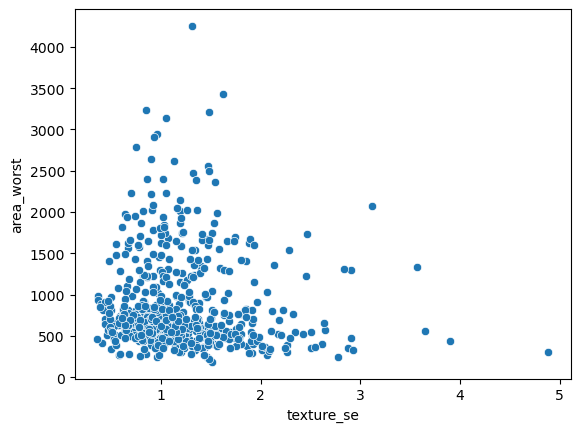

Correlation between texture_se and smoothness_worst: -0.07498557962089064


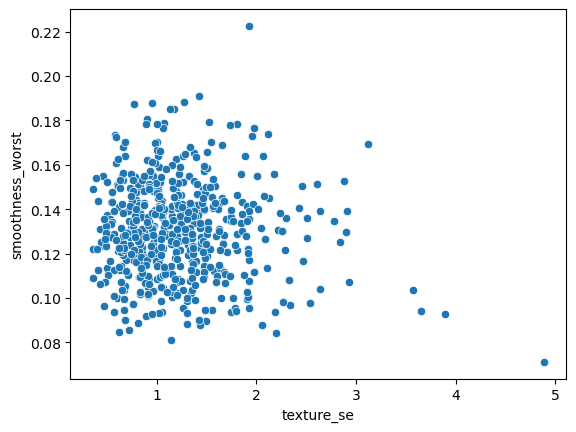

Correlation between texture_se and concave points_worst: -0.11872793125124582


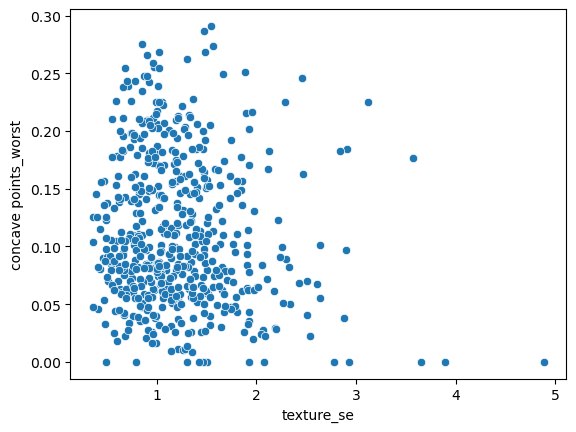

Correlation between texture_se and symmetry_worst: -0.14736057833516197


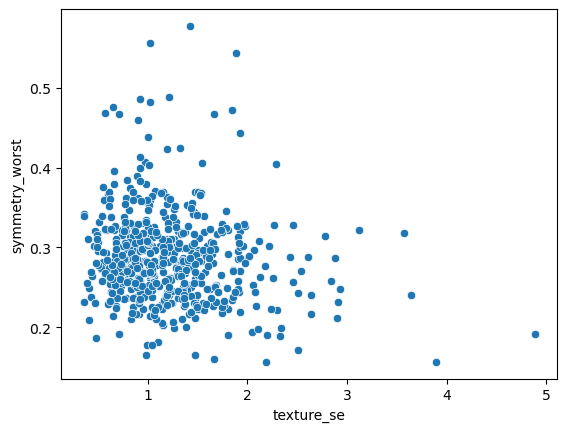

Correlation between texture_se and fractal_dimension_worst: -0.07851780869590608


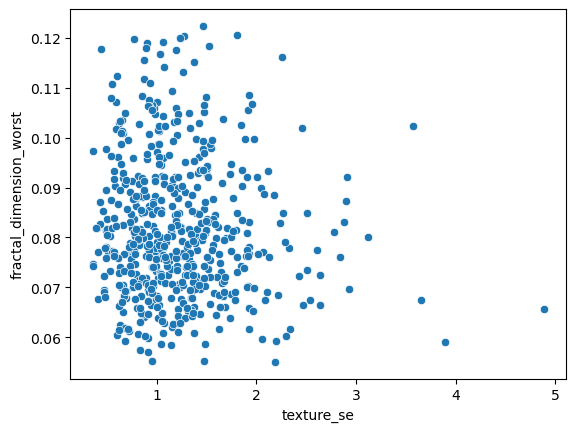

Correlation between smoothness_se and diagnosis: -0.05290324908171399


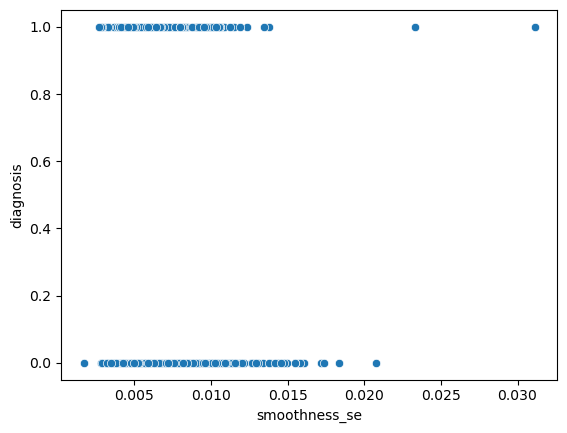

Correlation between smoothness_se and smoothness_mean: 0.3373430010091388


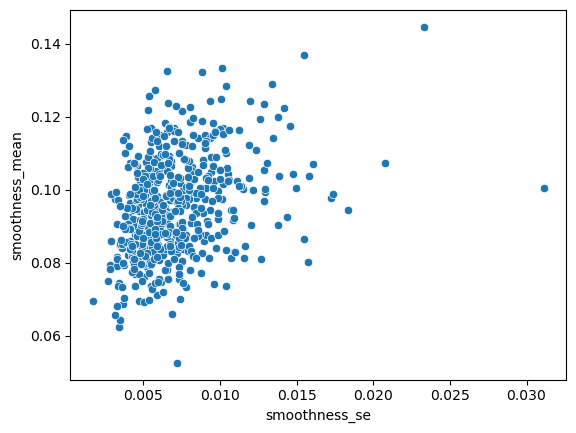

Correlation between smoothness_se and symmetry_mean: 0.18638886735828658


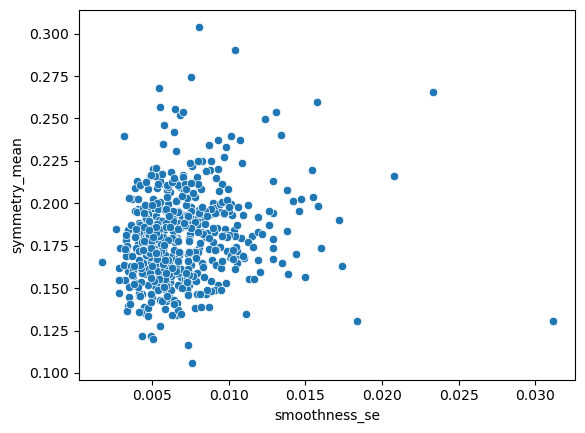

Correlation between smoothness_se and fractal_dimension_mean: 0.4019929036870086


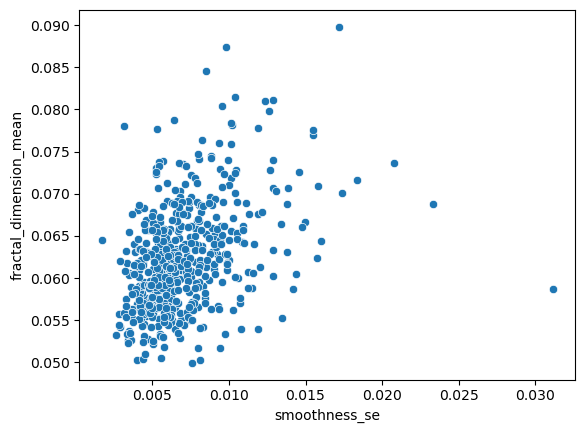

Correlation between smoothness_se and texture_se: 0.3984808188477942


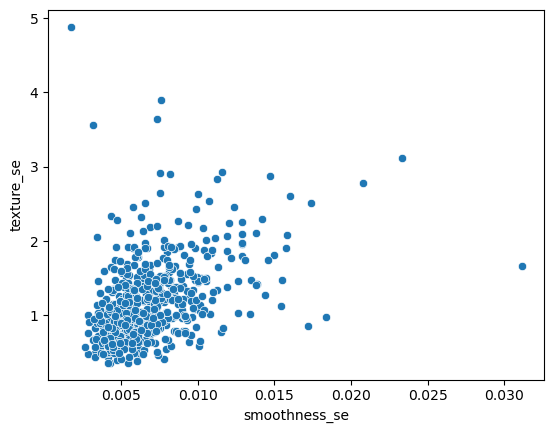

Correlation between smoothness_se and concavity_se: 0.28634107190642255


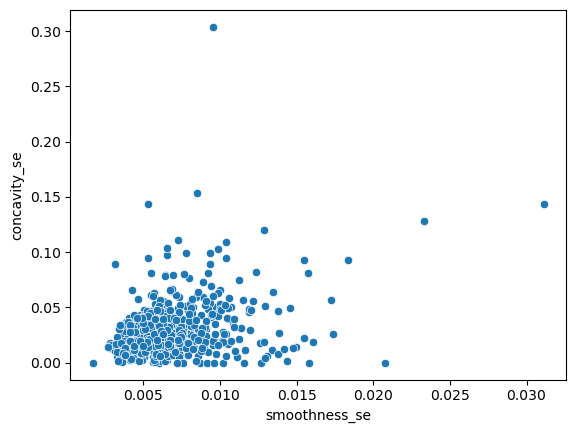

Correlation between smoothness_se and concave points_se: 0.3325400961155706


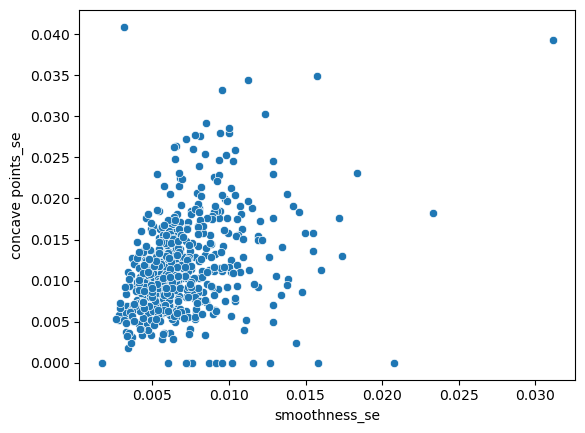

Correlation between smoothness_se and symmetry_se: 0.4209711766201023


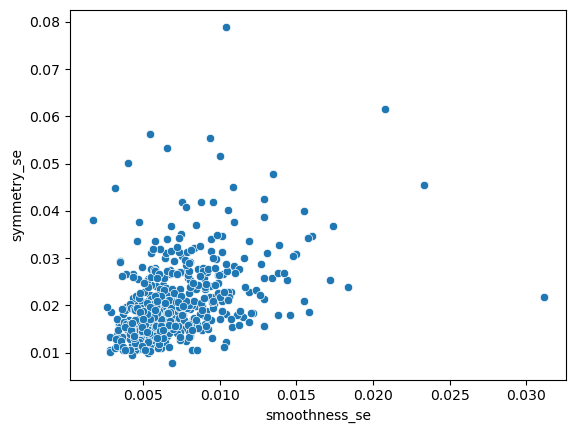

Correlation between smoothness_se and fractal_dimension_se: 0.446056661011383


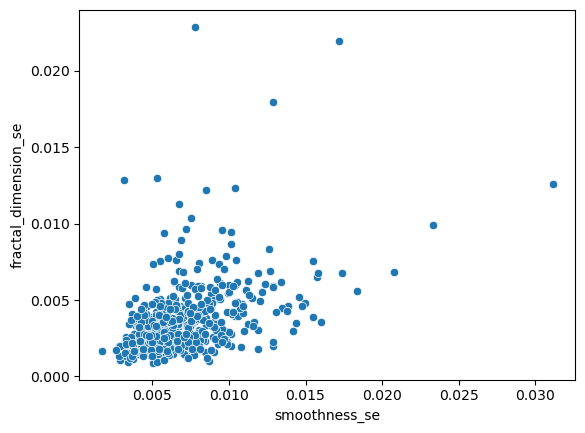

Correlation between smoothness_se and texture_worst: -0.05521476808016561


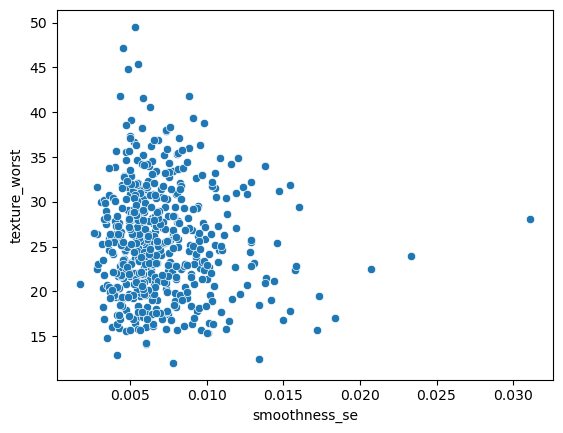

Correlation between smoothness_se and area_worst: -0.17037414398751347


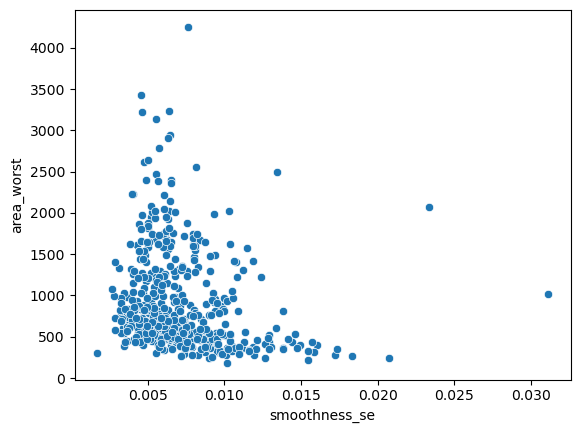

Correlation between smoothness_se and smoothness_worst: 0.3111595249274009


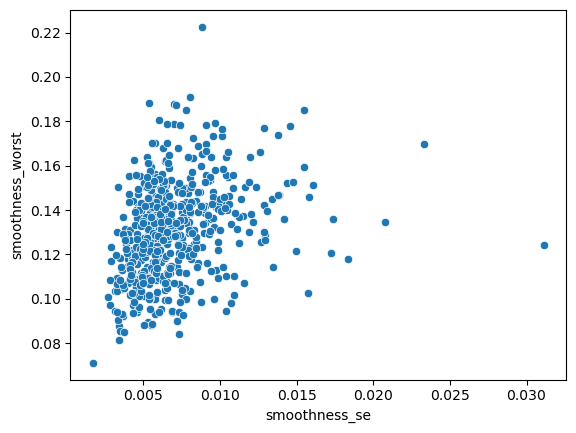

Correlation between smoothness_se and concave points_worst: -0.09966025791860511


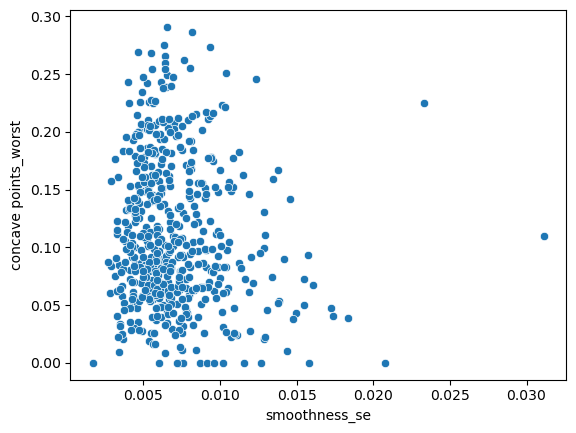

Correlation between smoothness_se and symmetry_worst: -0.11695297789862667


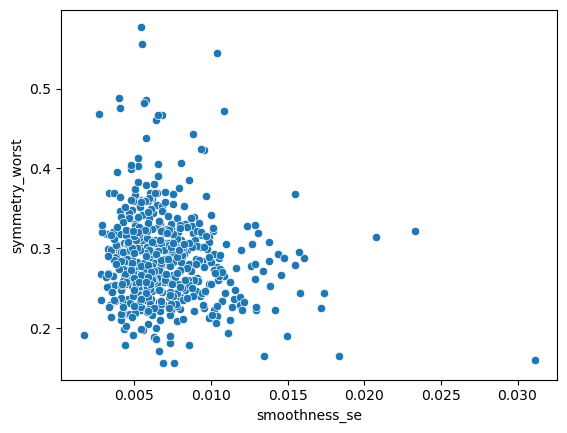

Correlation between smoothness_se and fractal_dimension_worst: 0.09414166530131599


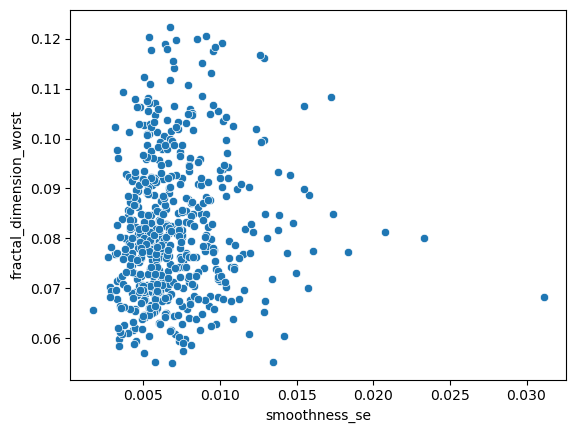

Correlation between concavity_se and diagnosis: 0.30339596915004535


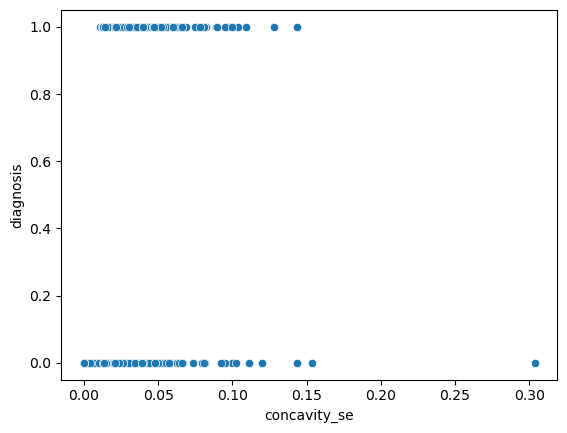

Correlation between concavity_se and smoothness_mean: 0.25317299772960145


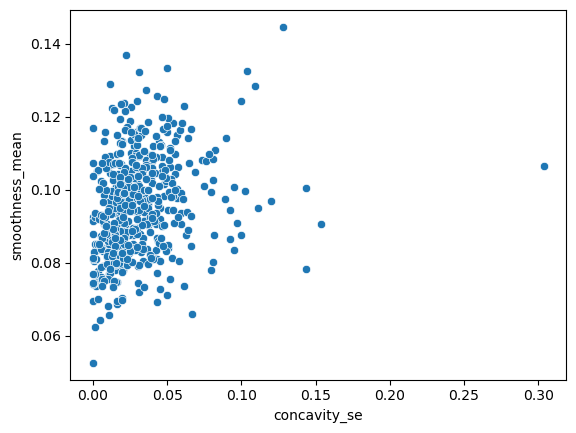

Correlation between concavity_se and symmetry_mean: 0.30868174410503324


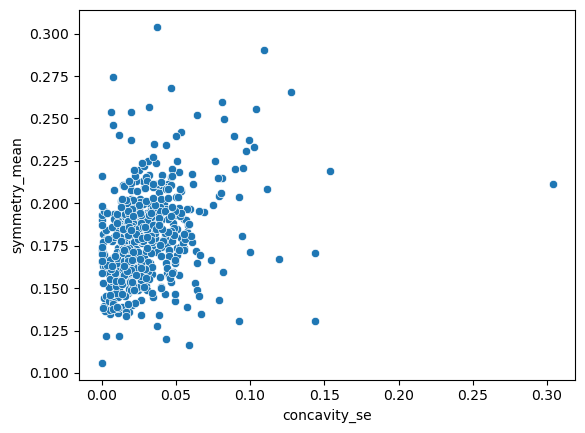

Correlation between concavity_se and fractal_dimension_mean: 0.3987861205368861


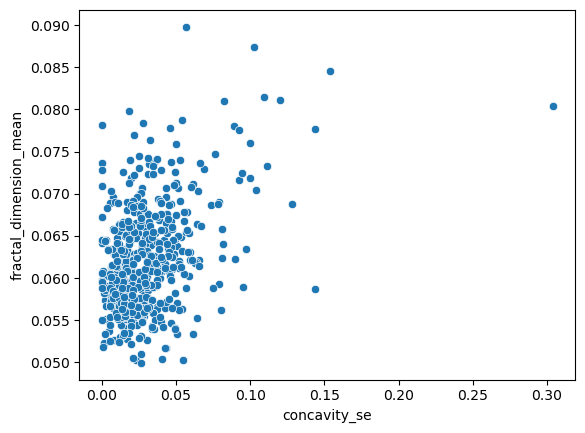

Correlation between concavity_se and texture_se: 0.15577724620342626


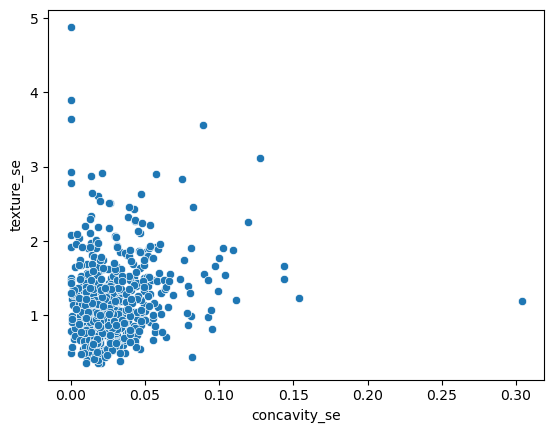

Correlation between concavity_se and smoothness_se: 0.28634107190642255


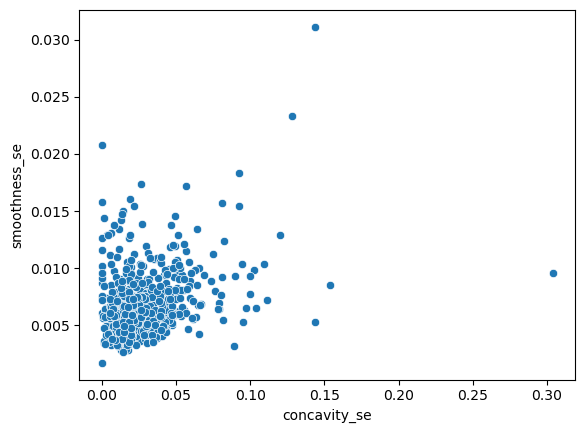

Correlation between concavity_se and concave points_se: 0.7734862274771996


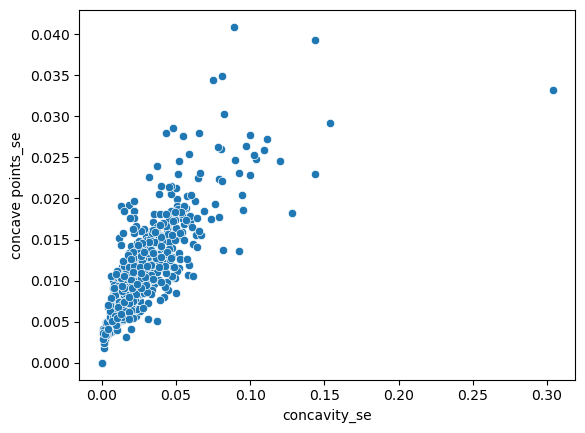

Correlation between concavity_se and symmetry_se: 0.3126385922181893


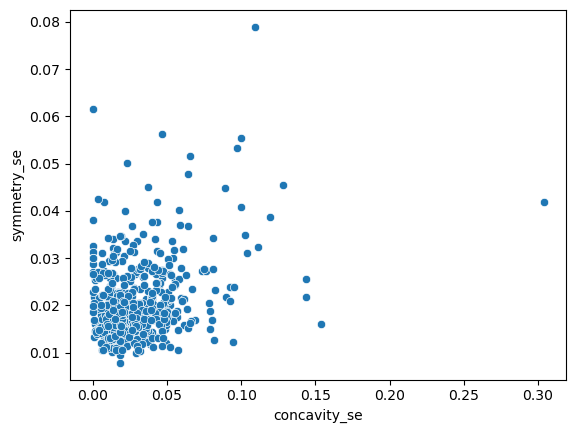

Correlation between concavity_se and fractal_dimension_se: 0.6421729208615594


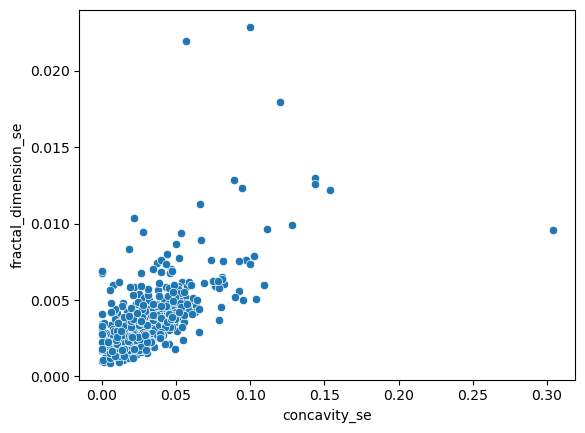

Correlation between concavity_se and texture_worst: 0.10574371369348767


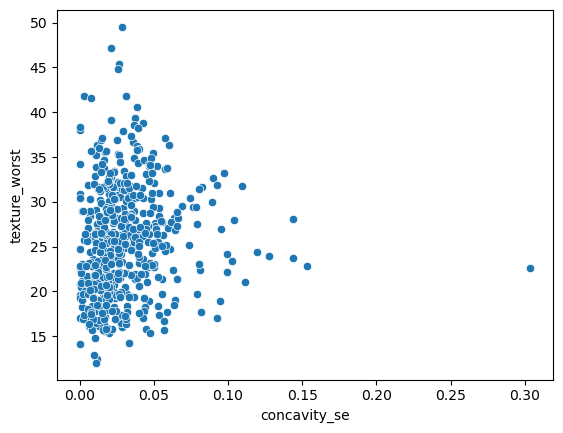

Correlation between concavity_se and area_worst: 0.253967184943931


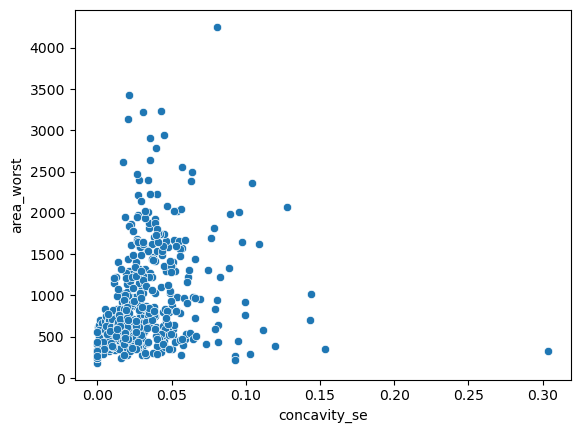

Correlation between concavity_se and smoothness_worst: 0.15761646157350445


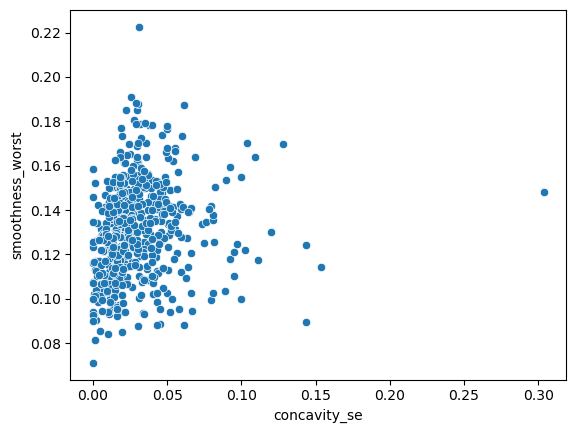

Correlation between concavity_se and concave points_worst: 0.4884007414520573


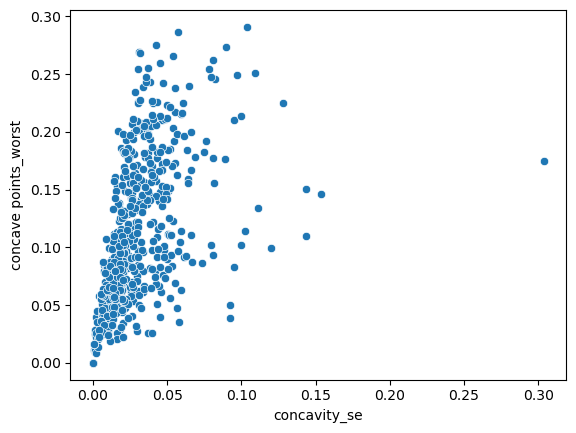

Correlation between concavity_se and symmetry_worst: 0.17574719092859395


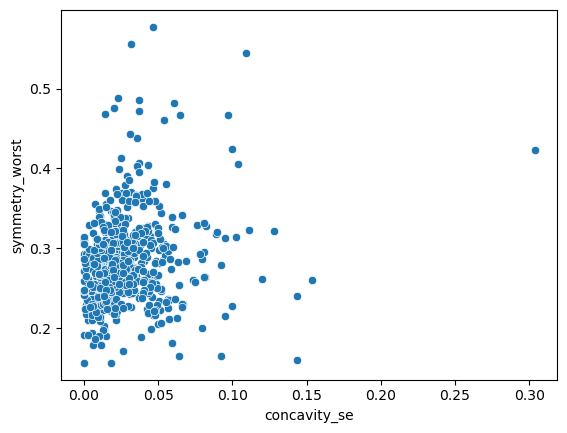

Correlation between concavity_se and fractal_dimension_worst: 0.432724386793112


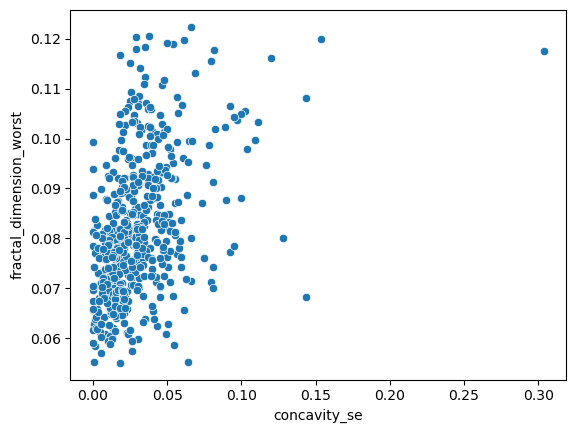

Correlation between concave points_se and diagnosis: 0.43702596270811694


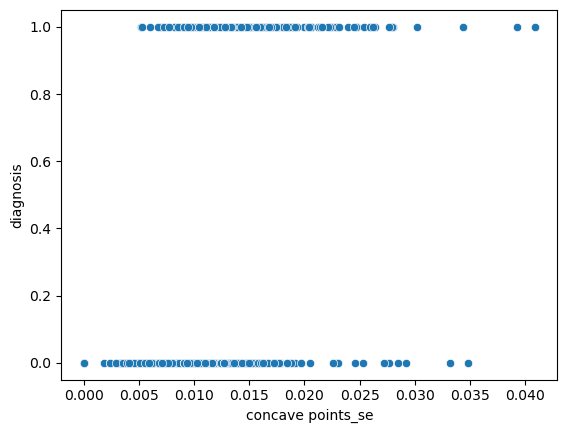

Correlation between concave points_se and smoothness_mean: 0.3792460035219303


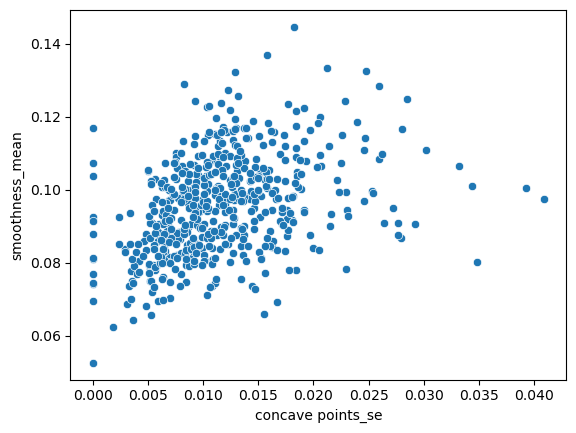

Correlation between concave points_se and symmetry_mean: 0.37325118035774146


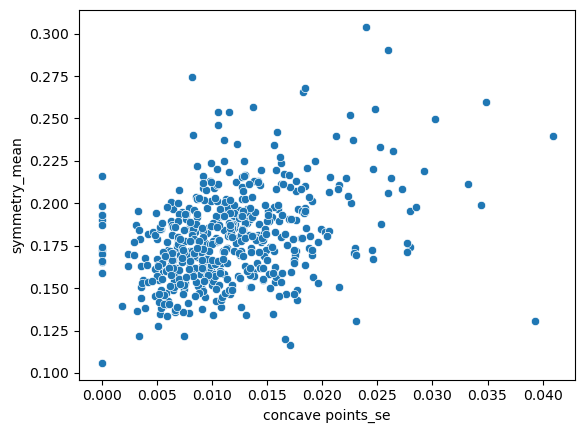

Correlation between concave points_se and fractal_dimension_mean: 0.3005249298029787


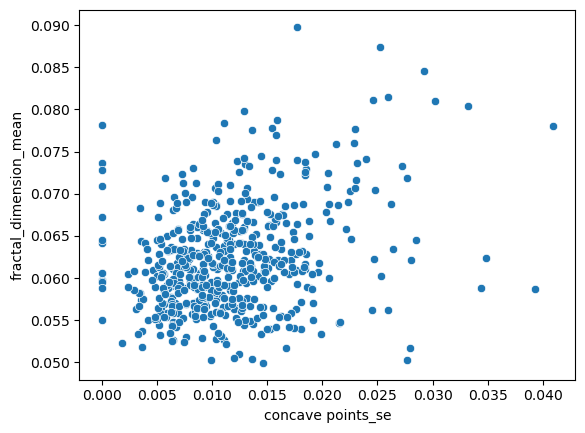

Correlation between concave points_se and texture_se: 0.2135827459800451


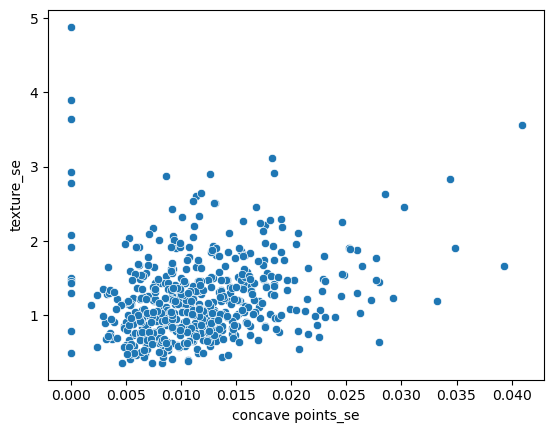

Correlation between concave points_se and smoothness_se: 0.3325400961155706


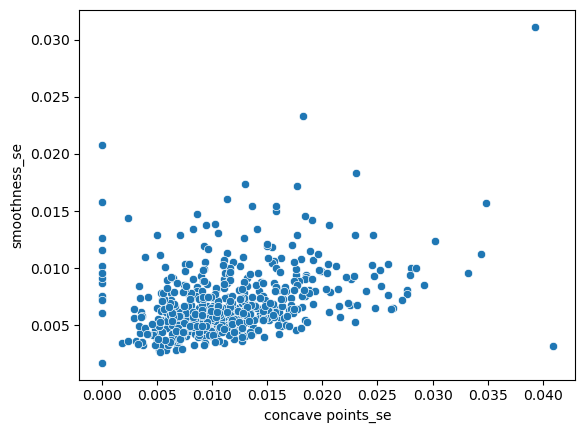

Correlation between concave points_se and concavity_se: 0.7734862274771995


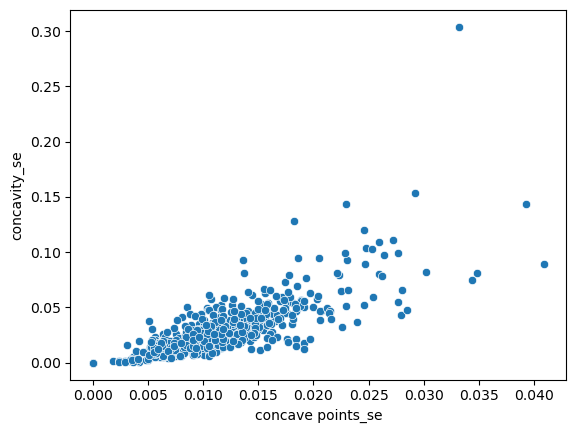

Correlation between concave points_se and symmetry_se: 0.30467847888152166


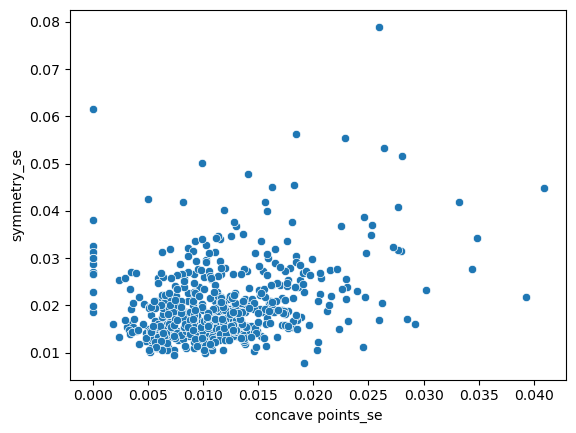

Correlation between concave points_se and fractal_dimension_se: 0.5765951858288584


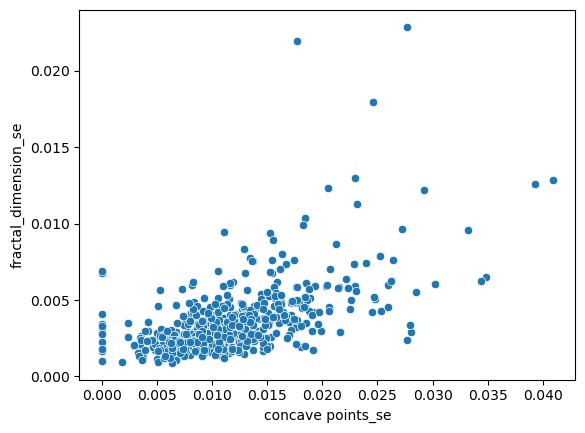

Correlation between concave points_se and texture_worst: 0.09647646008853865


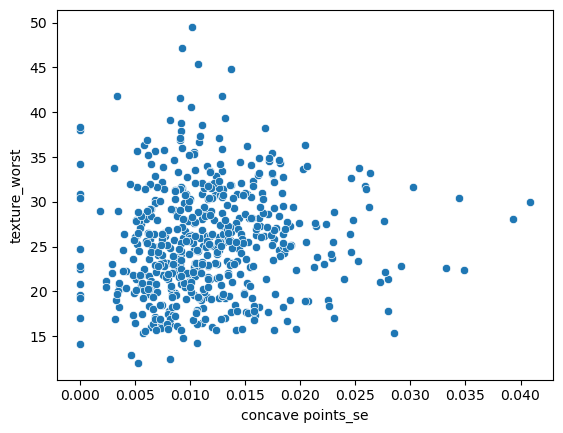

Correlation between concave points_se and area_worst: 0.37459085954340804


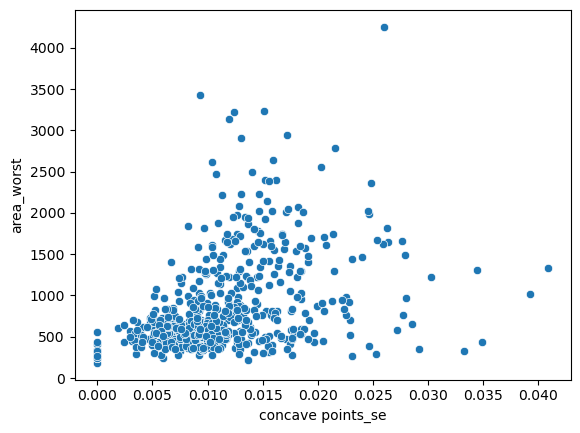

Correlation between concave points_se and smoothness_worst: 0.20850456731983502


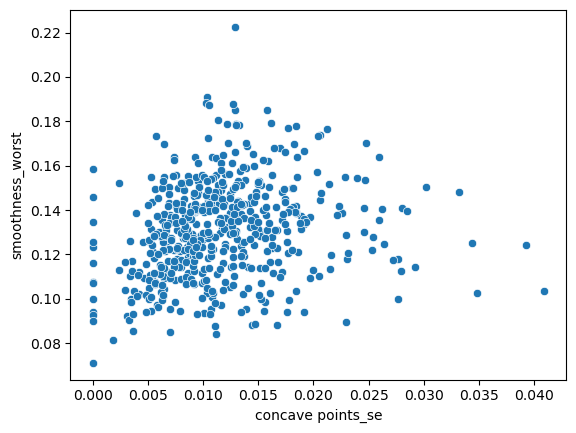

Correlation between concave points_se and concave points_worst: 0.6275917321281591


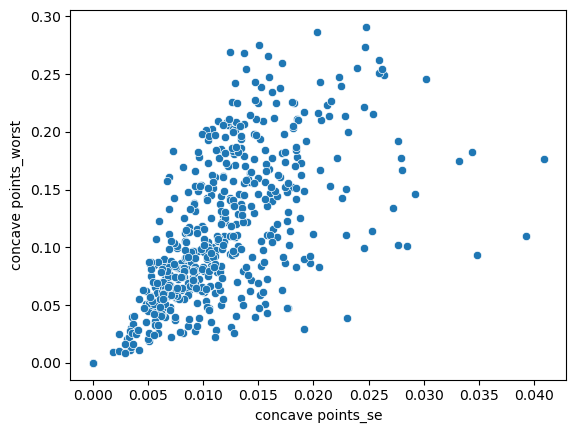

Correlation between concave points_se and symmetry_worst: 0.12858031864768


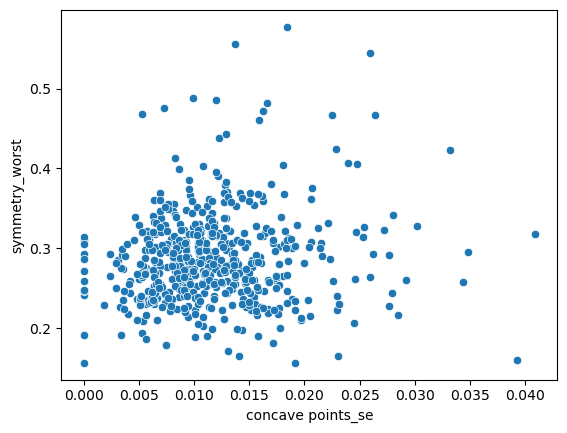

Correlation between concave points_se and fractal_dimension_worst: 0.31718982612275964


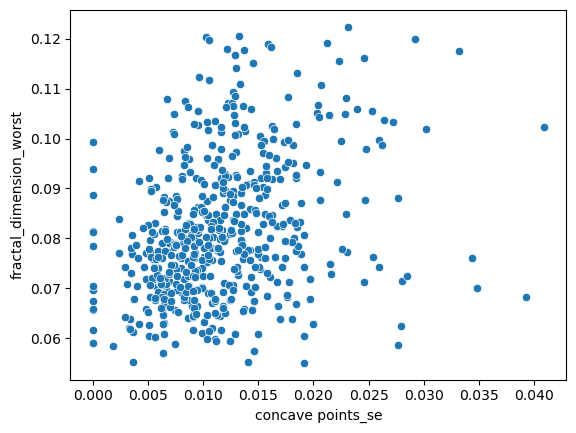

Correlation between symmetry_se and diagnosis: -0.012442001466995365


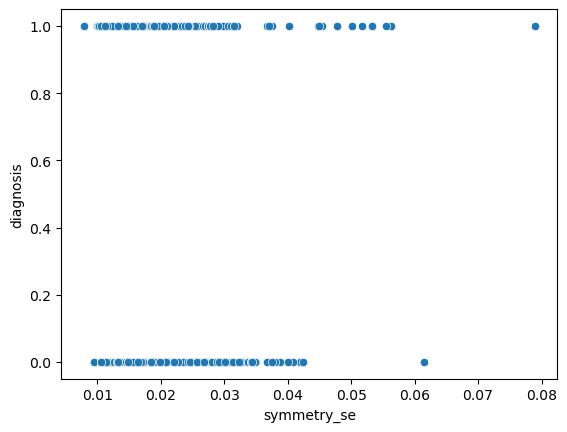

Correlation between symmetry_se and smoothness_mean: 0.18646590732705998


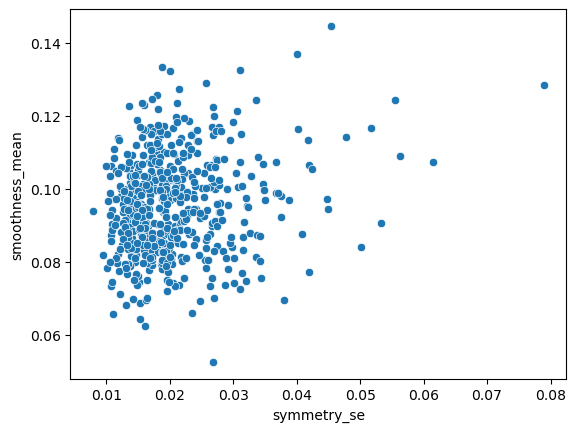

Correlation between symmetry_se and symmetry_mean: 0.44356741646096653


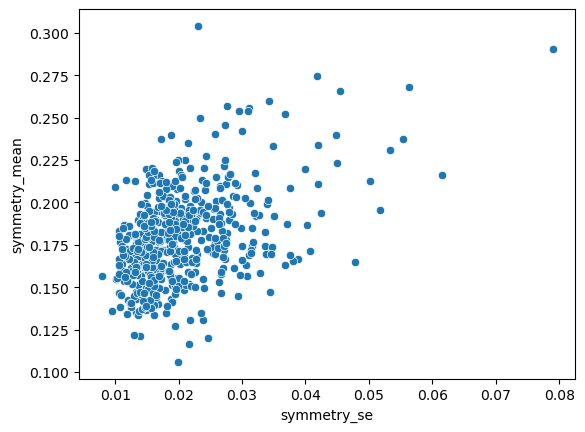

Correlation between symmetry_se and fractal_dimension_mean: 0.33392002630885437


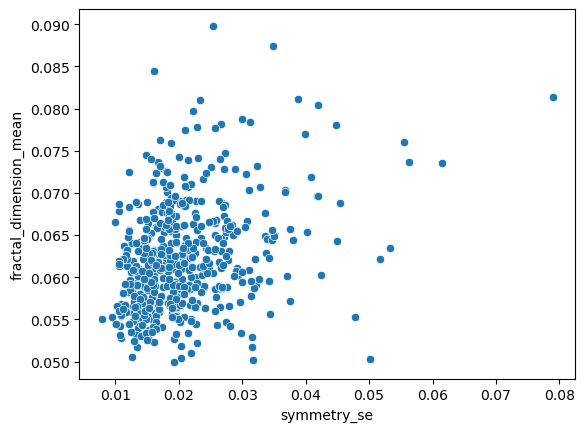

Correlation between symmetry_se and texture_se: 0.4099898119958031


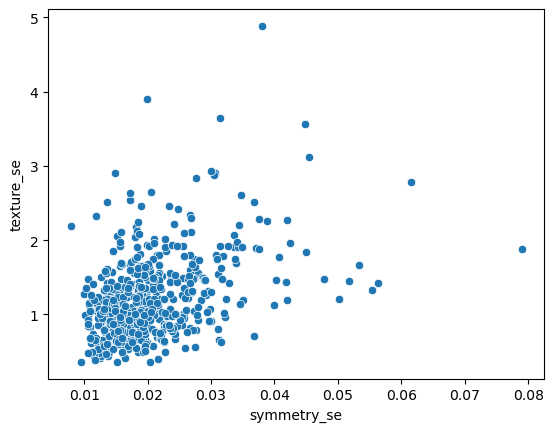

Correlation between symmetry_se and smoothness_se: 0.4209711766201023


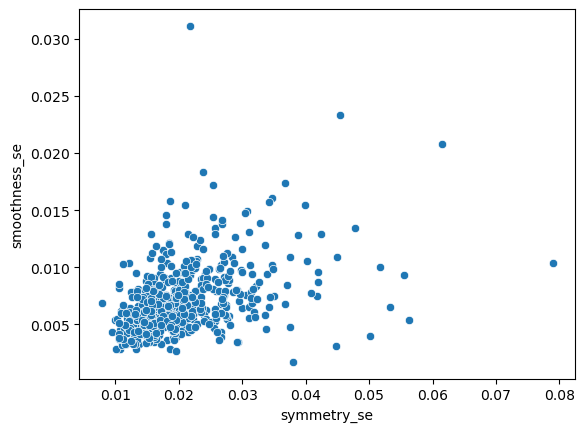

Correlation between symmetry_se and concavity_se: 0.31263859221818935


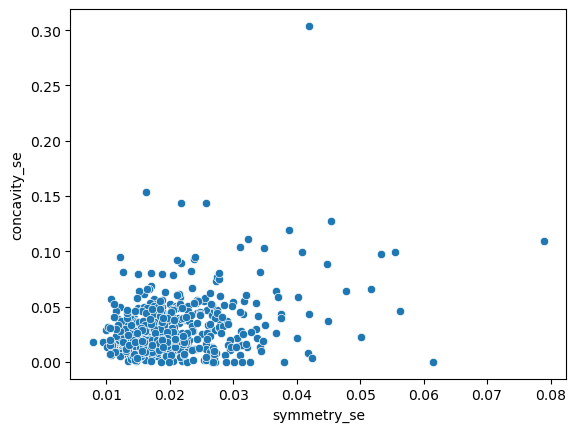

Correlation between symmetry_se and concave points_se: 0.30467847888152166


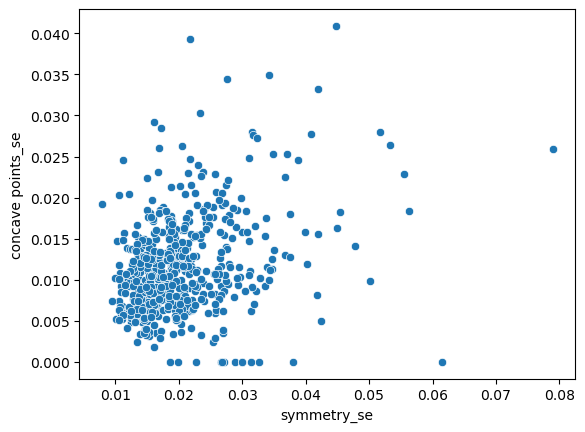

Correlation between symmetry_se and fractal_dimension_se: 0.3702637716326373


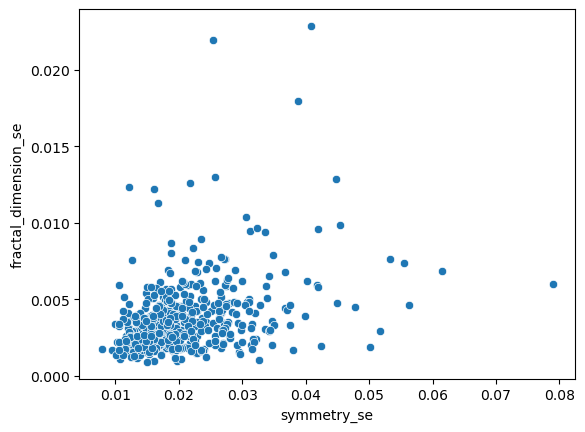

Correlation between symmetry_se and texture_worst: -0.08538689096883406


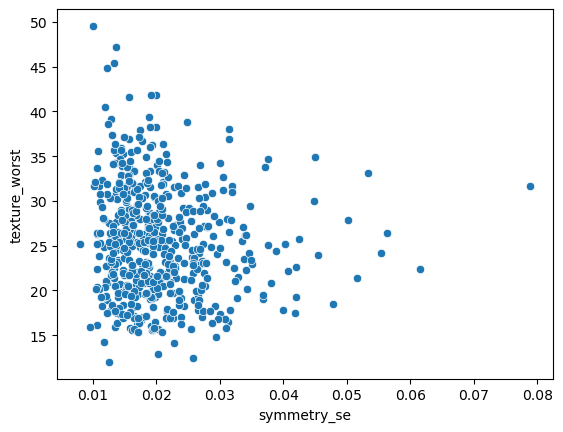

Correlation between symmetry_se and area_worst: -0.10025593344034148


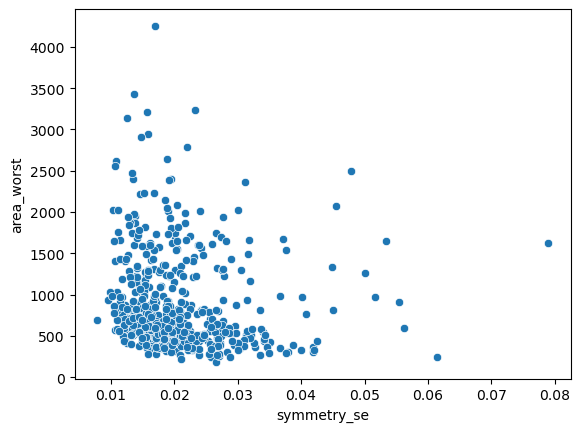

Correlation between symmetry_se and smoothness_worst: -0.04495269451475811


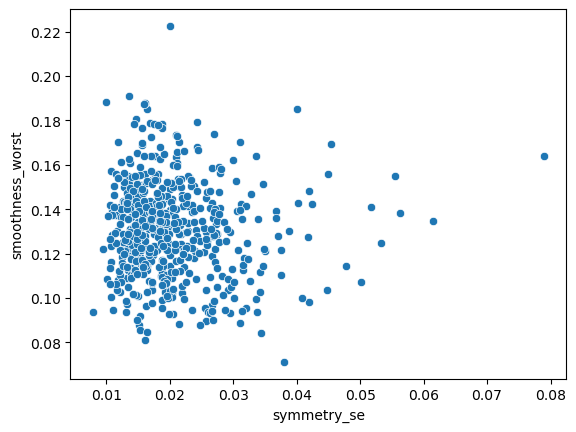

Correlation between symmetry_se and concave points_worst: -0.04625177102346587


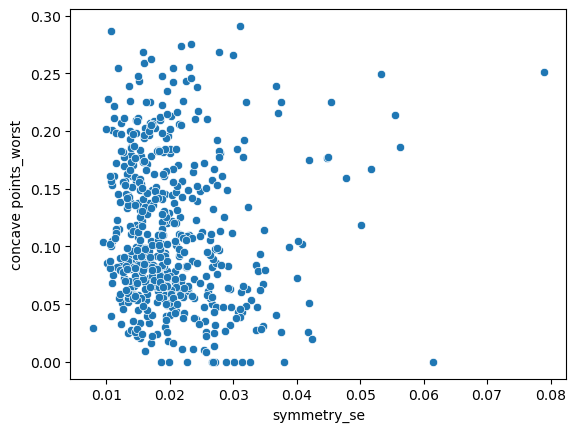

Correlation between symmetry_se and symmetry_worst: 0.3699144118556602


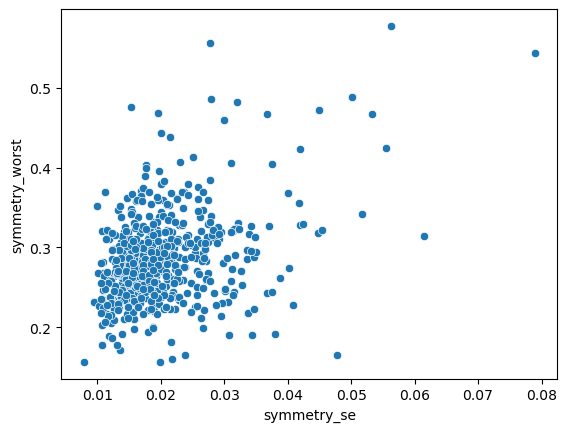

Correlation between symmetry_se and fractal_dimension_worst: 0.03511199572322076


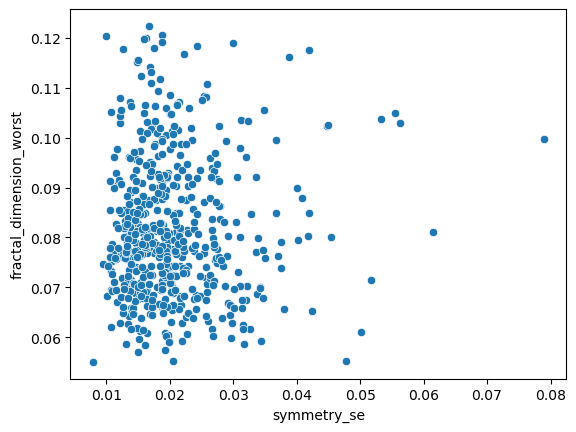

Correlation between fractal_dimension_se and diagnosis: 0.07654679847419932


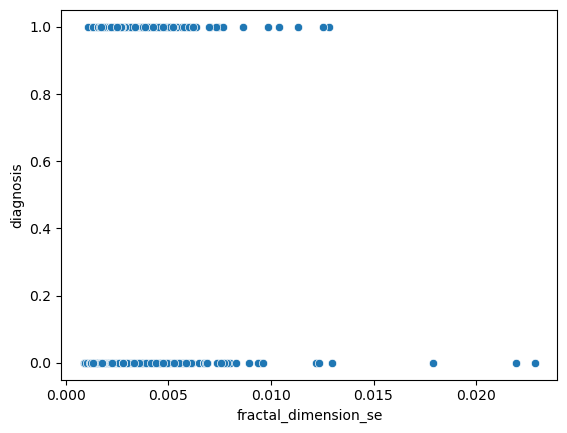

Correlation between fractal_dimension_se and smoothness_mean: 0.23994845545483467


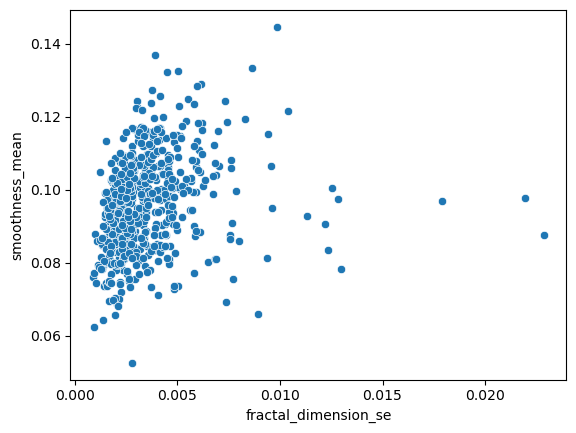

Correlation between fractal_dimension_se and symmetry_mean: 0.26726287447491226


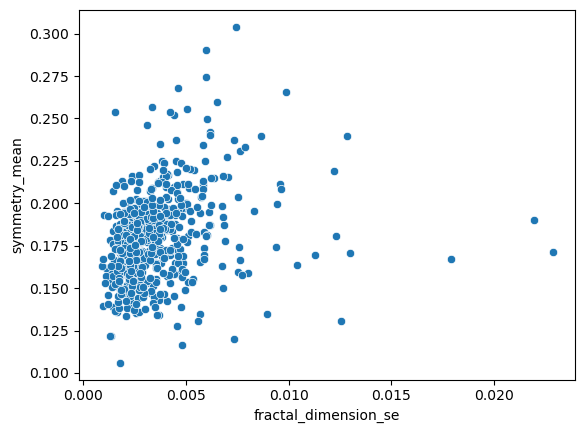

Correlation between fractal_dimension_se and fractal_dimension_mean: 0.6505292956000427


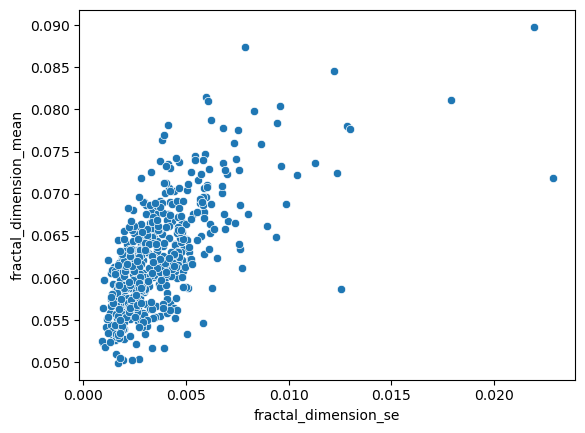

Correlation between fractal_dimension_se and texture_se: 0.2642337987621759


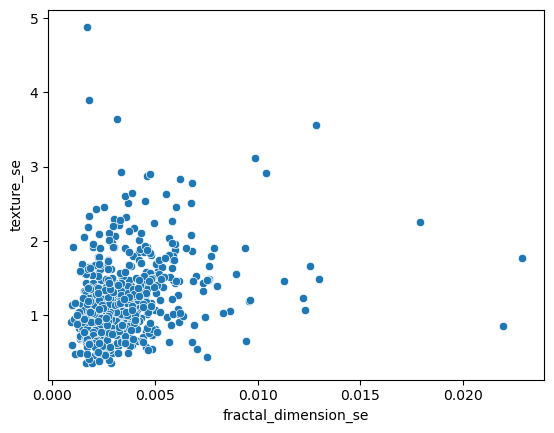

Correlation between fractal_dimension_se and smoothness_se: 0.446056661011383


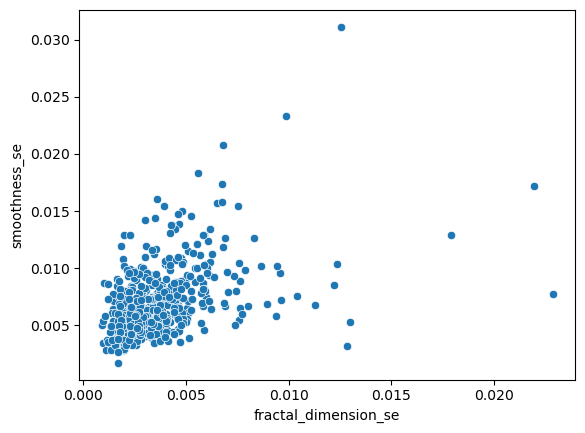

Correlation between fractal_dimension_se and concavity_se: 0.6421729208615594


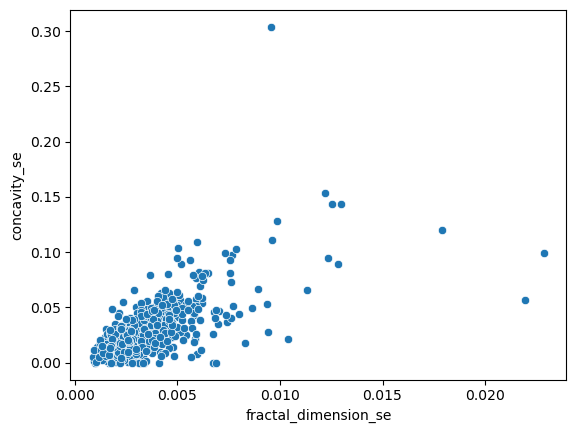

Correlation between fractal_dimension_se and concave points_se: 0.5765951858288583


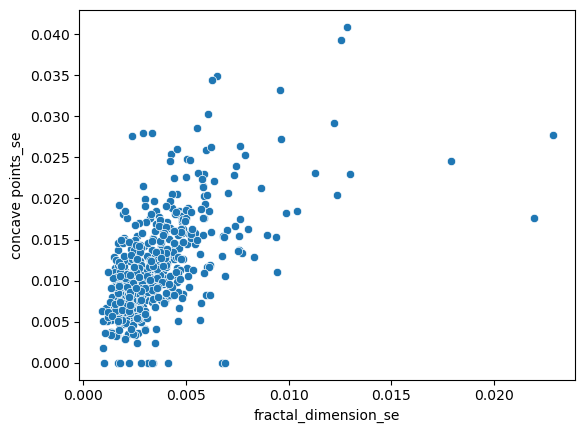

Correlation between fractal_dimension_se and symmetry_se: 0.37026377163263724


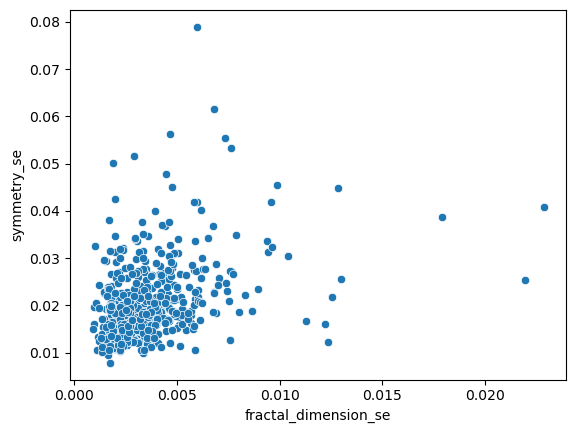

Correlation between fractal_dimension_se and texture_worst: -0.021802949770842045


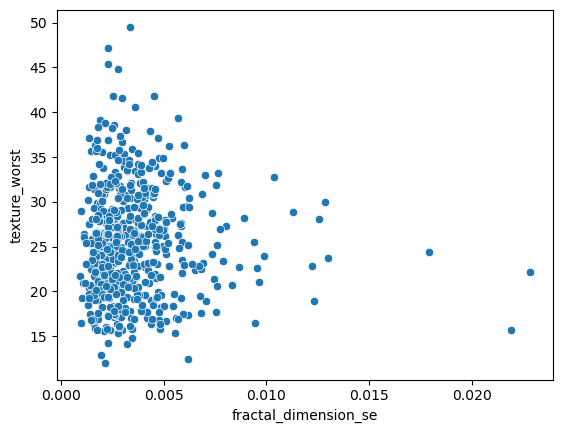

Correlation between fractal_dimension_se and area_worst: 0.005398693555502789


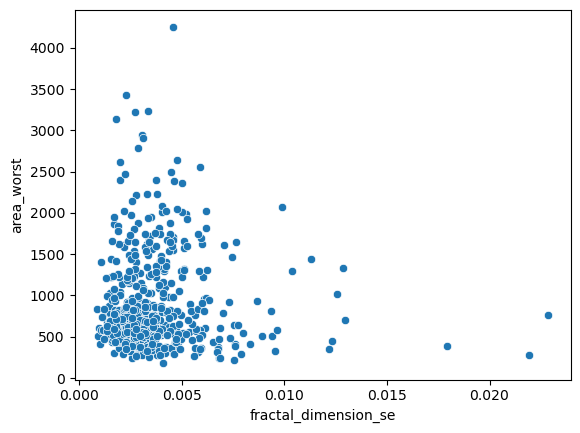

Correlation between fractal_dimension_se and smoothness_worst: 0.09953094243691252


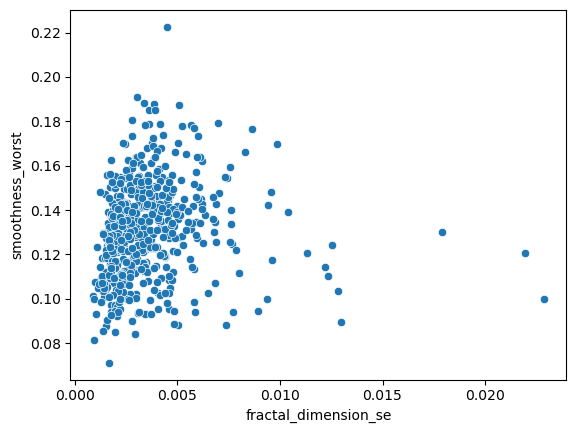

Correlation between fractal_dimension_se and concave points_worst: 0.19022688034767535


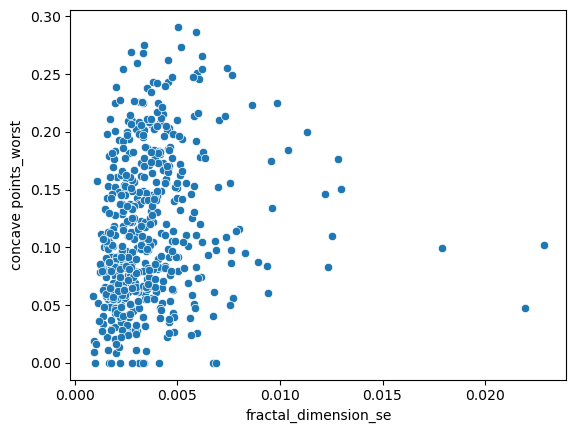

Correlation between fractal_dimension_se and symmetry_worst: 0.0269997269179463


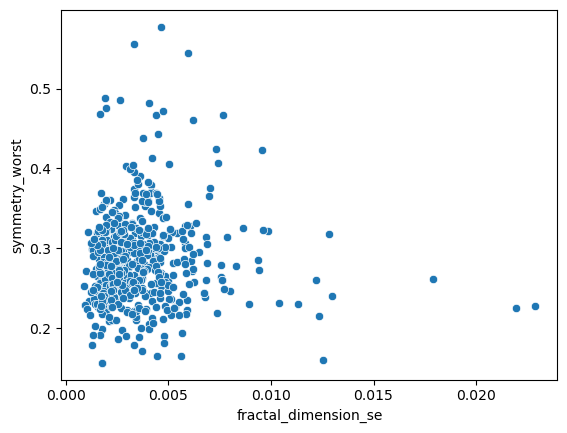

Correlation between fractal_dimension_se and fractal_dimension_worst: 0.5699939749118352


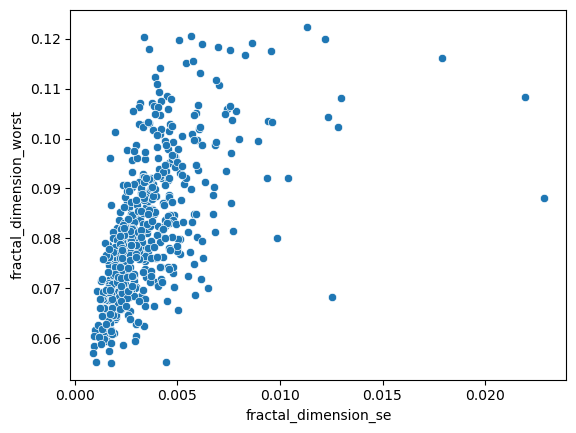

Correlation between texture_worst and diagnosis: 0.4386244916320673


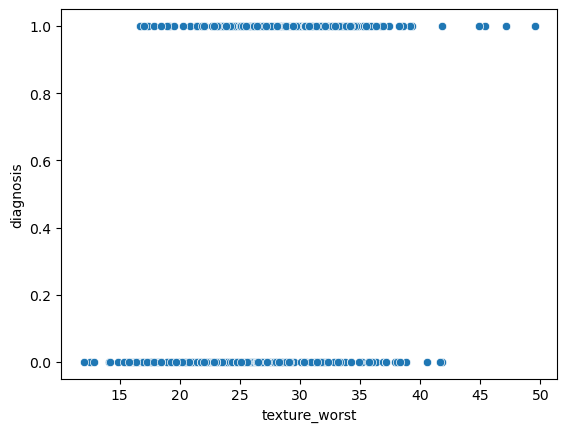

Correlation between texture_worst and smoothness_mean: 0.02046193989015613


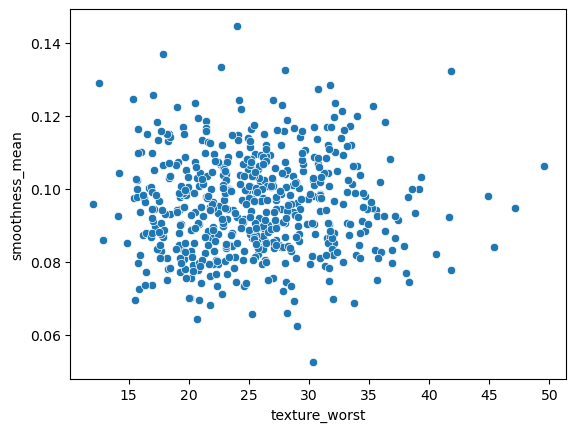

Correlation between texture_worst and symmetry_mean: 0.055550788118789184


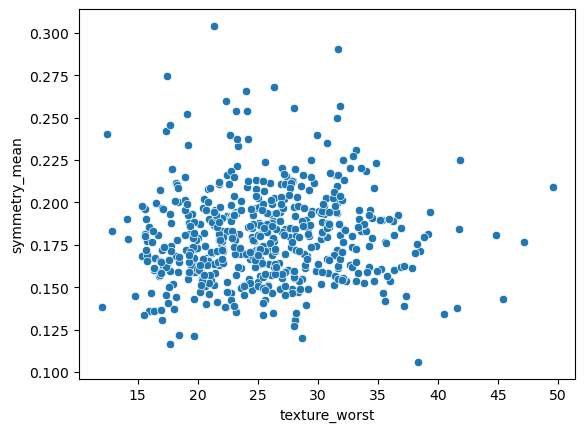

Correlation between texture_worst and fractal_dimension_mean: -0.09432909666764881


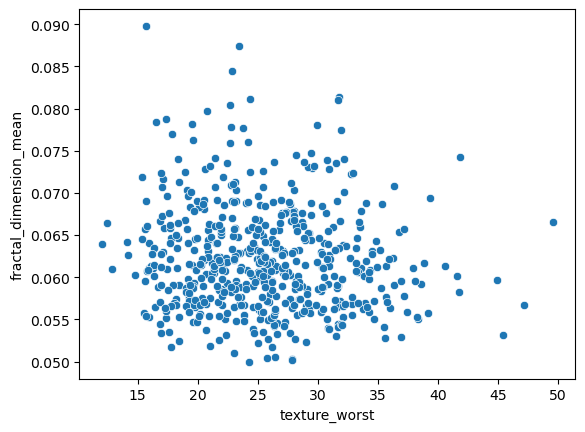

Correlation between texture_worst and texture_se: 0.42860914430186087


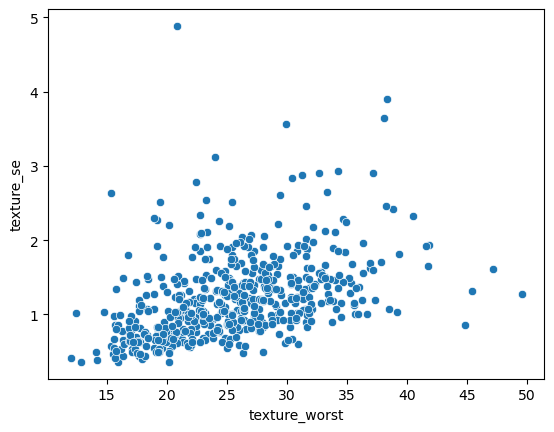

Correlation between texture_worst and smoothness_se: -0.05521476808016561


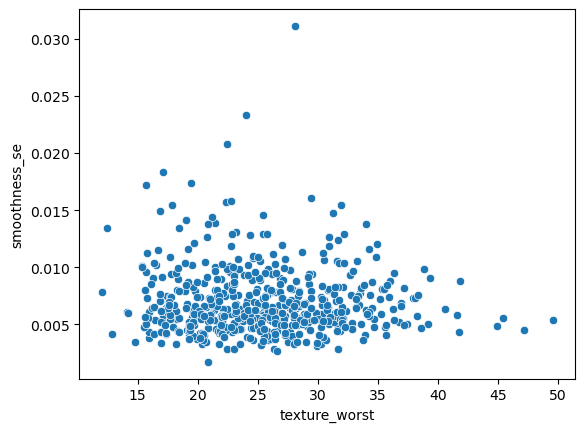

Correlation between texture_worst and concavity_se: 0.10574371369348767


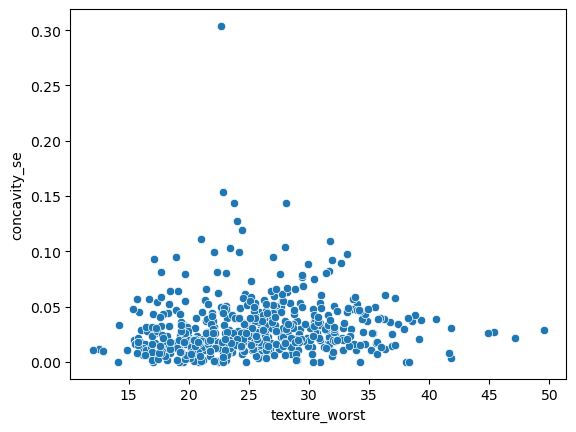

Correlation between texture_worst and concave points_se: 0.09647646008853865


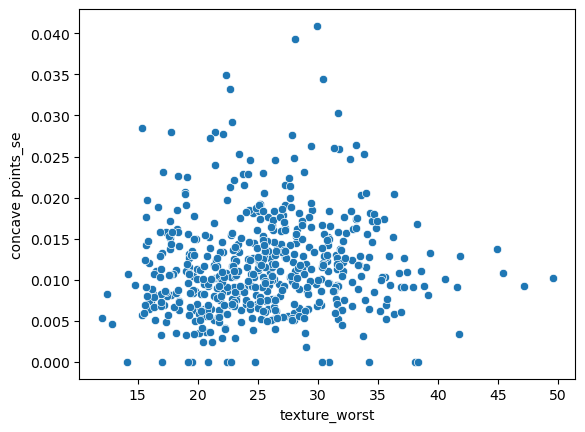

Correlation between texture_worst and symmetry_se: -0.08538689096883405


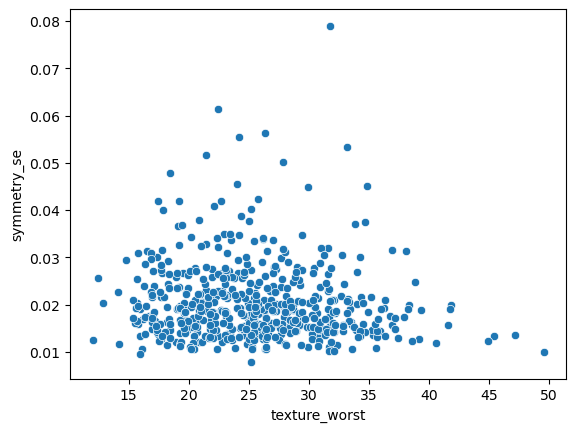

Correlation between texture_worst and fractal_dimension_se: -0.021802949770842045


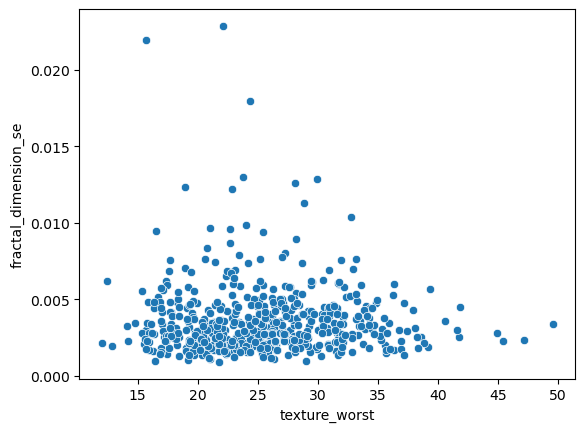

Correlation between texture_worst and area_worst: 0.34722060224553325


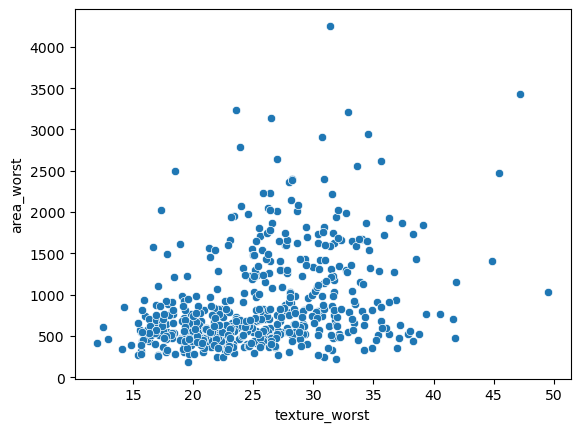

Correlation between texture_worst and smoothness_worst: 0.21202194472324357


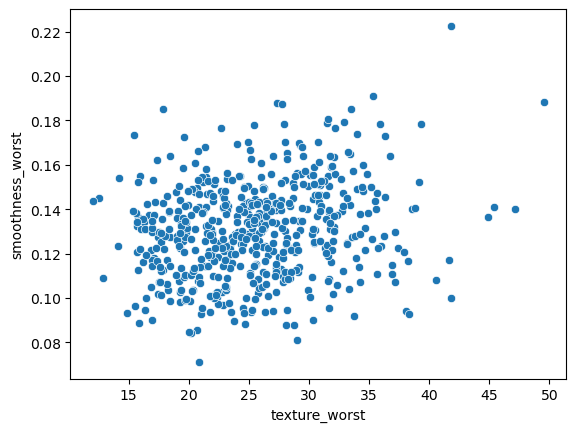

Correlation between texture_worst and concave points_worst: 0.3314700758234046


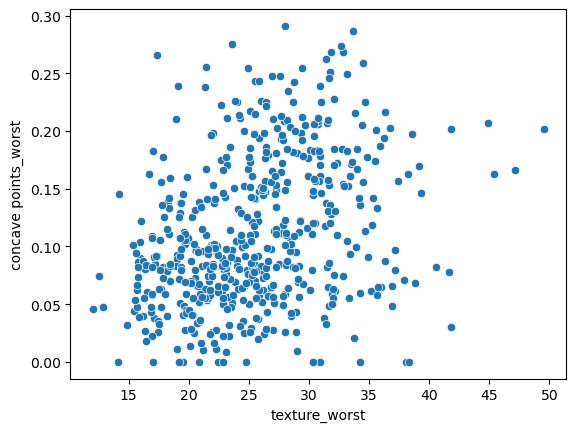

Correlation between texture_worst and symmetry_worst: 0.18690765096849776


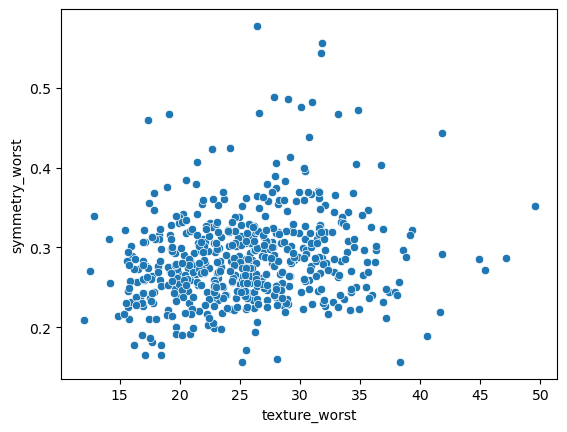

Correlation between texture_worst and fractal_dimension_worst: 0.160640925851916


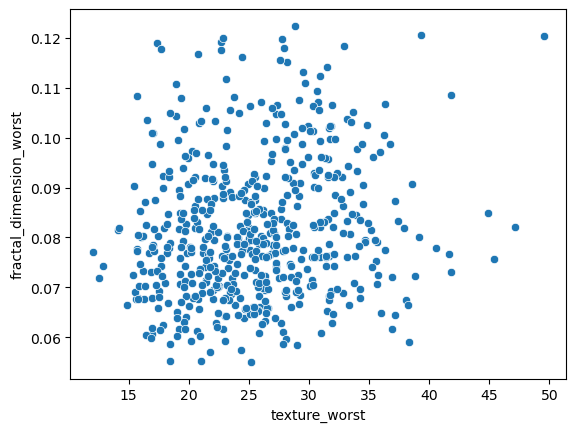

Correlation between area_worst and diagnosis: 0.7490176131048059


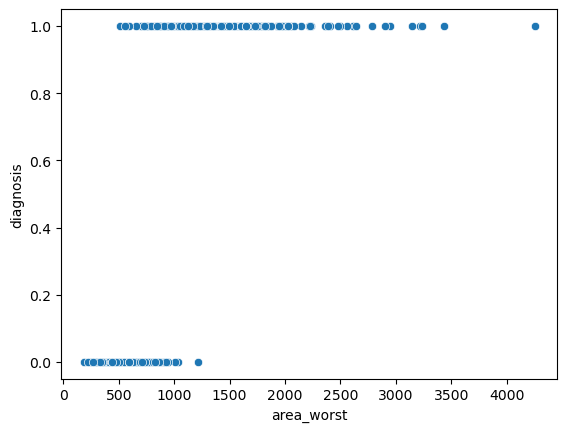

Correlation between area_worst and smoothness_mean: 0.23157931941545248


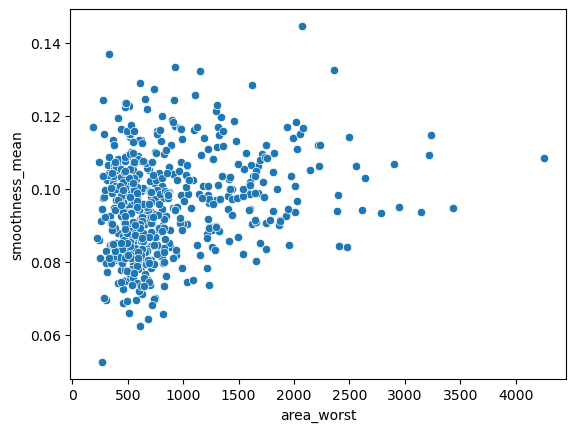

Correlation between area_worst and symmetry_mean: 0.19362867992360144


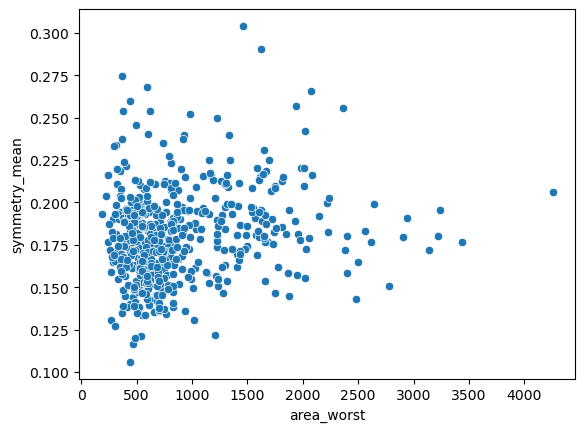

Correlation between area_worst and fractal_dimension_mean: -0.23929922590055536


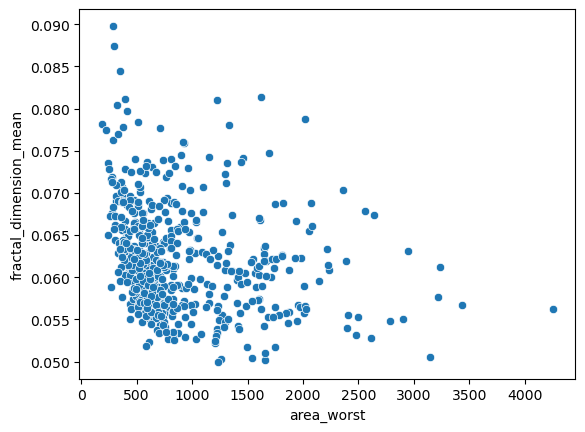

Correlation between area_worst and texture_se: -0.07213967660774069


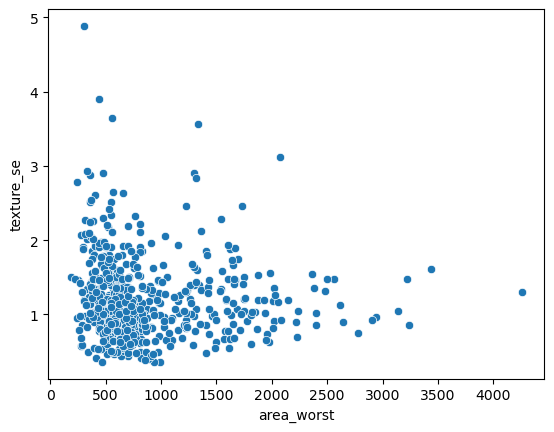

Correlation between area_worst and smoothness_se: -0.17037414398751344


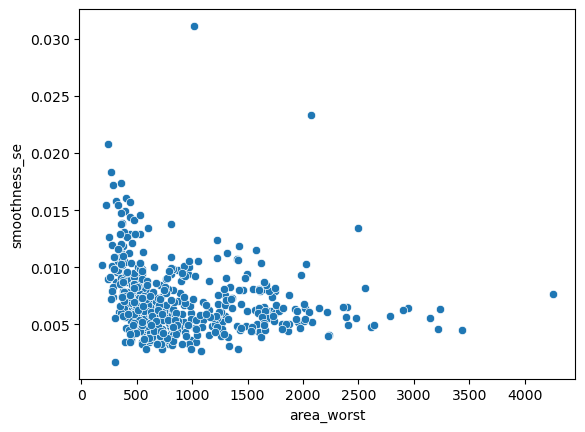

Correlation between area_worst and concavity_se: 0.253967184943931


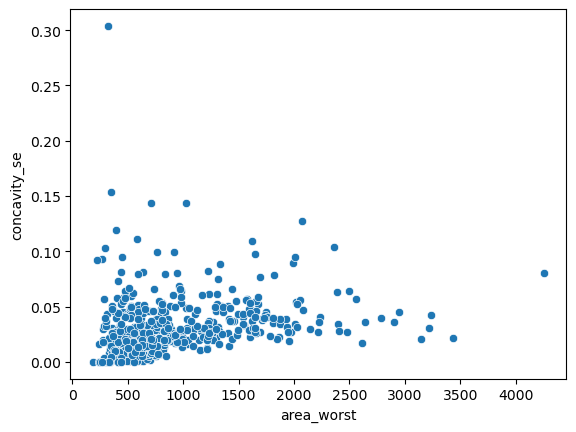

Correlation between area_worst and concave points_se: 0.37459085954340804


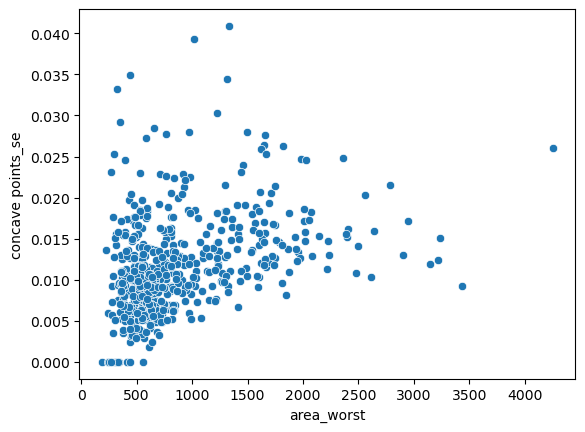

Correlation between area_worst and symmetry_se: -0.10025593344034148


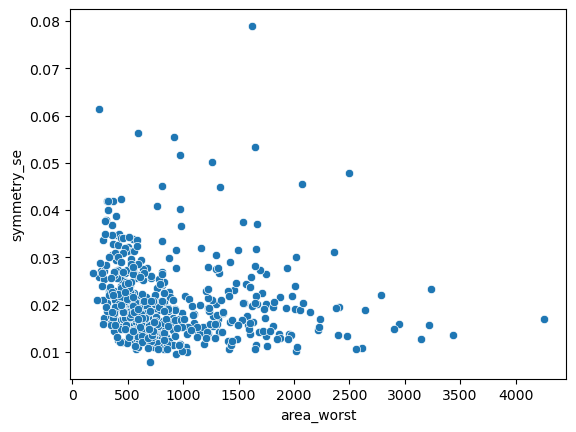

Correlation between area_worst and fractal_dimension_se: 0.00539869355550279


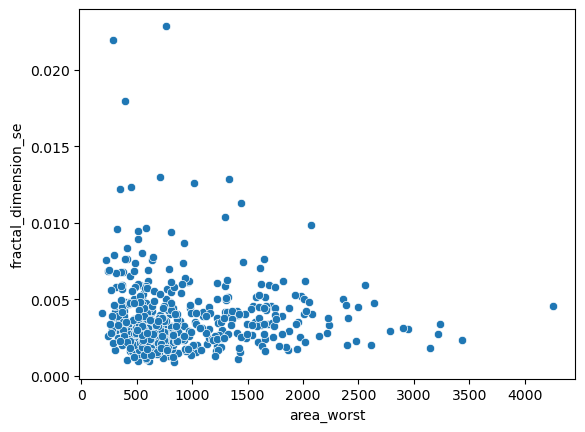

Correlation between area_worst and texture_worst: 0.34722060224553325


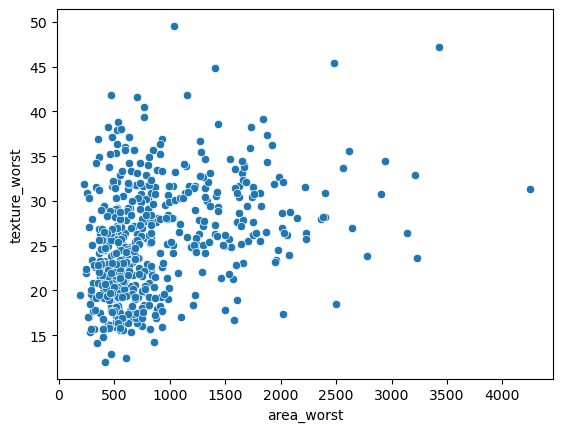

Correlation between area_worst and smoothness_worst: 0.2363724720184978


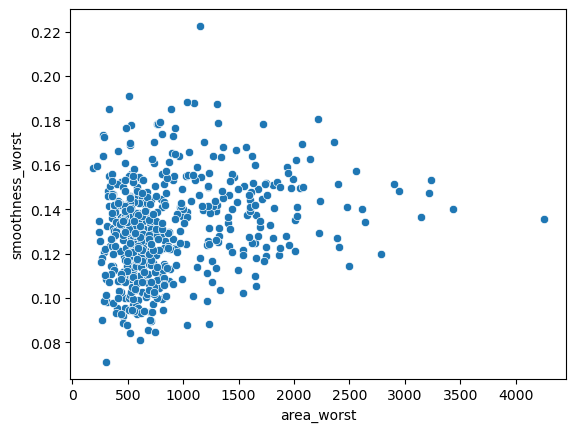

Correlation between area_worst and concave points_worst: 0.7747830533955918


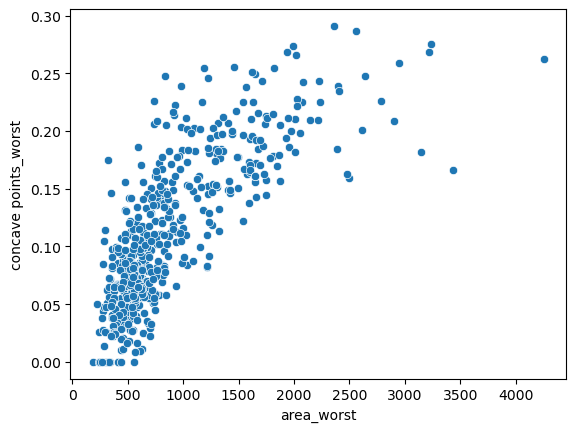

Correlation between area_worst and symmetry_worst: 0.23264598729002692


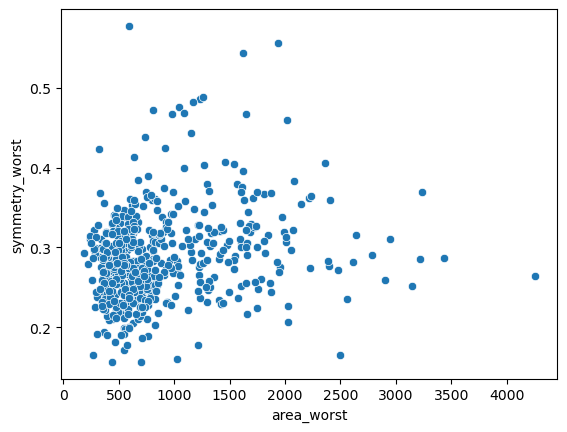

Correlation between area_worst and fractal_dimension_worst: 0.11287053512661509


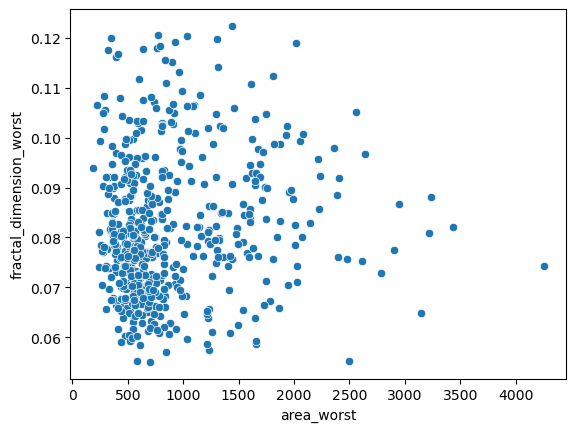

Correlation between smoothness_worst and diagnosis: 0.4013802986741983


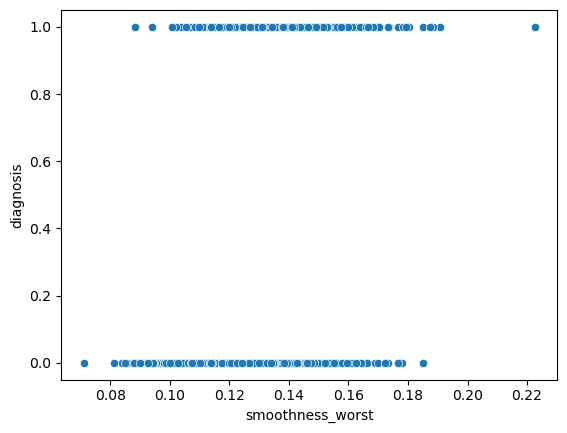

Correlation between smoothness_worst and smoothness_mean: 0.7920483383044107


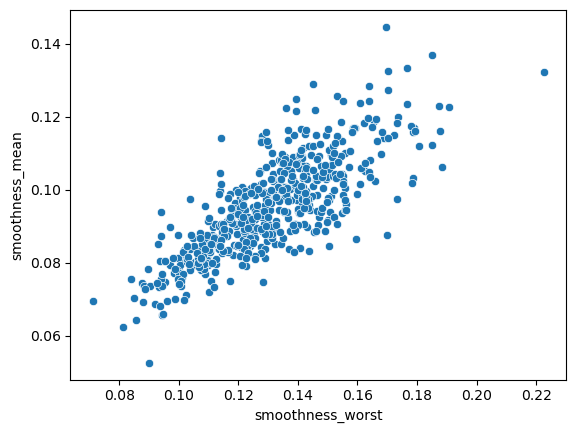

Correlation between smoothness_worst and symmetry_mean: 0.38341260634842506


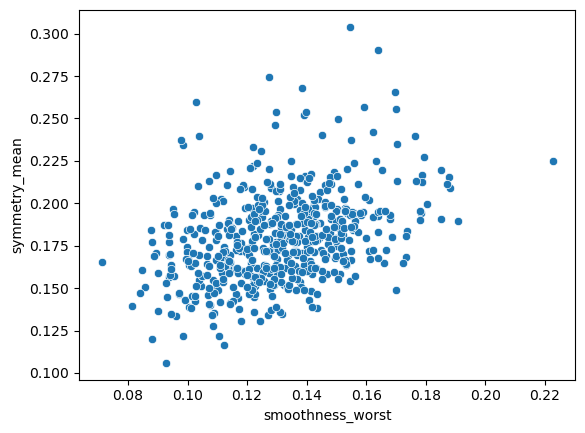

Correlation between smoothness_worst and fractal_dimension_mean: 0.42816734567713954


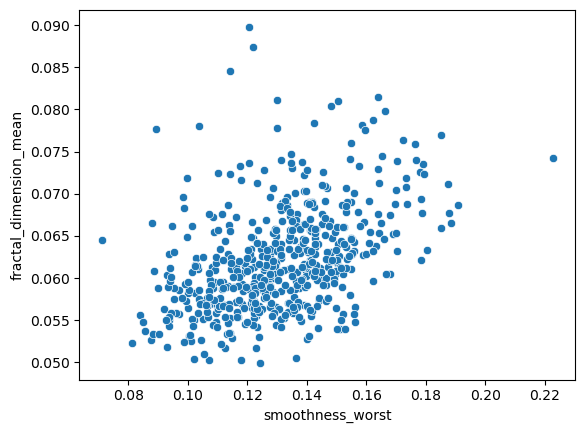

Correlation between smoothness_worst and texture_se: -0.07498557962089063


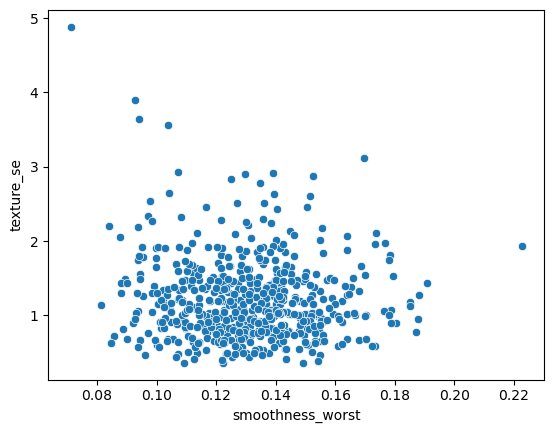

Correlation between smoothness_worst and smoothness_se: 0.3111595249274009


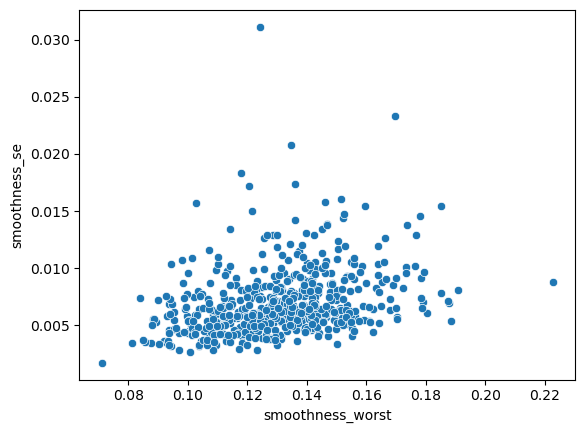

Correlation between smoothness_worst and concavity_se: 0.15761646157350445


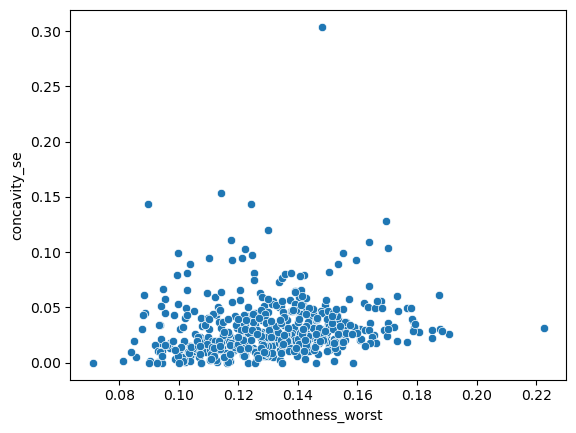

Correlation between smoothness_worst and concave points_se: 0.20850456731983502


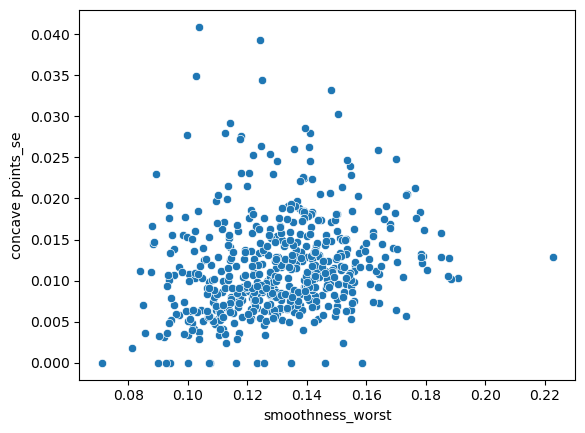

Correlation between smoothness_worst and symmetry_se: -0.04495269451475811


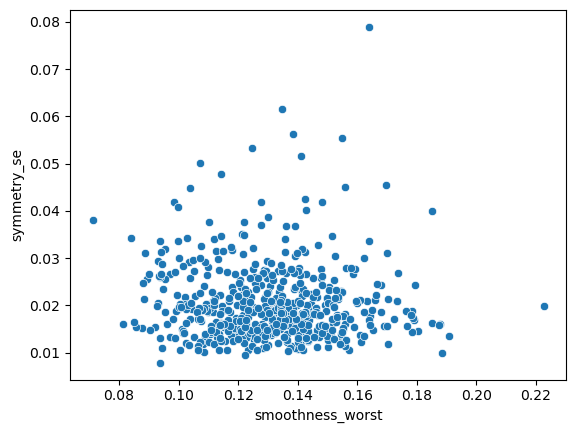

Correlation between smoothness_worst and fractal_dimension_se: 0.0995309424369125


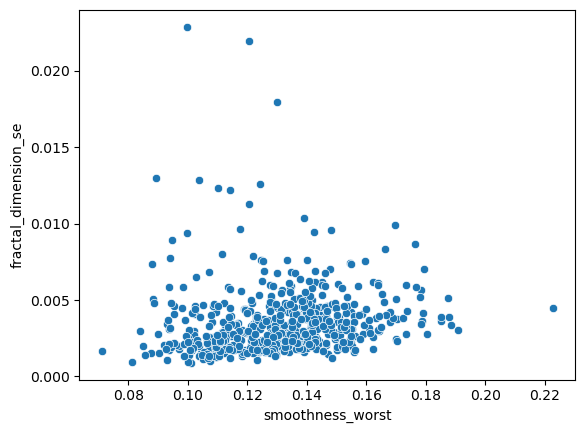

Correlation between smoothness_worst and texture_worst: 0.21202194472324357


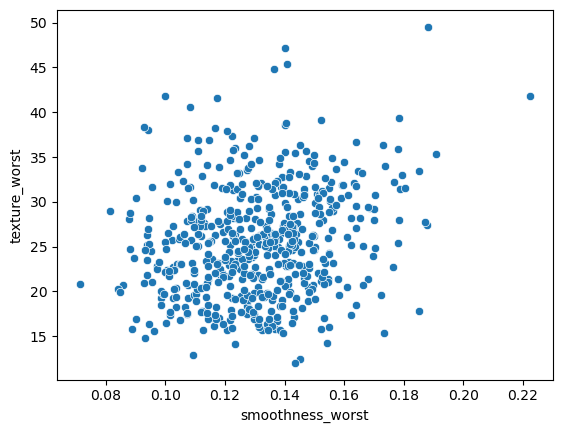

Correlation between smoothness_worst and area_worst: 0.23637247201849781


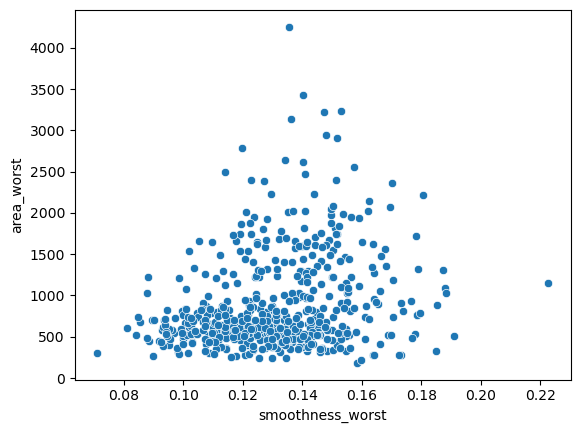

Correlation between smoothness_worst and concave points_worst: 0.5265121136941023


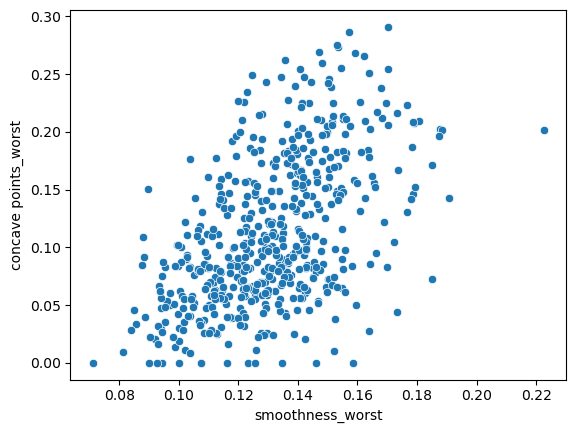

Correlation between smoothness_worst and symmetry_worst: 0.45363972512210066


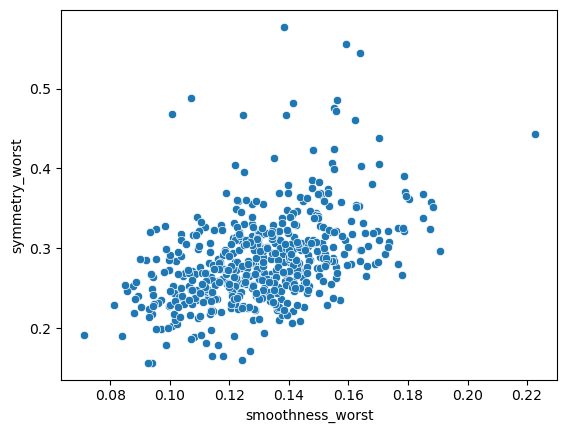

Correlation between smoothness_worst and fractal_dimension_worst: 0.5776952166592865


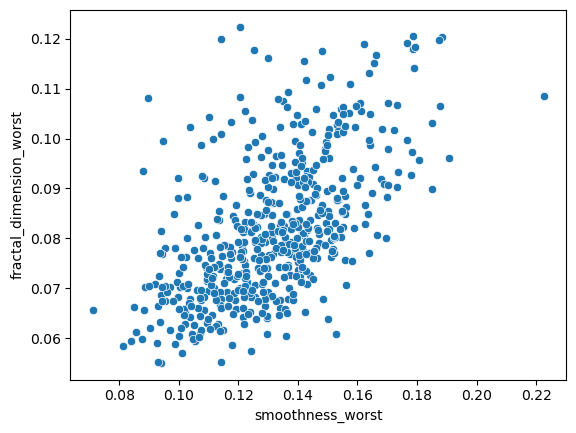

Correlation between concave points_worst and diagnosis: 0.7884458991634555


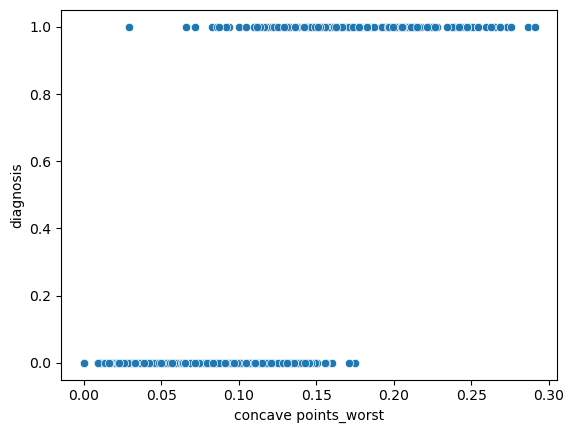

Correlation between concave points_worst and smoothness_mean: 0.48751881323492724


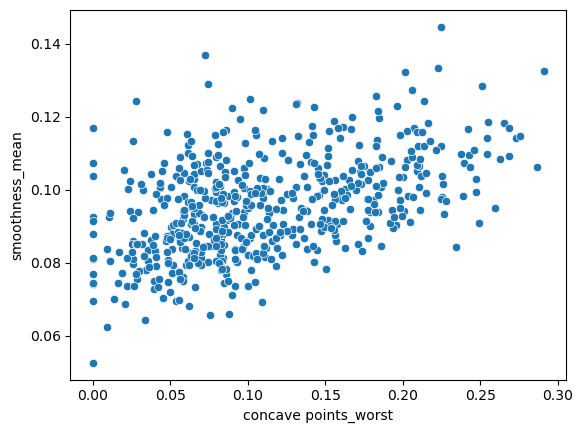

Correlation between concave points_worst and symmetry_mean: 0.3987344627613876


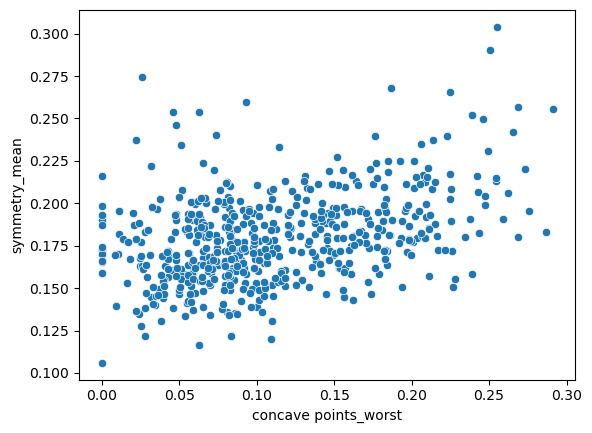

Correlation between concave points_worst and fractal_dimension_mean: 0.10412055374151263


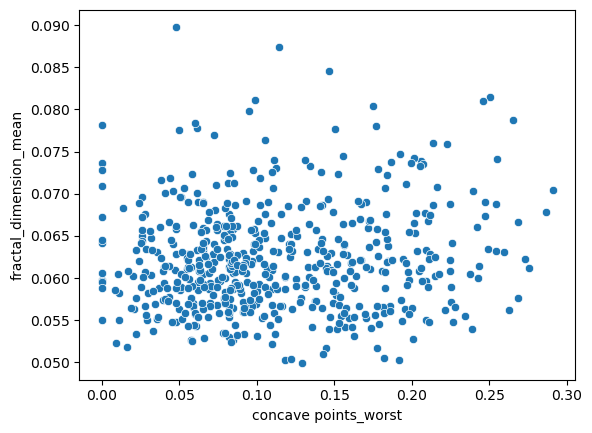

Correlation between concave points_worst and texture_se: -0.11872793125124584


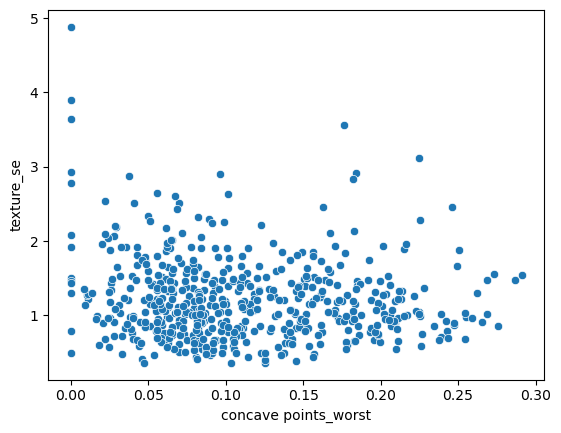

Correlation between concave points_worst and smoothness_se: -0.0996602579186051


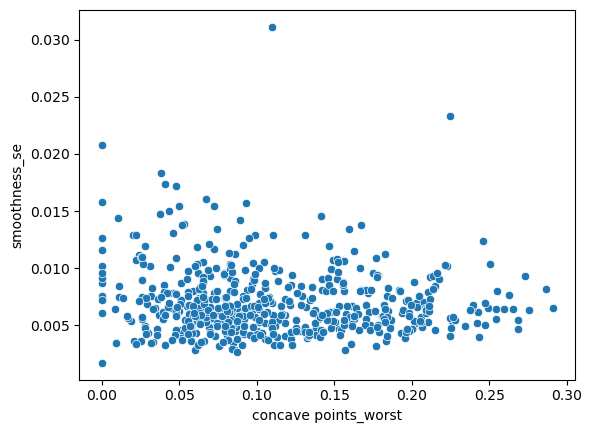

Correlation between concave points_worst and concavity_se: 0.4884007414520573


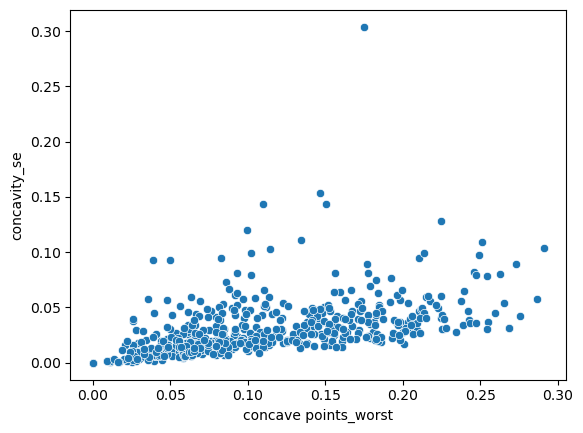

Correlation between concave points_worst and concave points_se: 0.627591732128159


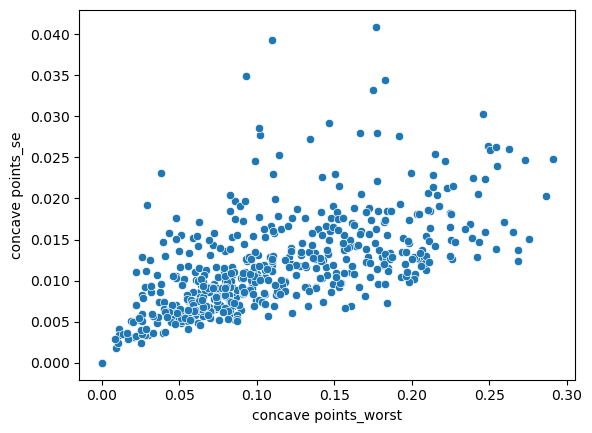

Correlation between concave points_worst and symmetry_se: -0.04625177102346587


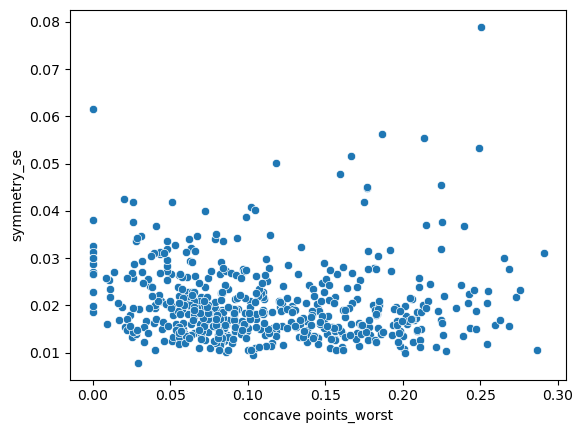

Correlation between concave points_worst and fractal_dimension_se: 0.19022688034767538


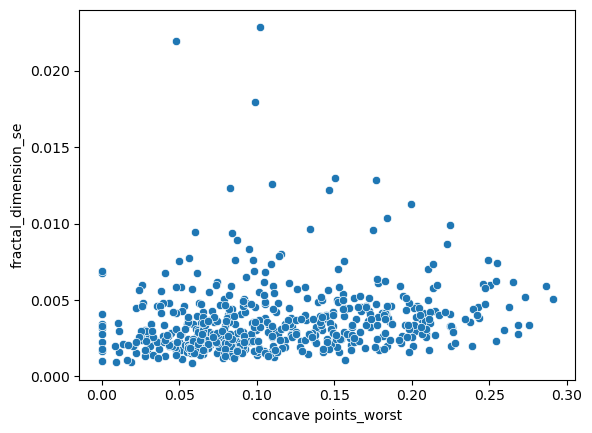

Correlation between concave points_worst and texture_worst: 0.3314700758234046


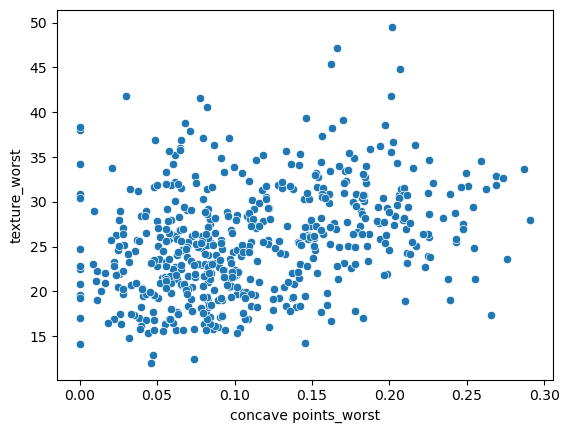

Correlation between concave points_worst and area_worst: 0.7747830533955918


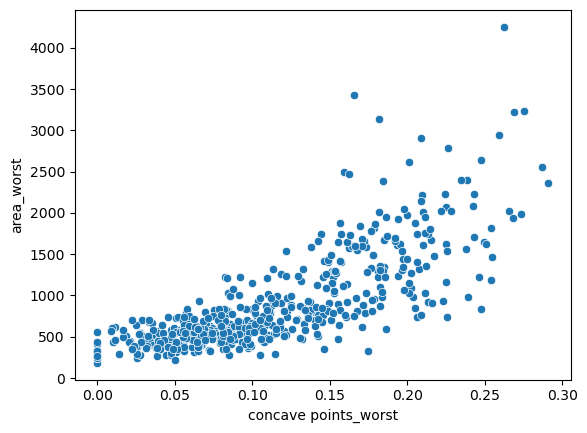

Correlation between concave points_worst and smoothness_worst: 0.5265121136941023


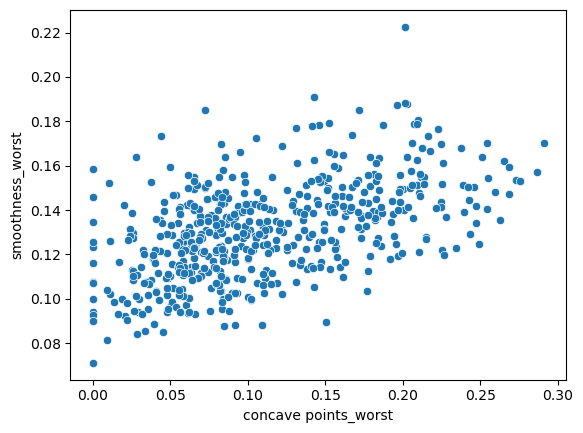

Correlation between concave points_worst and symmetry_worst: 0.46728499738424606


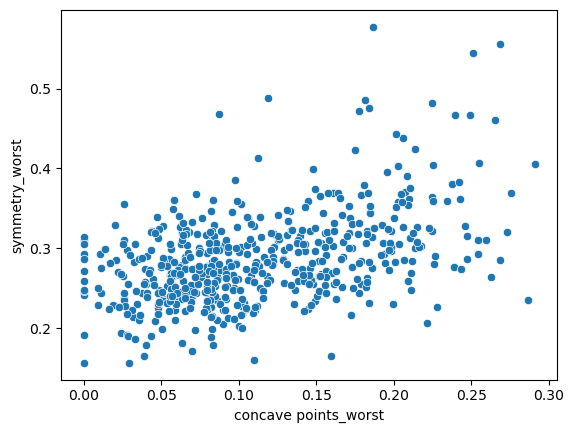

Correlation between concave points_worst and fractal_dimension_worst: 0.48860358702753


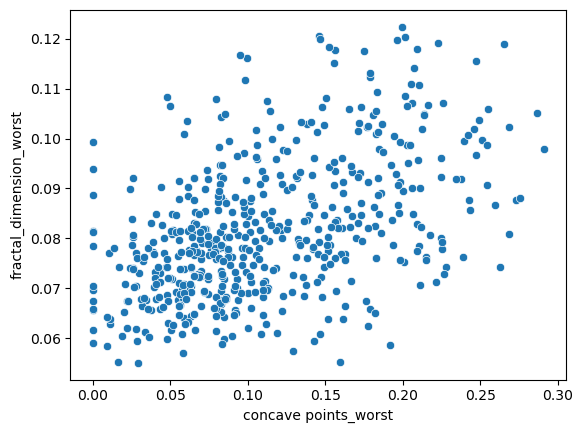

Correlation between symmetry_worst and diagnosis: 0.385208419234419


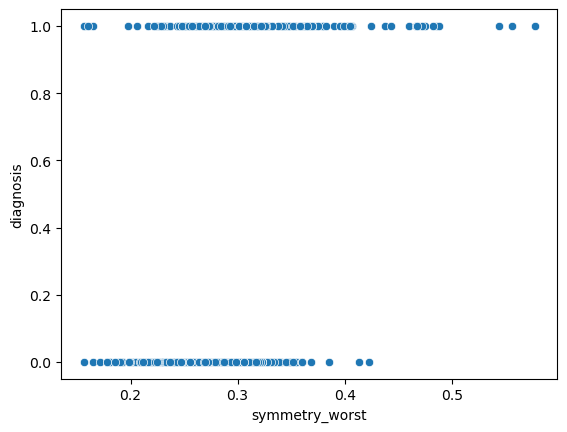

Correlation between symmetry_worst and smoothness_mean: 0.34983834663139285


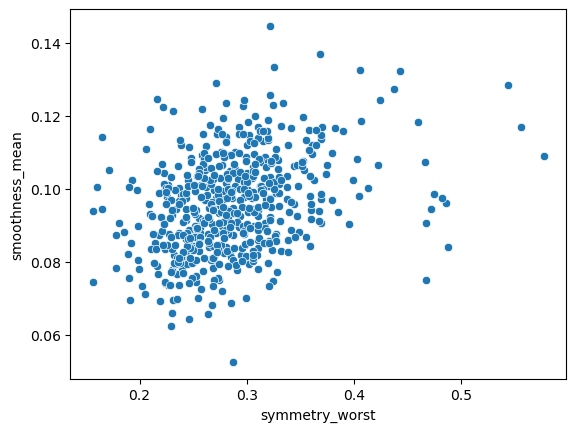

Correlation between symmetry_worst and symmetry_mean: 0.6843877770443114


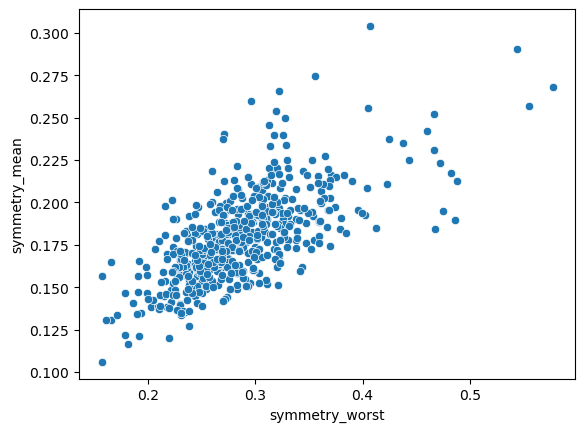

Correlation between symmetry_worst and fractal_dimension_mean: 0.2398490687198558


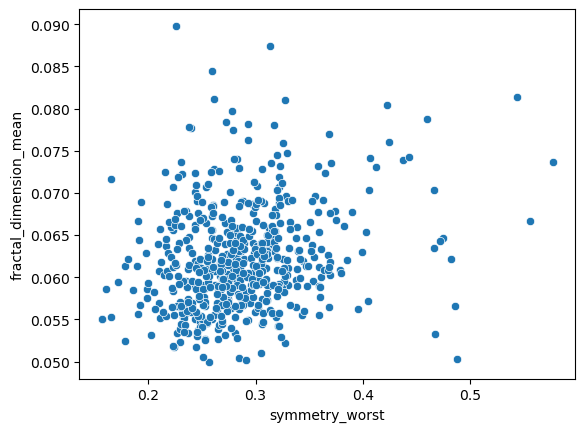

Correlation between symmetry_worst and texture_se: -0.147360578335162


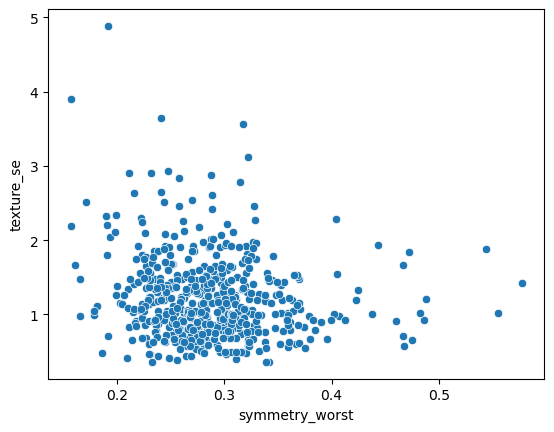

Correlation between symmetry_worst and smoothness_se: -0.11695297789862667


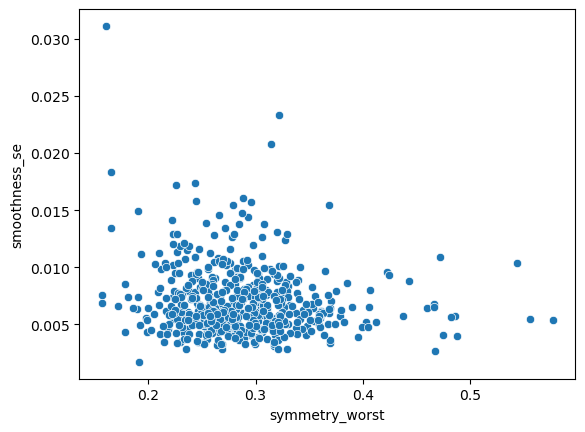

Correlation between symmetry_worst and concavity_se: 0.17574719092859395


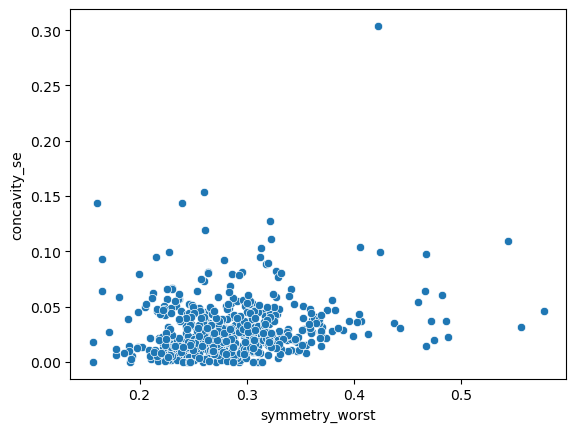

Correlation between symmetry_worst and concave points_se: 0.12858031864768


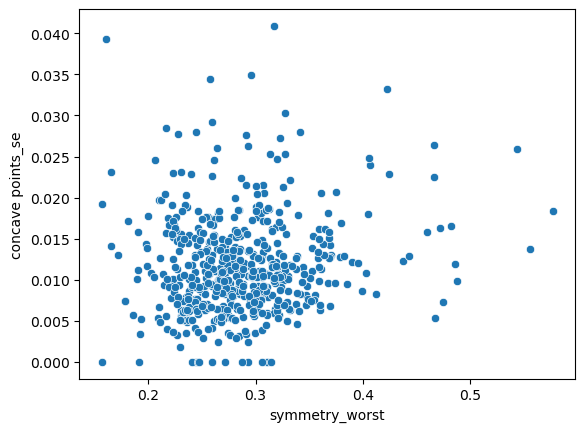

Correlation between symmetry_worst and symmetry_se: 0.36991441185566015


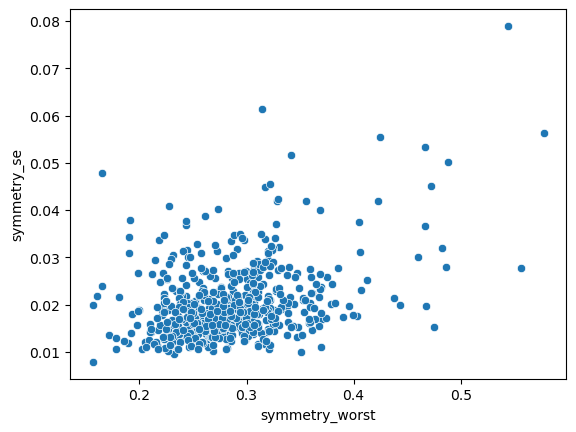

Correlation between symmetry_worst and fractal_dimension_se: 0.0269997269179463


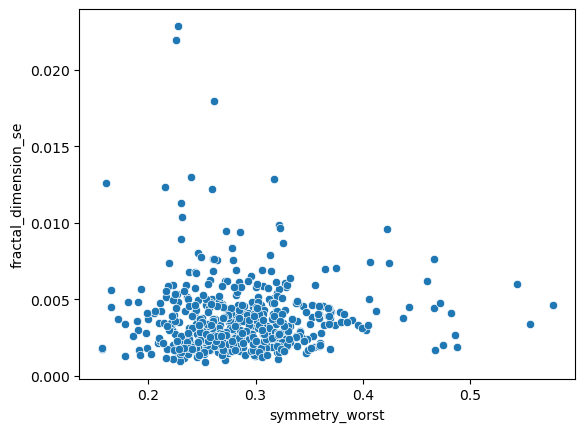

Correlation between symmetry_worst and texture_worst: 0.18690765096849773


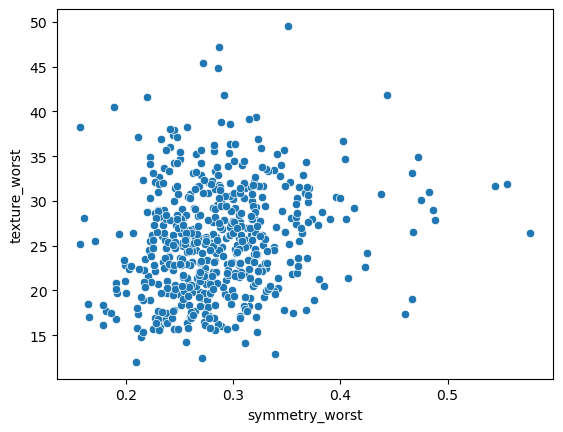

Correlation between symmetry_worst and area_worst: 0.2326459872900269


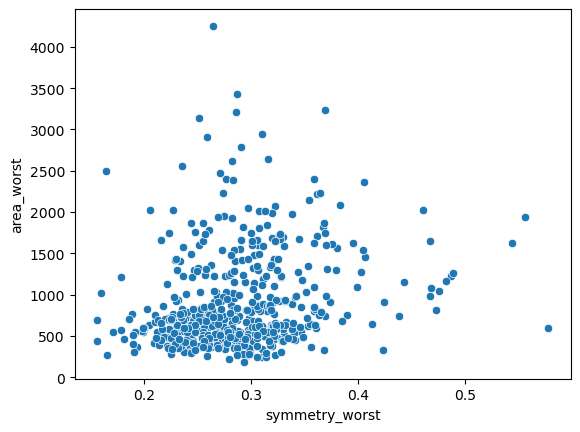

Correlation between symmetry_worst and smoothness_worst: 0.45363972512210066


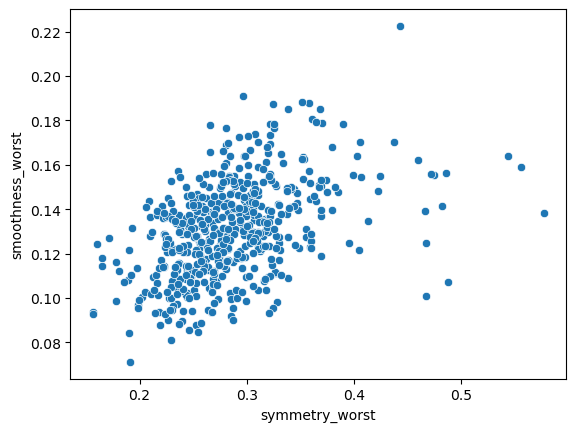

Correlation between symmetry_worst and concave points_worst: 0.46728499738424606


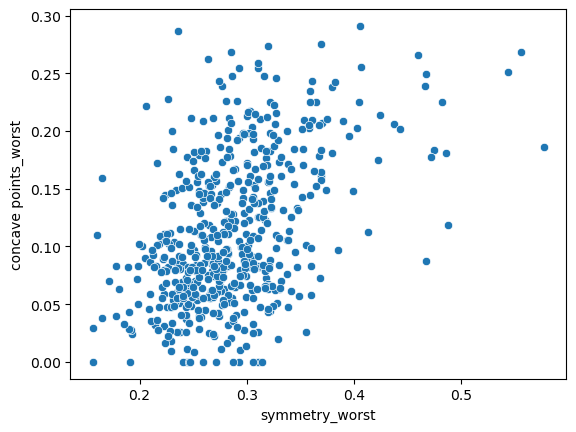

Correlation between symmetry_worst and fractal_dimension_worst: 0.4571482629069174


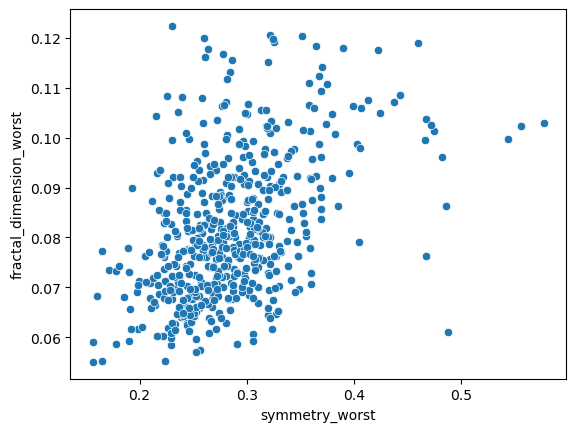

Correlation between fractal_dimension_worst and diagnosis: 0.2941926284978099


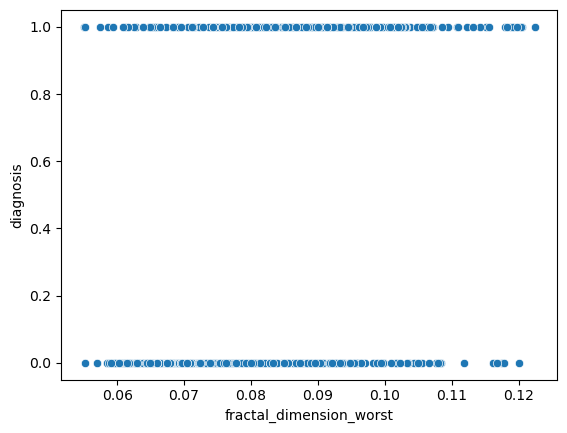

Correlation between fractal_dimension_worst and smoothness_mean: 0.45773481117714887


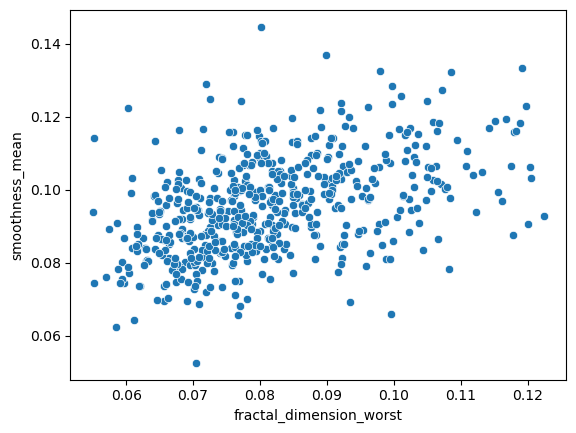

Correlation between fractal_dimension_worst and symmetry_mean: 0.3763825650675207


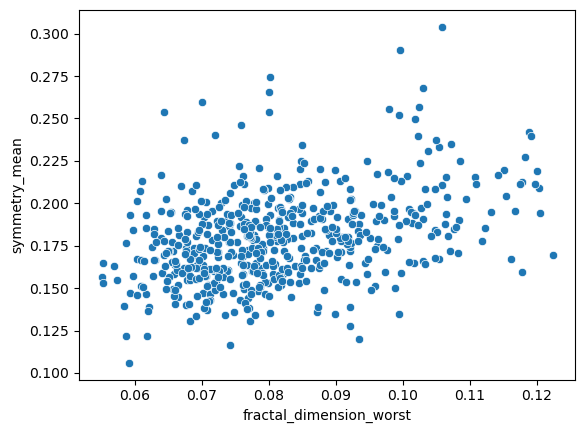

Correlation between fractal_dimension_worst and fractal_dimension_mean: 0.7423566932956452


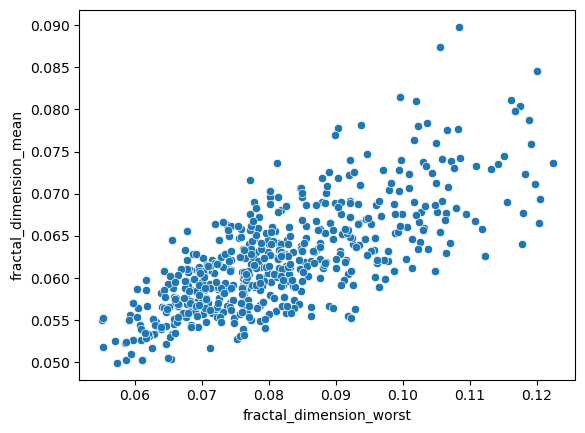

Correlation between fractal_dimension_worst and texture_se: -0.07851780869590609


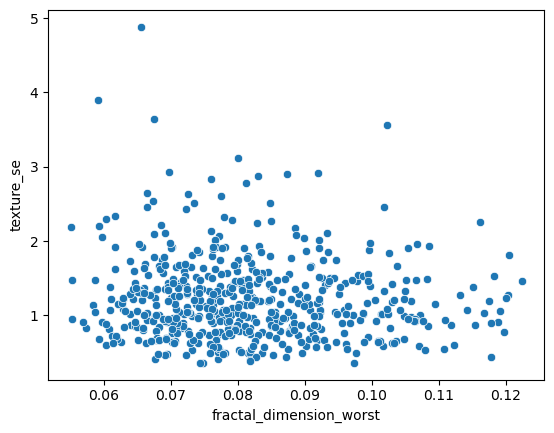

Correlation between fractal_dimension_worst and smoothness_se: 0.094141665301316


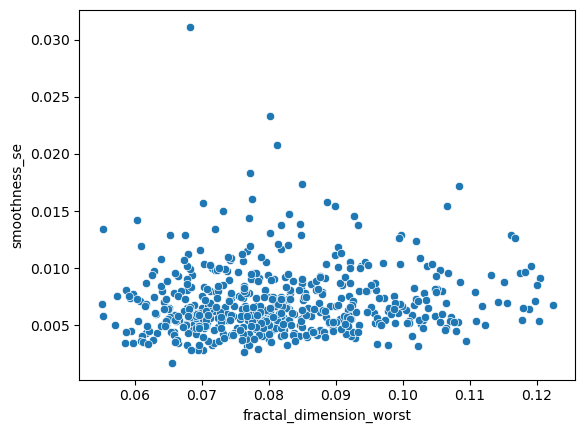

Correlation between fractal_dimension_worst and concavity_se: 0.4327243867931119


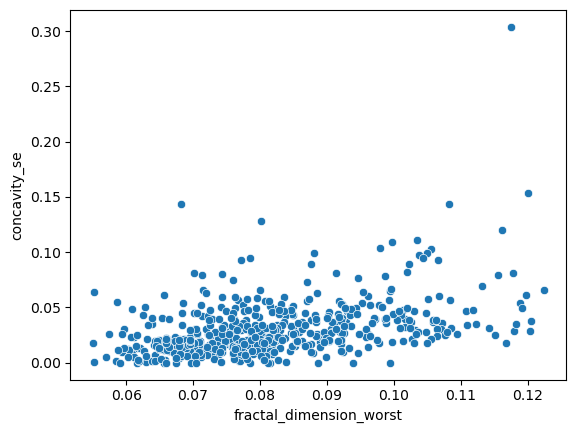

Correlation between fractal_dimension_worst and concave points_se: 0.31718982612275964


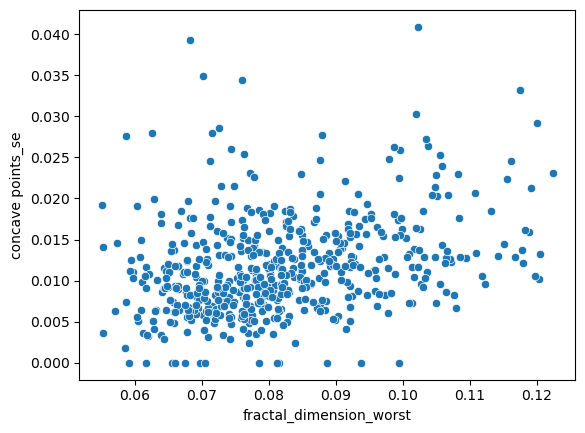

Correlation between fractal_dimension_worst and symmetry_se: 0.03511199572322076


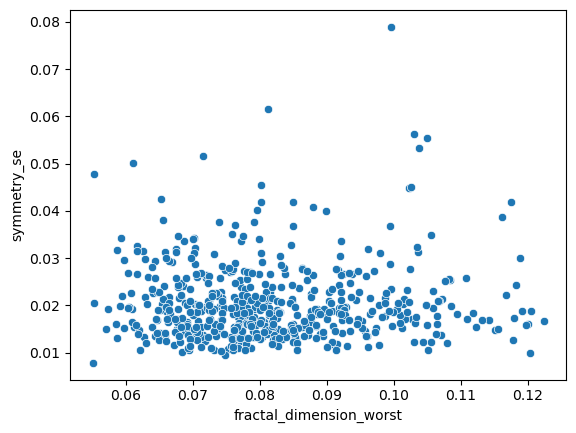

Correlation between fractal_dimension_worst and fractal_dimension_se: 0.5699939749118352


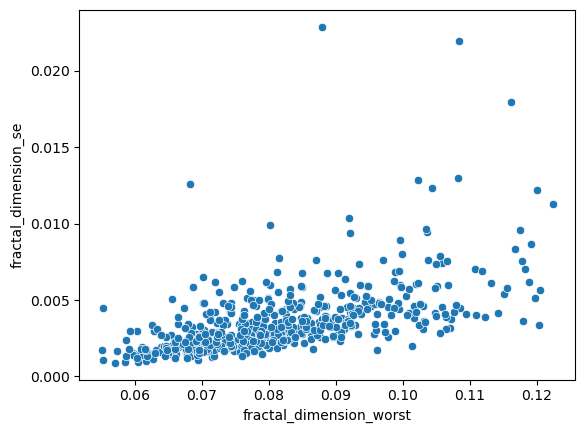

Correlation between fractal_dimension_worst and texture_worst: 0.160640925851916


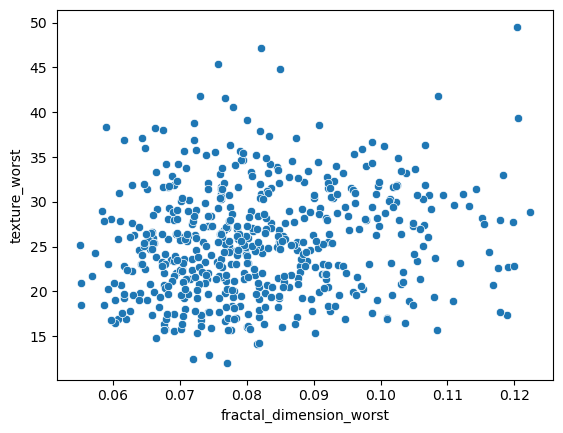

Correlation between fractal_dimension_worst and area_worst: 0.11287053512661509


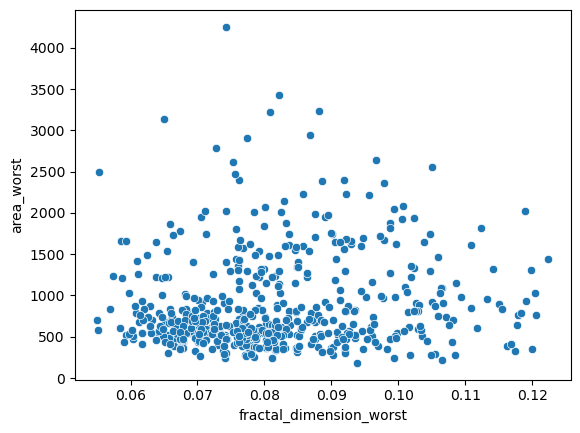

Correlation between fractal_dimension_worst and smoothness_worst: 0.5776952166592864


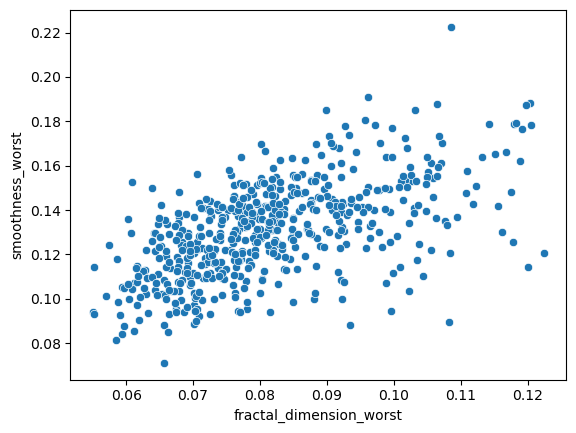

Correlation between fractal_dimension_worst and concave points_worst: 0.48860358702753


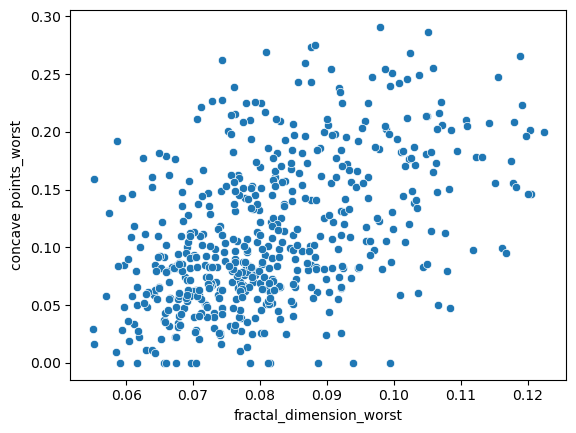

Correlation between fractal_dimension_worst and symmetry_worst: 0.4571482629069174


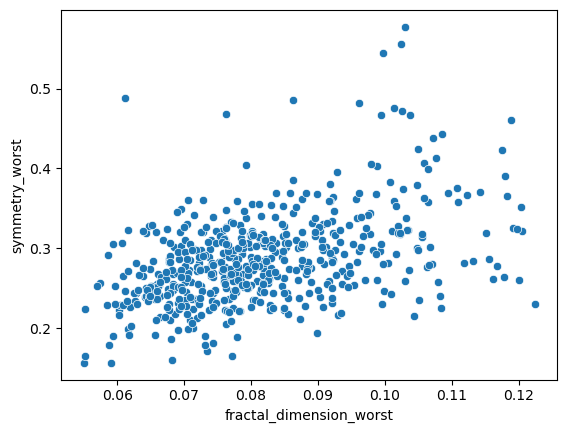

In [206]:
data_column_1= reduced_df.select_dtypes(include=np.number).columns.tolist()
for col1 in data_column_1:
    for col2 in data_column_1:
        if col1 != col2:  # Skip correlation with itself
            correlation = reduced_df[col1].corr(reduced_df[col2])
            print(f"Correlation between {col1} and {col2}: {correlation}")
            sns.scatterplot(x=reduced_df[col1], y= reduced_df[col2])
            plt.show()

In [207]:
X=reduced_df.drop(['diagnosis'],axis=1)
y=reduced_df['diagnosis']

In [262]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42, stratify=y)

In [263]:
print('y_train:\n', y_train.value_counts(), sep='')
print('y_test: \n', y_test.value_counts(), sep='')

# Calculate percentage of each distinct label in y_train
unique_train, counts_train = np.unique(y_train, return_counts=True)
percentages_train = counts_train / len(y_train) * 100

# Calculate percentage of each distinct label in y_test
unique_test, counts_test = np.unique(y_test, return_counts=True)
percentages_test = counts_test / len(y_test) * 100

# Print the percentages for each distinct label in y_train
print("Percentage of each distinct label in y_train:")
for label, percentage in zip(unique_train, percentages_train):
    print(f"Label {label}: {percentage:.2f}%")

# Print the percentages for each distinct label in y_test
print("\nPercentage of each distinct label in y_test:")
for label, percentage in zip(unique_test, percentages_test):
    print(f"Label {label}: {percentage:.2f}%")

y_train:
0    281
1    155
Name: diagnosis, dtype: int64
y_test: 
0    70
1    39
Name: diagnosis, dtype: int64
Percentage of each distinct label in y_train:
Label 0: 64.45%
Label 1: 35.55%

Percentage of each distinct label in y_test:
Label 0: 64.22%
Label 1: 35.78%


In [264]:
from sklearn.preprocessing import PowerTransformer

In [265]:
# Apply Yeo-Johnson transform

pt1 = PowerTransformer()

In [266]:
X_train_transformed = pt1.fit_transform(X_train)
X_test_transformed = pt1.transform(X_test)

In [267]:
scaler = StandardScaler()

In [268]:
# fit the scaler to the train set, it will learn the parameters
scaler.fit(X_train_transformed)

StandardScaler()

In [269]:
# transform train and test sets
X_train_scaled = scaler.transform(X_train_transformed)
X_test_scaled = scaler.transform(X_test_transformed)

In [270]:
# Instantiate PCA
pca = PCA(random_state=42)

In [271]:
# Fit train set on PCA
pca.fit(X_train_scaled)

PCA(random_state=42)

In [272]:
# Principal components
pca.components_

array([[ 3.19710597e-01,  2.84745981e-01,  2.66565366e-01,
         8.25431908e-02,  1.83777704e-01,  3.17820634e-01,
         3.08654694e-01,  1.29431503e-01,  3.14199260e-01,
         1.22223930e-01,  1.45083804e-01,  3.09689530e-01,
         3.09575170e-01,  2.43628685e-01,  3.25916326e-01],
       [ 2.07956568e-02,  4.97235158e-02,  3.27020014e-01,
         2.74843284e-01,  3.84250739e-01, -9.30947277e-02,
        -1.10833881e-01,  3.87618486e-01,  2.16277714e-01,
        -1.60560327e-01, -5.01385176e-01, -5.80448042e-02,
        -3.98574530e-01, -9.77632565e-02,  5.95156179e-03],
       [-2.03813474e-01, -1.54322309e-01, -2.37944879e-01,
         4.90749611e-01,  1.54543999e-01,  2.89949445e-01,
         3.35896582e-01,  1.22009245e-01,  1.50834460e-01,
         3.32593140e-01,  1.77365463e-01, -2.72445043e-01,
         5.89575235e-02, -3.19189429e-01, -2.38982274e-01],
       [-4.99985388e-02, -3.98347796e-01,  2.03850358e-01,
        -2.86723070e-01, -2.40906264e-04,  2.49284242

In [273]:
# Cumuliative varinace of the PCs
variance_cumu = np.cumsum(pca.explained_variance_ratio_)
print(variance_cumu)

[0.36024816 0.53863142 0.66631456 0.75746067 0.83689315 0.90302856
 0.93115415 0.95243771 0.97100977 0.98104471 0.98788242 0.99422345
 0.99665042 0.99870655 1.        ]


Text(0, 0.5, 'Cumulative Variance')

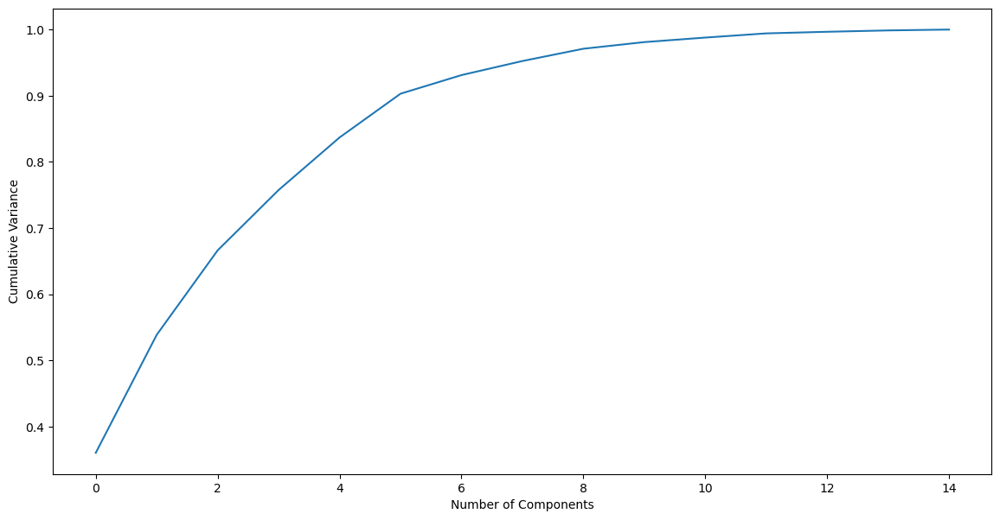

In [274]:
# Plotting scree plot
fig = plt.figure(figsize = (14,7))
plt.plot(variance_cumu)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Variance')

In [275]:
# Importing incremental PCA
from sklearn.decomposition import IncrementalPCA

In [276]:
# Instantiate PCA with 1 components
pca_final = IncrementalPCA(n_components=6)

In [277]:
# Fit and transform the X_train
X_train_pca = pca_final.fit_transform(X_train_scaled)

In [278]:
X_test_pca = pca_final.transform(X_test_scaled)

In [279]:
# Creating KFold object with 5 splits
folds = KFold(n_splits=5, shuffle=True, random_state=4)

# Specify params
params = {"C": [0.01, 0.1, 1, 10, 100, 1000]} # learning rate 0.01 0.1   

# Specifing score as recall as we are more focused on acheiving the higher sensitivity than the accuracy
model_cv = GridSearchCV(estimator = LogisticRegression(),
                        param_grid = params, 
                        scoring= 'recall',   # metrics  accuracy, recall, (F1, AUC)
                        cv = folds, 
                        verbose = 1,
                        return_train_score=True) 

# Fit the model
model_cv.fit(X_train_pca, y_train)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


GridSearchCV(cv=KFold(n_splits=5, random_state=4, shuffle=True),
             estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1, 10, 100, 1000]},
             return_train_score=True, scoring='recall', verbose=1)

In [280]:
model_cv.best_params_

{'C': 1}

In [281]:
# results of grid search CV
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.008687,0.002237,0.000000,0.000000,0.01,{'C': 0.01},1.0,0.878788,0.866667,0.71875,...,0.847680,0.096491,6,0.817460,0.852459,0.840,0.869919,0.854839,0.846935,0.017539
1,0.003287,0.006575,0.001753,0.003188,0.1,{'C': 0.1},1.0,0.878788,0.933333,0.87500,...,0.905166,0.056230,5,0.904762,0.918033,0.912,0.918699,0.919355,0.914570,0.005563
2,0.002109,0.002591,0.004501,0.004355,1,{'C': 1},1.0,0.878788,0.933333,0.90625,...,0.924319,0.041601,1,0.936508,0.950820,0.936,0.959350,0.943548,0.945245,0.008885
3,0.004430,0.004142,0.000000,0.000000,10,{'C': 10},1.0,0.878788,0.900000,0.93750,...,0.923903,0.042450,2,0.944444,0.950820,0.944,0.959350,0.959677,0.951658,0.006854
4,0.003958,0.003618,0.003904,0.004834,100,{'C': 100},1.0,0.878788,0.900000,0.93750,...,0.923903,0.042450,2,0.944444,0.950820,0.944,0.959350,0.959677,0.951658,0.006854
5,0.005060,0.004183,0.002949,0.005543,1000,{'C': 1000},1.0,0.878788,0.900000,0.93750,...,0.923903,0.042450,2,0.944444,0.950820,0.944,0.959350,0.959677,0.951658,0.006854


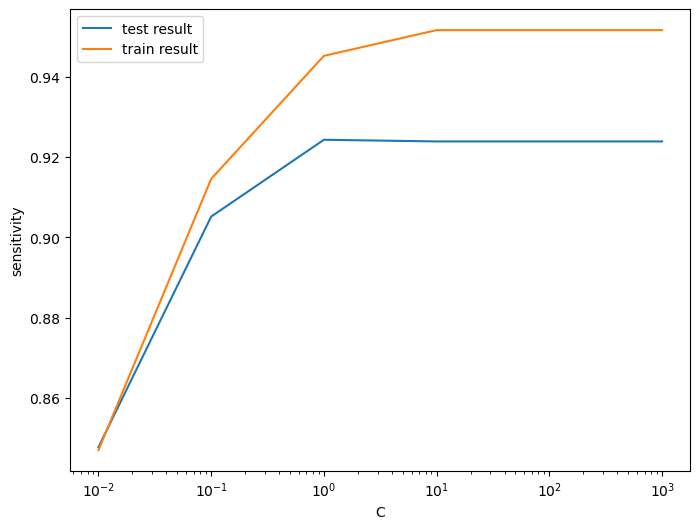

In [282]:
# plot of C versus train and validation scores

plt.figure(figsize=(8, 6))
plt.plot(cv_results['param_C'], cv_results['mean_test_score'])
plt.plot(cv_results['param_C'], cv_results['mean_train_score'])
plt.xlabel('C')
plt.ylabel('sensitivity')
plt.legend(['test result', 'train result'], loc='upper left')
plt.xscale('log')

In [283]:
# Best score with best C
best_score = model_cv.best_score_
best_C = model_cv.best_params_['C']

print(" The highest test sensitivity is {0} at C = {1}".format(best_score, best_C))

 The highest test sensitivity is 0.9243194037145651 at C = 1


In [284]:
# Instantiate the model with best C
logistic_pca = LogisticRegression(C=best_C)

In [285]:
# Fit the model on the train set
log_pca_model = logistic_pca.fit(X_train_pca, y_train)

In [286]:
# Predictions on the train set
y_train_pred = log_pca_model.predict(X_train_pca)

In [287]:
# Confusion matrix
confusion_train =confusion_matrix(y_train, y_train_pred)
print(confusion_train)

[[275   6]
 [  8 147]]


In [288]:
accuracy_score(y_train, y_train_pred) 

0.9678899082568807

In [289]:
precision_score(y_train, y_train_pred) 

0.9607843137254902

In [290]:
recall_score(y_train, y_train_pred)

0.9483870967741935

In [291]:
# Prediction on the test set
y_test_pred = log_pca_model.predict(X_test_pca)

In [292]:
# Confusion matrix
confusion_pred = confusion_matrix(y_test, y_test_pred)
print(confusion_pred)

[[67  3]
 [ 0 39]]


In [293]:
accuracy_score(y_test, y_test_pred)

0.9724770642201835

In [294]:
precision_score(y_test, y_test_pred) 

0.9285714285714286

In [295]:
recall_score(y_test, y_test_pred)

1.0